# convert to jupyter notebook

These files are symbolically linked such that their source is the
version-controlled directory, but they can be exported from the local
directory where the analysis happens

Due to this difference in directory structure, anyone else using these
scripts will have to make sure the locations of their data are specified
correctly in the [set working
directories](id:e540018f-cf80-4328-82ed-c6bb5ecd00c7) section.

## using pandoc

this looks nice but it's just a big markdown block

``` bash
pandoc 6.12_analysis.org -o main_analysis_pandoc.ipynb
```

## using orgparse

this is the only way that makes runnable python cells, though lots of
formatting doesn't work

``` python
import orgparse
import nbformat as nbf
import re
import base64

def parse_results(results_block):
    """
    Parse the #+RESULTS: block to extract outputs.
    """
    outputs = []
    lines = results_block.strip().split("\n")

    for line in lines:
        if line.strip().startswith(": "):
            outputs.append(nbf.v4.new_output(output_type="stream", name="stdout", text=line[2:].strip() + "\n"))
        elif re.match(r"\[\[.*\.(png|jpg|jpeg|gif)\]\]", line.strip()):
            image_path = re.search(r"\[\[(.*\.(png|jpg|jpeg|gif))\]\]", line.strip()).group(1)
            try:
                with open(image_path, "rb") as f:
                    image_data = base64.b64encode(f.read()).decode("utf-8")
                outputs.append(nbf.v4.new_output(
                    output_type="display_data",
                    data={"image/png": image_data},
                    metadata={}
                ))
            except FileNotFoundError:
                print(f"Warning: Image file not found: {image_path}")
    return outputs

def convert_org_links_to_markdown(text):
    """
    Convert Org mode links to Markdown links.
    """
    text = re.sub(r"\[\[([^\]]+)\]\[([^\]]+)\]\]", r"[\2](\1)", text)
    text = re.sub(r"\[\[([^\]]+)\]\]", r"[\1](\1)", text)
    return text

def org_to_ipynb(org_file, ipynb_file):
    org = orgparse.load(org_file)
    nb = nbf.v4.new_notebook()
    cells = []

    for node in org[1:]:
        if ":noexport:" in node.tags or (node.heading and ":noexport:" in node.heading.lower()):
            continue

        if node.heading:
            heading_level = "#" * node.level
            cells.append(nbf.v4.new_markdown_cell(f"{heading_level} {node.heading}"))

        in_code_block = False
        in_results_block = False
        code_lines = []
        markdown_lines = []
        results_block = ""

        for line in node.body.split("\n"):
            if line.strip().startswith("#+BEGIN_SRC python"):
                in_code_block = True
                if markdown_lines:
                    markdown_text = convert_org_links_to_markdown("\n".join(markdown_lines)).strip()
                    if markdown_text:
                        cells.append(nbf.v4.new_markdown_cell(markdown_text))
                    markdown_lines = []
                continue
            elif line.strip().startswith("#+END_SRC"):
                in_code_block = False
                if code_lines:
                    code_cell = nbf.v4.new_code_cell("\n".join(code_lines))
                    cells.append(code_cell)
                    code_lines = []
                continue
            elif line.strip().startswith("#+RESULTS:"):
                in_results_block = True
                continue
            elif in_results_block and line.strip() == ":end:":
                in_results_block = False
                if results_block.strip():
                    outputs = parse_results(results_block)
                    if outputs and cells:
                        cells[-1].outputs = outputs
                results_block = ""
            elif in_code_block:
                code_lines.append(line)
            elif in_results_block:
                results_block += line + "\n"
            else:
                markdown_lines.append(convert_org_links_to_markdown(line))

        markdown_text = convert_org_links_to_markdown("\n".join(markdown_lines)).strip()
        if markdown_text:
            cells.append(nbf.v4.new_markdown_cell(markdown_text))

    nb.cells = cells
    with open(ipynb_file, "w") as f:
        nbf.write(nb, f)

# Convert your Org file
org_to_ipynb("6.12_analysis.org",
             "main_analysis_orgparse.ipynb")
```

``` commonlisp
(org-babel-tangle)
```

``` bash
python convert_org_to_ipynb.py
```

# configuration

## set global variables

myo5 from \[cite:@pedersen_endocytic_2023-1\] myo1b from
\[cite:@laakso_myosin_2008\] myo1ba-d from \[cite:@laakso_control_2010\]
myo1c from \[cite:@greenberg_myosin_2012\]

``` python
#timestep = 5e-5
report = 'no'
replace_movies = 'no'
save_figures = 'yes'
save_dataframes = 'yes'

myo5_ur = 67.6
myo5_dp = 1.14
myo1b_ur = 1.6
myo1b_dp = 12
myo1ba_dp = 18
myo1bb_dp = 15
myo1bc_dp = 10
myo1bIQ_dp = 3.5
myo1bIQ_ur = 0.51
myo1c_ur = 5.6
myo1c_dp = 5.2
```

## load and configure libraries

``` python
import os
import sys
from tabulate import tabulate
import math
import numpy as np
import pandas as pd
import shutil
import subprocess
from subprocess import Popen
import datetime
import matplotlib.pyplot as plt  # plotting
import seaborn as sns  # nicer plotting
from decimal import Decimal
import matplotlib.colors as colors
import matplotlib
from matplotlib.colors import LogNorm
from matplotlib.colors import SymLogNorm
from matplotlib.cm import ScalarMappable
from scipy.stats import binned_statistic_2d
from scipy import stats
from scipy.signal import savgol_filter
from scipy.signal import find_peaks
import textwrap
from decimal import Decimal
from scipy.stats import binned_statistic_2d

import matplotlib.pyplot as plt  # plotting
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm
from matplotlib.colors import SymLogNorm
plt.style.use('seaborn-v0_8-colorblind') # set plot style
plt.cool()                          # heatmap color scheme
matplotlib.rcParams['axes.prop_cycle'] = matplotlib.cycler(color=mcolors.TABLEAU_COLORS)
%matplotlib inline

import seaborn as sns  # nicer plotting
sns.set_style('whitegrid')  # set plot style

SMALL_SIZE = 12
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

now = datetime.datetime.now()
date = now.strftime('%Y%m%d')
pref = date
```

## set working directories

``` python
machine = 'peeks'
#machine = 'ltpbukem'

if machine == 'ltpbukem':
    drive_dir = '/home/maxferrin/google_drive/'

if machine == 'bizon':
    drive_dir = '/media/bizon/DATA/MFerrin/insync/'

if machine == 'peeks':
    drive_dir = '/scratch/ferrin/unison_peeks/'

if machine == 'drumroom':
    drive_dir = '/Users/max/google_drive/'

if machine == 'mbp':
    drive_dir = '/Users/maxferrin/google_drive/'

if machine == 'sobarky':
    drive_dir = '/Users/dblab/google_drive/'


working_dir = os.path.join(drive_dir, 'grad_school/db_lab/code/analysis/20230708_6.12_finalmyosims/')
cytosim_dir = os.path.join(drive_dir, 'grad_school/db_lab/code/cytosim_dblab/', machine)

if machine == 'peeks':
    working_dir = '/run/media/ferrin/Volume/max/analysis/20230708_6.12_finalmyosims/'
    cytosim_dir = '/home/ferrin/cytosim/'

dataframes_dir = os.path.join(working_dir,'dataframes/')

os.chdir(working_dir)

if os.path.isdir('figures') == False:
    os.mkdir('figures')
if os.path.isdir('dataframes') == False:
    os.mkdir('dataframes')
```

## load custom functions

``` python
# add parent folder to path
sys.path.insert(1, '../')
from cytosim_analysis import cytosim_analysis_functions as caf

# reload custom library
from importlib import reload
reload(sys.modules['cytosim_analysis'])
```

# load in previously parsed dataframes

``` python
rundirs_allparams_df = pd.read_pickle(dataframes_dir+'rundirs_allparams.pkl')
rundirs_allparams_df.fillna(value='empty', inplace=True)
properties_allparams = pd.read_pickle(dataframes_dir+'properties_allparams.pkl')
properties_unique = pd.read_pickle(dataframes_dir+'properties_unique.pkl')
property_groups = list(properties_unique)
config_allparams = pd.read_pickle(dataframes_dir+'config_allparams.pkl')
config_unique = pd.read_pickle(dataframes_dir+'config_unique.pkl')
config_groups = list(config_unique)
solid_allparams = pd.read_pickle(dataframes_dir+'solid_allparams.pkl')
hip1r_allparams = pd.read_pickle(dataframes_dir+'hip1r_allparams.pkl')
clusters_allparams = pd.read_pickle(dataframes_dir+'clusters_allparams.pkl')
ends_allparams = pd.read_pickle(dataframes_dir+'ends_allparams.pkl')
hip1r_clusters_ends_allparams = pd.read_pickle(dataframes_dir+'hip1r_clusters_ends_allparams.pkl')
fiber_ends_summary_allparams = pd.read_pickle(dataframes_dir+'fiber_ends_summary_allparams.pkl')
summaries = pd.read_pickle(dataframes_dir+'summaries.pkl')
grouped_summaries = pd.read_pickle(dataframes_dir+'grouped_summaries.pkl')
motile_grouped_summaries = pd.read_pickle(dataframes_dir+'motile_grouped_summaries.pkl')
immotile_grouped_summaries = pd.read_pickle(dataframes_dir+'immotile_grouped_summaries.pkl')
nomyo_grouped_summaries = pd.read_pickle(dataframes_dir+'nomyo_grouped_summaries.pkl')
final_bound_hip1r_allparams = pd.read_pickle(dataframes_dir+'final_bound_hip1r_allparams.pkl')
hip1r_bound_ends_attachment = pd.read_pickle(dataframes_dir+'hip1r_bound_ends_attachment.pkl')
branched_actin_bound_ends_bending=pd.read_pickle(dataframes_dir+'branched_actin_bound_ends_bending.pkl')
membrane_myosin_allparams = pd.read_pickle(dataframes_dir+'membrane_myosin_allparams.pkl')
myo_binding_events = pd.read_pickle(dataframes_dir+'myo_binding_events.pkl')
myos_bound_allparams = pd.read_pickle(dataframes_dir+'myos_bound_allparams.pkl')
retractions_allparams = pd.read_pickle(dataframes_dir+'retractions_allparams.pkl')
forces_allparams = pd.read_pickle(dataframes_dir+'forces_allparams.pkl')
means = pd.read_pickle(dataframes_dir+'means.pkl')
stds = pd.read_pickle(dataframes_dir+'stds.pkl')
ci95s = pd.read_pickle(dataframes_dir+'ci95s.pkl')
sweep_means = pd.read_pickle(dataframes_dir+'sweep_means.pkl')
sweep_stds = pd.read_pickle(dataframes_dir+'sweep_stds.pkl')
sweep_ci95s = pd.read_pickle(dataframes_dir+'sweep_ci95s.pkl')
all_ends_allparams = pd.read_pickle(dataframes_dir+'all_ends_allparams.pkl')
growing_ends_summary_allparams = pd.read_pickle(dataframes_dir+'growing_ends_summary_allparams.pkl')
hip1r_growing_ends_summary_allparams = pd.read_pickle(dataframes_dir+'hip1r_growing_ends_summary_allparams.pkl')
```

# find directories that have outputs or config files

``` python
output_dirs, config_dirs = caf.find_directories()
print(output_dirs, config_dirs)
```

``` example
['6.12.0_output', '6.12a.1_output', '6.12a.2_output', '6.12a.3_output', '6.12a.4_output', '6.12a.6_output', '6.12a.8_output', '6.12b.10_output', '6.12b.11_output', '6.12b.12_output', '6.12b.1_output', '6.12b.2_output', '6.12b.3_output', '6.12b.4_output', '6.12b.5_output', '6.12b.6_output', '6.12b.7_output', '6.12b.8_output', '6.12b.9_output', '6.12c.12_output', '6.12c.1_output', '6.12c.2_output', '6.12c.3_output', '6.12c.4_output', '6.13.1_output', '6.13.2_output', '6.13.3_output'] ['6.12', '6.12.0', '6.12a.1', '6.12a.10', '6.12a.11', '6.12a.12', '6.12a.2', '6.12a.3', '6.12a.4', '6.12a.5', '6.12a.6', '6.12a.7', '6.12a.8', '6.12a.9', '6.12b.1', '6.12b.10', '6.12b.11', '6.12b.12', '6.12b.2', '6.12b.3', '6.12b.4', '6.12b.5', '6.12b.6', '6.12b.7', '6.12b.8', '6.12b.9', '6.12c.1', '6.12c.10', '6.12c.11', '6.12c.12', '6.12c.2', '6.12c.3', '6.12c.4', '6.12c.5', '6.12c.6', '6.12c.7', '6.12c.8', '6.12c.9', '6.13.1', '6.13.2', '6.13.3']
```

This set of replicates was causing lots of parsing issues, remove it:

``` python
output_dirs = [d for d in output_dirs if '6.12c.12' not in d]
config_dirs = [d for d in config_dirs if '6.12c.12' not in d]
print(output_dirs, config_dirs)
```

# report simulations

``` python
caf.report_sims(working_dir, output_dirs, cytosim_dir, report)
```

# read in reports

-   not enough memory to do all at once!
-   just fiber forces alone requires too much memory

``` python
reports = [
    #'solid'#,
    # 'single_hip1r',
    'single_membrane_myosin',
    # 'fiber_cluster',
    # 'fiber_forces',
    # 'fiber_tensions',
    # 'fiber_ends'
    ]

#reports = ['solid']
#reports = ['fiber_ends']

solid_allruns_allparams, properties_allruns_allparams, \
configs_allruns_allparams, single_hip1r_allruns_allparams, \
single_membrane_myosin_allruns_allparams, fiber_forces_allruns_allparams, \
fiber_clusters_allruns_allparams, fiber_tensions_allruns_allparams, \
fiber_ends_allruns_allparams, rundirs_allparams, total_runs = \
caf.open_reports(reports, working_dir, output_dirs, config_dirs,
cytosim_dir, replace_movies)

if save_dataframes == 'yes':
    pd.DataFrame.from_dict(rundirs_allparams, orient = 'index').to_pickle(dataframes_dir+'rundirs_allparams.pkl')
```

``` example
finished reporting 6.12.0_output
finished reporting 6.12a.1_output
finished reporting 6.12a.2_output
finished reporting 6.12a.3_output
finished reporting 6.12a.4_output
finished reporting 6.12a.6_output
finished reporting 6.12a.8_output
finished reporting 6.12b.10_output
```

``` example
[0;31m---------------------------------------------------------------------------[0m
[0;31mFileNotFoundError[0m                         Traceback (most recent call last)
Cell [0;32mIn[53], line 19[0m
[1;32m      1[0m reports [38;5;241m=[39m [
[1;32m      2[0m     [38;5;124m'[39m[38;5;124msolid[39m[38;5;124m'[39m[38;5;66;03m#,[39;00m
[1;32m      3[0m     [38;5;66;03m# 'single_hip1r',[39;00m
[0;32m   (...)[0m
[1;32m      8[0m     [38;5;66;03m# 'fiber_ends'[39;00m
[1;32m      9[0m     ]
[1;32m     11[0m [38;5;66;03m#reports = ['solid'][39;00m
[1;32m     12[0m [38;5;66;03m#reports = ['fiber_ends'][39;00m
[1;32m     14[0m solid_allruns_allparams, properties_allruns_allparams, \
[1;32m     15[0m configs_allruns_allparams, single_hip1r_allruns_allparams, \
[1;32m     16[0m single_membrane_myosin_allruns_allparams, fiber_forces_allruns_allparams, \
[1;32m     17[0m fiber_clusters_allruns_allparams, fiber_tensions_allruns_allparams, \
[1;32m     18[0m fiber_ends_allruns_allparams, rundirs_allparams, total_runs [38;5;241m=[39m \
[0;32m---> 19[0m [43mcaf[49m[38;5;241;43m.[39;49m[43mopen_reports[49m[43m([49m[43mreports[49m[43m,[49m[43m [49m[43mworking_dir[49m[43m,[49m[43m [49m[43moutput_dirs[49m[43m,[49m[43m [49m[43mconfig_dirs[49m[43m,[49m
[1;32m     20[0m [43mcytosim_dir[49m[43m,[49m[43m [49m[43mreplace_movies[49m[43m)[49m
[1;32m     22[0m [38;5;28;01mif[39;00m save_dataframes [38;5;241m==[39m [38;5;124m'[39m[38;5;124myes[39m[38;5;124m'[39m:
[1;32m     23[0m     pd[38;5;241m.[39mDataFrame[38;5;241m.[39mfrom_dict(rundirs_allparams, orient [38;5;241m=[39m [38;5;124m'[39m[38;5;124mindex[39m[38;5;124m'[39m)[38;5;241m.[39mto_pickle(dataframes_dir[38;5;241m+[39m[38;5;124m'[39m[38;5;124mrundirs_allparams.pkl[39m[38;5;124m'[39m)

File [0;32m/scratch/ferrin/unison_peeks/grad_school/db_lab/code/analysis/20231218_6.13_nopowerstroke/../cytosim_analysis/cytosim_analysis_functions.py:182[0m, in [0;36mopen_reports[0;34m(reports, working_dir, output_dirs, config_dirs, cytosim_dir, replace_movies)[0m
[1;32m    180[0m properties[38;5;241m.[39mclose()
[1;32m    181[0m [38;5;28;01mif[39;00m [38;5;124m'[39m[38;5;124msolid[39m[38;5;124m'[39m [38;5;129;01min[39;00m reports:
[0;32m--> 182[0m     solid [38;5;241m=[39m [38;5;28;43mopen[39;49m[43m([49m[38;5;124;43m'[39;49m[38;5;124;43msolid.txt[39;49m[38;5;124;43m'[39;49m[43m,[49m[43m [49m[38;5;124;43m'[39;49m[38;5;124;43mr[39;49m[38;5;124;43m'[39;49m[43m)[49m
[1;32m    183[0m     solid_allruns[rundir] [38;5;241m=[39m solid[38;5;241m.[39mreadlines()
[1;32m    184[0m     solid[38;5;241m.[39mclose()

[0;31mFileNotFoundError[0m: [Errno 2] No such file or directory: 'solid.txt'
```

# read simulation properties

## put all properties and configs into dataframes

``` python
properties_allparams, config_allparams = caf.props_configs(
    output_dirs, rundirs_allparams,
    properties_allruns_allparams, configs_allruns_allparams)

if save_dataframes == 'yes':
    properties_allparams.to_pickle(dataframes_dir+'properties_allparams.pkl')
    config_allparams.to_pickle(dataframes_dir+'config_allparams.pkl')
```

## filter for properties that vary among simulations

``` python
cols = list(properties_allparams)
nunique = properties_allparams.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
properties_unique = properties_allparams.drop(cols_to_drop, axis=1)
properties_unique = properties_unique.drop(labels='internalize_random_seed',axis=1)
properties_unique.head()

if save_dataframes == 'yes':
    properties_unique.to_pickle(dataframes_dir+'properties_unique.pkl')
```

|                                                       | myosin<sub>unbinding</sub> | bud<sub>confine</sub> |
|-------------------------------------------------------|----------------------------|-----------------------|
| ('6.12.0<sub>output</sub>', 'run0000<sub>0000</sub>') | 100000, 0                  | 2                     |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0001</sub>') | 100000, 0                  | 2                     |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0002</sub>') | 100000, 0                  | 2                     |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0003</sub>') | 100000, 0                  | 2                     |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0004</sub>') | 100000, 0                  | 2                     |

``` python
cols = list(config_allparams)
nunique = config_allparams.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
config_unique = config_allparams.drop(cols_to_drop, axis=1)
#config_unique = config_unique.drop(['membrane_myosin_position'], axis=1)
config_unique = config_unique.astype('float')
if save_dataframes == 'yes':
    config_unique.to_pickle(dataframes_dir+'config_unique.pkl')
config_unique.head()

```

|                                                       | myosin<sub>unbindingrate</sub> | myosin<sub>unbindingforce</sub> | myosin<sub>maxspeed</sub> | bud<sub>confine</sub> | membrane<sub>myosinnumber</sub> |
|-------------------------------------------------------|--------------------------------|---------------------------------|---------------------------|-----------------------|---------------------------------|
| ('6.12.0<sub>output</sub>', 'run0000<sub>0000</sub>') | 100000                         | 0                               | 100                       | 2                     | 0                               |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0001</sub>') | 100000                         | 0                               | 100                       | 2                     | 0                               |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0002</sub>') | 100000                         | 0                               | 100                       | 2                     | 0                               |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0003</sub>') | 100000                         | 0                               | 100                       | 2                     | 0                               |
| ('6.12.0<sub>output</sub>', 'run0000<sub>0004</sub>') | 100000                         | 0                               | 100                       | 2                     | 0                               |

# parse results into dataframe

## solid positions

``` python
solid_allparams = caf.solid_positions(output_dirs, rundirs_allparams_df, solid_allruns_allparams)
if save_dataframes == 'yes':
    solid_allparams.to_pickle(dataframes_dir+'solid_allparams.pkl')

solid_allparams.head()
```

``` example
finished parsing 6.13.1_output
finished parsing 6.13.2_output
finished parsing 6.13.3_output
```

|                                                               | xpos         | ypos         | zpos      | internalization |
|---------------------------------------------------------------|--------------|--------------|-----------|-----------------|
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 1) | -0.000402351 | -6.48665e-05 | -0.397983 | 0.002017        |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.2, 1) | -2.58839e-05 | 0.000778713  | -0.390994 | 0.009006        |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.3, 1) | 7.15742e-05  | 0.00127072   | -0.385322 | 0.014678        |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.4, 1) | -0.000401112 | 0.00129246   | -0.384248 | 0.015752        |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.5, 1) | 0.00115491   | 0.00414835   | -0.383427 | 0.016573        |

## all hip1r

``` python
hip1r_allparams = caf.all_hip1r(output_dirs, rundirs_allparams_df, single_hip1r_allruns_allparams, solid_allparams)

if save_dataframes == 'yes':
    hip1r_allparams.to_pickle(dataframes_dir+'hip1r_allparams.pkl')

hip1r_allparams.head()
```

## all myosin

``` python
membrane_myosin_allparams = caf.all_myosin(output_dirs, rundirs_allparams_df, single_membrane_myosin_allruns_allparams, solid_allparams)

if save_dataframes == 'yes':
    membrane_myosin_allparams.to_pickle(dataframes_dir+'membrane_myosin_allparams.pkl')

membrane_myosin_allparams.head()
```

``` example
finished parsing 6.13.1_output
finished parsing 6.13.2_output
finished parsing 6.13.3_output
```

|                                                                 | state | fiber<sub>id</sub> | xpos       | single<sub>id</sub> | ypos       | zpos   | xforce | yforce | zforce | abscissa | xdirection | ydirection | zdirection | scalar<sub>force</sub> | rpos      |
|-----------------------------------------------------------------|-------|--------------------|------------|---------------------|------------|--------|--------|--------|--------|----------|------------|------------|------------|------------------------|-----------|
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 290) | 0     | 0                  | 0.0685477  | 290                 | 0.021765   | -0.392 | 0      | 0      | 0      | 0        | 0          | 0          | 0          | 0                      | 0.0719201 |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 226) | 0     | 0                  | 0.0692761  | 226                 | 0.0921505  | -0.392 | 0      | 0      | 0      | 0        | 0          | 0          | 0          | 0                      | 0.115286  |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 299) | 0     | 0                  | 0.0731485  | 299                 | -0.0933022 | -0.392 | 0      | 0      | 0      | 0        | 0          | 0          | 0          | 0                      | 0.118558  |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 212) | 0     | 0                  | -0.0163096 | 212                 | 0.0850813  | -0.392 | 0      | 0      | 0      | 0        | 0          | 0          | 0          | 0                      | 0.0866304 |
| ('6.13.1<sub>output</sub>', 'run0000<sub>0000</sub>', 0.1, 220) | 0     | 0                  | -0.102607  | 220                 | 0.0263638  | -0.392 | 0      | 0      | 0      | 0        | 0          | 0          | 0          | 0                      | 0.10594   |

## fiber clusters

``` python
clusters_allparams = caf.get_fiber_clusters(output_dirs, rundirs_allparams_df, fiber_clusters_allruns_allparams)
if save_dataframes == 'yes':
    clusters_allparams.to_pickle(dataframes_dir+'clusters_allparams.pkl')

clusters_allparams.head()
```

## fiber forces

``` python
forces_allparams = caf.get_fiber_forces(output_dirs, rundirs_allparams_df, fiber_forces_allruns_allparams)
if save_dataframes == 'yes':
    forces_allparams.to_pickle(dataframes_dir+'forces_allparams.pkl')

forces_allparams.head()
```

## fiber ends

``` python
ends_allparams = caf.get_fiber_ends(output_dirs, rundirs_allparams_df,
                                    fiber_ends_allruns_allparams, solid_allparams)

if save_dataframes == 'yes':
    ends_allparams.to_pickle(dataframes_dir+'ends_allparams.pkl')

ends_allparams.head()
```

## merge positions with run properties/configs

### solid

``` python
solid_config = pd.merge(config_unique.reset_index(), solid_allparams.reset_index(),
                        on=['param_sweep', 'run'], how='outer').set_index(['param_sweep', 'run'])
config_groups = list(config_unique)
solid_config_groups = solid_config.groupby(config_groups)
groups = config_groups + ['time']
grouped = solid_config.groupby(groups)
means = grouped['internalization'].mean()
stds = grouped['internalization'].std(ddof=1)
ns = grouped['internalization'].count()
t_statistic = stats.t.ppf(0.975, df=ns-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
ci95s = t_statistic * (stds / np.sqrt(ns))

if save_dataframes == 'yes':
    means.to_pickle(dataframes_dir+'means.pkl')
    stds.to_pickle(dataframes_dir+'stds.pkl')
    ci95s.to_pickle(dataframes_dir+'ci95s.pkl')

means.head()
```

``` example
myosin_unbinding_rate  myosin_unbinding_force  myosin_max_speed  bud_confine  membrane_myosin_number  time
0.01                   -1000.0                 0.0               200.0        100.0                   0.1     0.000968
                                                                                                      0.2     0.001284
                                                                                                      0.3     0.001509
                                                                                                      0.4     0.002088
                                                                                                      0.5     0.003186
Name: internalization, dtype: float64
```

``` python
config_groups = list(config_unique)
sweep_groups = config_groups + ['param_sweep']
solid_sweep_groups = solid_config.groupby(sweep_groups)
groups_sweep = sweep_groups + ['time']
grouped_sweep = solid_config.groupby(groups_sweep)
sweep_means = grouped_sweep['internalization'].mean()
sweep_stds = grouped_sweep['internalization'].std(ddof=1)
sweep_n = grouped_sweep['internalization'].count()
sweep_t_statistic = stats.t.ppf(0.975, df=sweep_n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
sweep_ci95s = sweep_t_statistic * (sweep_stds / np.sqrt(sweep_n))

if save_dataframes == 'yes':
    sweep_means.to_pickle(dataframes_dir+'sweep_means.pkl')
    sweep_stds.to_pickle(dataframes_dir+'sweep_stds.pkl')
    sweep_ci95s.to_pickle(dataframes_dir+'sweep_ci95s.pkl')

sweep_means.head()
```

``` example
myosin_unbinding_rate  myosin_unbinding_force  myosin_max_speed  bud_confine  membrane_myosin_number  param_sweep    time
0.01                   -1000.0                 0.0               200.0        100.0                   6.13.1_output  0.1     0.001228
                                                                                                                     0.2     0.000717
                                                                                                                     0.3     0.000574
                                                                                                                     0.4     0.000944
                                                                                                                     0.5     0.002379
Name: internalization, dtype: float64
```

### myosin

``` python
membrane_myosin_config = pd.merge(config_unique.reset_index(), membrane_myosin_allparams.reset_index(),
                        on=['param_sweep', 'run'], how='outer').set_index(['param_sweep', 'run'])
membrane_myosin_grouped = membrane_myosin_config.groupby(groups)
membrane_myosin_zpos_means = membrane_myosin_grouped['zpos'].mean()
membrane_myosin_zpos_stds = membrane_myosin_grouped['zpos'].std()
membrane_myosin_zpos_means.head()
```

``` example
myosin_unbinding_rate  myosin_unbinding_force  time
0.01                   -1000.0                 0.1    -0.392
                                               0.2    -0.392
                                               0.3    -0.392
                                               0.4    -0.392
                                               0.5    -0.392
Name: zpos, dtype: float64
```

### actin

need to re-arrange this because it depends on stuff that is generated
later

``` python
actin_points_config = pd.merge(config_unique.reset_index(), actin_points_df.reset_index(),
                        on=['param_sweep', 'run'], how='outer').set_index(['param_sweep', 'run','time'])
actin_points_grouped = actin_points_config.groupby(groups)
actin_points_means = actin_points_grouped.mean()
actin_points_stds = actin_points_grouped.std()
actin_points_means.head()
```

``` example
[0;31m---------------------------------------------------------------------------[0m
[0;31mNameError[0m                                 Traceback (most recent call last)
Cell [0;32mIn[119], line 1[0m
[0;32m----> 1[0m actin_points_config [38;5;241m=[39m pd[38;5;241m.[39mmerge(config_unique[38;5;241m.[39mreset_index(), [43mactin_points_df[49m[38;5;241m.[39mreset_index(),
[1;32m      2[0m                         on[38;5;241m=[39m[[38;5;124m'[39m[38;5;124mparam_sweep[39m[38;5;124m'[39m, [38;5;124m'[39m[38;5;124mrun[39m[38;5;124m'[39m], how[38;5;241m=[39m[38;5;124m'[39m[38;5;124mouter[39m[38;5;124m'[39m)[38;5;241m.[39mset_index([[38;5;124m'[39m[38;5;124mparam_sweep[39m[38;5;124m'[39m, [38;5;124m'[39m[38;5;124mrun[39m[38;5;124m'[39m,[38;5;124m'[39m[38;5;124mtime[39m[38;5;124m'[39m])
[1;32m      3[0m actin_points_grouped [38;5;241m=[39m actin_points_config[38;5;241m.[39mgroupby(groups)
[1;32m      4[0m actin_points_means [38;5;241m=[39m actin_points_grouped[38;5;241m.[39mmean()
```

:

``` example
[0;31mNameError[0m: name 'actin_points_df' is not defined
```

## actin ends analysis

``` python
hip1r_clusters_ends_allparams, fiber_ends_summary_allparams = caf.actin_ends_analysis(output_dirs, rundirs_allparams_df, hip1r_allparams,
                        solid_allparams, clusters_allparams, ends_allparams)

if save_dataframes == 'yes':
    hip1r_clusters_ends_allparams.to_pickle(dataframes_dir+'hip1r_clusters_ends_allparams.pkl')
    fiber_ends_summary_allparams.to_pickle(dataframes_dir+'fiber_ends_summary_allparams.pkl')
```

## final bound hip1r

``` python
final_bound_hip1r_allparams = caf.get_final_bound_hip1r(output_dirs, rundirs_allparams_df,
                          hip1r_allparams, solid_allparams)
if save_dataframes == 'yes':
    final_bound_hip1r_allparams.to_pickle(dataframes_dir+'final_bound_hip1r_allparams.pkl')
```

## bending energy analysis

### hip1r-bound filaments

from [2019 analysis
repo](https://github.com/DrubinBarnes/Akamatsu_CME_manuscript/blob/main/cytosim/plotting_python/plot_actin_Akamatsu_2019.ipynb)

``` python
# merging with "how = inner" will remove the indirect bound filaments because thier fiber ids are not represeted in final_hip1r_bound

hip1r_bound_ends_attachment = pd.merge(hip1r_clusters_ends_allparams,final_bound_hip1r_allparams, how='inner', on = ['param_sweep','run', 'time', 'fiber_id'])

hip1r_bound_ends_attachment.head()

# orientation plus end
x_dir_plus = hip1r_bound_ends_attachment.plus_xdir
y_dir_plus = hip1r_bound_ends_attachment.plus_ydir
z_dir_plus = hip1r_bound_ends_attachment.plus_zdir

xyz_dir_plus = np.array([[x_dir_plus], [y_dir_plus], [z_dir_plus]])


z_dir_plus_rad = np.arccos(z_dir_plus)
z_dir_plus_rad_flip90 = -(z_dir_plus_rad-(np.pi)/2)

# length filament

filament_length = np.array(hip1r_bound_ends_attachment.length)

# x_dir_plus_time = branched_actin_bound_ends_time_outside_bud.plus_xdir
# y_dir_plus_time = branched_actin_bound_ends_time_outside_bud.plus_ydir
# z_dir_plus_time = branched_actin_bound_ends_time_outside_bud.plus_zdir


# from hip1r-last-attachment
# final_bound_hip1r

# orientation last attachment

x_dir_final_attachment = hip1r_bound_ends_attachment.xdir
y_dir_final_attachment = hip1r_bound_ends_attachment.ydir
z_dir_final_attachment = hip1r_bound_ends_attachment.zdir

xyz_dir_final_attachment = np.array([[x_dir_final_attachment], [y_dir_final_attachment], [z_dir_final_attachment]])

# abscissa last attachment


abscissa = np.array(hip1r_bound_ends_attachment.abscissa)

# plt.hist(filament_length)

length_to_plus_end = filament_length-abscissa

# plt.hist(length_to_plus_end)

hip1r_bound_ends_attachment['length_to_plus_end'] = length_to_plus_end

# formula is:

# length to plus end is length minus abscissa(hip1r-last-point), right?
# dot product orientation attachment and plus end

# dot_product_attachment_plus_end = np.dot(xyz_dir_final_attachment, xyz_dir_plus)

# slow way to do it
dot_product_attachment_plus_end = [np.dot([x_dir_plus[i],y_dir_plus[i],z_dir_plus[i]] , [x_dir_final_attachment[i],y_dir_final_attachment[i],z_dir_final_attachment[i]]) for i, vec in enumerate(x_dir_plus)]

# fast way, matrix type dot product?

# dot_product_attachment_plus_end = np.multiply(x_dir_final_attachment, x_dir_plus) + np.multiply(y_dir_final_attachment,y_dir_plus) + np.multiply(z_dir_final_attachment, z_dir_plus)



# round dot product to 3 decimals to avoid rounding errors and values a tiny bit >1

bending_angle_radian = np.arccos(np.around(dot_product_attachment_plus_end,3))

bending_angle_degrees = np.degrees(np.arccos(np.around(dot_product_attachment_plus_end,3)))

hip1r_bound_ends_attachment['bending_angle_degrees'] = bending_angle_degrees

# hip1r_bound_ends_attachment

# plt.scatter(hip1r_bound_ends_attachment.length_to_plus_end, hip1r_bound_ends_attachment.bending_angle_degrees)

kT = 0.00414 #pN um
Lp = 10 # um, calculate this from properties when it varies.

# calculate bending energy:
# Lp.*thetas.*thetas*kT/(2*s)
# convert to pN nm rather than pN um

bending_energy=kT*Lp*pow(bending_angle_radian,2)/(2*length_to_plus_end)*1000

hip1r_bound_ends_attachment['bending_energy'] = bending_energy
hip1r_bound_ends_attachment.head()
# all of these filaments,

if save_dataframes == 'yes':
    hip1r_bound_ends_attachment.to_pickle(dataframes_dir+'hip1r_bound_ends_attachment.pkl')
```

``` python
# plot direct bending energy

sum_bending_energy_direct_run_time = hip1r_bound_ends_attachment.pivot_table(index=['run', 'time'], values='bending_energy', fill_value=0, dropna = False, aggfunc='sum')
mean_bending_energy_direct_vs_time=sum_bending_energy_direct_run_time.groupby('time').mean().iloc[:,0]
std_bending_energy_direct_vs_time=sum_bending_energy_direct_run_time.groupby('time').std().iloc[:,0]

plt.figure(figsize=[5,4])
plt.plot(mean_bending_energy_direct_vs_time.index,mean_bending_energy_direct_vs_time)

```

### whole clusters

from [Matt's cytosim
repo](https://github.com/MatsulabUW/cytosim/blob/main/reporting_plotting/parameter_sweep_analysis_plots.ipynb)

``` python
# calculate bending energy, direct + indirect over time

# direct bound filaments only

branched_actin_bound_ends_attachment = pd.merge(hip1r_clusters_ends_allparams,final_bound_hip1r_allparams, how='outer', on = ['param_sweep','run', 'time', 'fiber_id'])


branched_actin_bound_ends_attachment = branched_actin_bound_ends_attachment.rename(
    index=str, columns={'xpos':'bud_xpos','ypos':'bud_ypos',
                        'zpos':'bud_zpos'})

# filter ONLY the direct bound filaments, which DO have hip1r info

hip1r_bound_ends_attachment = branched_actin_bound_ends_attachment.loc[branched_actin_bound_ends_attachment['zdir'].notna()]


# orientation plus end
x_dir_plus = hip1r_bound_ends_attachment.plus_xdir
y_dir_plus = hip1r_bound_ends_attachment.plus_ydir
z_dir_plus = hip1r_bound_ends_attachment.plus_zdir

xyz_dir_plus = np.array([[x_dir_plus], [y_dir_plus], [z_dir_plus]])


z_dir_plus_rad = np.arccos(z_dir_plus)
z_dir_plus_rad_flip90 = -(z_dir_plus_rad-(np.pi)/2)

# length filament

filament_length = np.array(hip1r_bound_ends_attachment.length)

# from hip1r-last-attachment
# final_bound_hip1r

# orientation last attachment

x_dir_final_attachment = hip1r_bound_ends_attachment.xdir
y_dir_final_attachment = hip1r_bound_ends_attachment.ydir
z_dir_final_attachment = hip1r_bound_ends_attachment.zdir

xyz_dir_final_attachment = np.array([[x_dir_final_attachment], [y_dir_final_attachment], [z_dir_final_attachment]])

# abscissa last attachment


abscissa = np.array(hip1r_bound_ends_attachment.abscissa)

# plt.hist(filament_length)

length_to_plus_end = filament_length-abscissa

# plt.hist(length_to_plus_end)

hip1r_bound_ends_attachment['length_to_plus_end'] = length_to_plus_end

# formula is:

# length to plus end is length minus abscissa(hip1r-last-point), right?
# dot product orientation attachment and plus end

# dot_product_attachment_plus_end = np.dot(xyz_dir_final_attachment, xyz_dir_plus)

# slow way to do it
dot_product_attachment_plus_end = [np.dot([x_dir_plus[i],y_dir_plus[i],z_dir_plus[i]] , [x_dir_final_attachment[i],y_dir_final_attachment[i],z_dir_final_attachment[i]]) for i, vec in enumerate(x_dir_plus)]

# fast way, matrix type dot product?

# dot_product_attachment_plus_end = np.multiply(x_dir_final_attachment, x_dir_plus) + np.multiply(y_dir_final_attachment,y_dir_plus) + np.multiply(z_dir_final_attachment, z_dir_plus)

# round dot product to 3 decimals to avoid rounding errors and values a tiny bit >1

bending_angle_radian = np.arccos(np.around(dot_product_attachment_plus_end,3))

bending_angle_degrees = np.degrees(np.arccos(np.around(dot_product_attachment_plus_end,3)))

hip1r_bound_ends_attachment['bending_angle_degrees'] = bending_angle_degrees


kT = 0.00414 #pN um
Lp = 10 # um, calculate this from properties when it varies.

# calculate bending energy:
# Lp.*thetas.*thetas*kT/(2*s)
# convert to pN nm rather than pN um

bending_energy=kT*Lp*pow(bending_angle_radian,2)/(2*length_to_plus_end)*1000

hip1r_bound_ends_attachment['bending_energy'] = bending_energy
hip1r_bound_ends_attachment.head()
```

this still relies on making `branched_actin_bound_ends_attachment`
previously

``` python
# merge ends and final_hip1r, include indirect

# filter ONLY the indirect bound filaments, which do not have hip1r info

indirect_bound_ends_attachment = branched_actin_bound_ends_attachment.loc[branched_actin_bound_ends_attachment['zdir'].isna()]

# orientation plus end
x_dir_plus = indirect_bound_ends_attachment.plus_xdir
y_dir_plus = indirect_bound_ends_attachment.plus_ydir
z_dir_plus = indirect_bound_ends_attachment.plus_zdir

# length filament

filament_length = indirect_bound_ends_attachment.length

indirect_bound_ends_attachment['length_to_plus_end'] = filament_length

# orientation MINUS END

x_dir_minus = indirect_bound_ends_attachment.minus_xdir
y_dir_minus = indirect_bound_ends_attachment.minus_ydir
z_dir_minus = indirect_bound_ends_attachment.minus_zdir


# formula is:

# length to plus end
# dot product orientation attachment and plus end

# dot_product_minus_plus_end = np.multiply(x_dir_minus, x_dir_plus) + np.multiply(y_dir_minus,y_dir_plus) + np.multiply(z_dir_minus, z_dir_plus)

dot_product_minus_plus_end = [np.dot([x_dir_minus[i],y_dir_minus[i],z_dir_minus[i]] , [x_dir_plus[i],y_dir_plus[i],z_dir_plus[i]]) for i, vec in enumerate(x_dir_plus)]



# round dot product to 3 decimals to avoid rounding errors and values a tiny bit >1

bending_angle_radian = np.arccos(np.around(dot_product_minus_plus_end,3))

bending_angle_degrees = np.degrees(np.arccos(np.around(dot_product_minus_plus_end,3)))

indirect_bound_ends_attachment['bending_angle_degrees'] = bending_angle_degrees

kT = 0.00414 #pN um
Lp = 10 # um, calculate this from properties when it varies.

# calculate bending energy:
# Lp.*thetas.*thetas*kT/(2*s)
# convert to pN nm rather than pN um

bending_energy=kT*Lp*pow(bending_angle_radian,2)/(2*filament_length)*1000

indirect_bound_ends_attachment['bending_energy'] = bending_energy
indirect_bound_ends_attachment.head()


# combine direct and indirect filaments: sort by run and time and then set those as heirarchical index

#branched_actin_bound_ends_bending = hip1r_bound_ends_attachment.append(indirect_bound_ends_attachment,ignore_index=False).sort_values(by=['param_sweep','run', 'time'])
# .set_index(['run','time'])

branched_actin_bound_ends_bending = pd.concat([hip1r_bound_ends_attachment, indirect_bound_ends_attachment])


# convert 'time' from string to float

branched_actin_bound_ends_bending = branched_actin_bound_ends_bending.reset_index()
branched_actin_bound_ends_bending['time']=branched_actin_bound_ends_bending['time'].astype(float)

# sort by run and time

# filaments_near_base_agg = filaments_near_base_agg.set_index(['param_sweep', 'run', 'time']).sortlevel(level=[1,2])
branched_actin_bound_ends_bending = branched_actin_bound_ends_bending.set_index(['param_sweep', 'run', 'time']).sort_index(level=[1,2])

branched_actin_bound_ends_bending.tail()

if save_dataframes == 'yes':
    branched_actin_bound_ends_bending.to_pickle(dataframes_dir+'branched_actin_bound_ends_bending.pkl')
```

## changes due to myosin binding

``` python
if save_dataframes == 'yes':
    myo_binding_events.to_pickle(dataframes_dir+'myo_binding_events.pkl')
```

## number of instantaneously bound myosins

``` python
myos_bound_allparams = caf.bound_myosins(rundirs_allparams_df, membrane_myosin_allparams)
if save_dataframes == 'yes':
    myos_bound_allparams.to_pickle(dataframes_dir+'myos_bound_allparams.pkl')
```

## internalization retraction

``` python
retractions_allparams = caf.retraction_analysis(solid_allparams,end_tp=10,window=10,order=4)
if save_dataframes == 'yes':
    retractions_allparams.to_pickle(dataframes_dir+'retractions_allparams.pkl')

retractions_allparams.head()
```

# per-simulation summary statistics

``` python
summaries = caf.summary_statistics(output_dirs, rundirs_allparams_df, fiber_ends_summary_allparams, solid_allparams, hip1r_bound_ends_attachment, myo_binding_events)

summaries=pd.concat([summaries,retractions_allparams],axis='columns',join='inner')

if save_dataframes == 'yes':
    summaries.to_pickle(dataframes_dir+'summaries.pkl')

summaries.head()
```

# group summaries by config

``` python
grouped_summaries, motile_grouped_summaries, immotile_grouped_summaries, nomyo_grouped_summaries = caf.group_summaries(config_unique, config_groups, summaries)

if save_dataframes == 'yes':
    grouped_summaries.to_pickle(dataframes_dir+'grouped_summaries.pkl')
    motile_grouped_summaries.to_pickle(dataframes_dir+'motile_grouped_summaries.pkl')
    immotile_grouped_summaries.to_pickle(dataframes_dir+'immotile_grouped_summaries.pkl')
    nomyo_grouped_summaries.to_pickle(dataframes_dir+'nomyo_grouped_summaries.pkl')

grouped_summaries.head()
```

# plot results

## theoretical force vs. detachment

``` python
force = np.linspace(0,10,100)
unbind_rate = 10
for unbinding_force in [1, 10, 100, -100, -10, -1]:
    detach_rate = unbind_rate * np.exp(force/unbinding_force)
    plt.plot(force, detach_rate, label=1/unbinding_force)

#plt.yscale('symlog')
plt.xlabel('force ($pN$)')
plt.ylabel('myosin detachment rate ($s^{-1}$)')
plt.ylim(bottom=-1, top=30)
plt.legend(title='inverse myosin unbinding force ($pN^{-1}$)')
plt.title('basal unbinding rate = 10 s$^{-1}$')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'10_theoretical_detachment.png')
```

``` python
force = np.linspace(0,10,100)
unbind_rate = 10
for unbinding_force in [0,-1000,-100, -10, -1, -0.1, -0.01]:
    if unbinding_force == 0:
        detach_rate = unbind_rate*(force/force)
    else:
        detach_rate = unbind_rate * np.exp(force/unbinding_force)
    plt.plot(force, detach_rate, label=np.round(caf.ufpN_to_dnm(unbinding_force),3))

#plt.yscale('symlog')
plt.xlabel('force ($pN$)')
plt.ylabel('myosin detachment rate ($s^{-1}$)')
#plt.ylim(bottom=-1, top=30)
plt.legend(title='myosin distance parameter ($nm$)')
plt.title('basal unbinding rate = 10 s$^{-1}$')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'10_distanceparameter_theoretical_detachment.png')
```

``` python
force = np.linspace(0,10,100)
unbind_rate = 100
for unbinding_force in [1, 10, 100, -100, -10, -1]:
    detach_rate = unbind_rate * np.exp(force/unbinding_force)
    plt.plot(force, detach_rate, label=1/unbinding_force)

plt.yscale('log')
plt.xlabel('force ($pN$)')
plt.ylabel('myosin detachment rate ($s^{-1}$)')
#plt.ylim(bottom=-1, top=300)
plt.legend(title='inverse myosin unbinding force ($pN^{-1}$)')
plt.title('basal unbinding rate = 100 s$^{-1}$')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'100_theoretical_detachment.png')
```

``` python
force = np.linspace(0,10,1000)*1E-12 #pN to N
#distance_params = np.array([0.,0.01,0.1,1.,10.,100.])*1E-9 #nm to m
distance_params = np.array([0.,0.1,1.,10.])*1E-9 #nm to m
unbind_rate = 10
kB = 1.380649e-23 #J⋅K^−1
T = 303.15 #K
for distance_parameter in distance_params:
    if distance_parameter == 0:
        detach_rate = unbind_rate*(force/force)
    else:
        detach_rate = unbind_rate * np.exp((-force*distance_parameter)/(kB*T))
    plt.plot(force*1E12, detach_rate, label=np.round(distance_parameter*1E9,3))

#plt.yscale('symlog')
plt.xlabel('Force $F$ ($pN$)')
plt.ylabel('Detachment rate $k(F)$ ($s^{-1}$)')
#plt.ylim(bottom=-1, top=30)
plt.legend(title='Distance parameter $d$ ($nm$)')
#plt.title('basal unbinding rate = 10 s$^{-1}$')
plt.title('Force-dependent detachment rates \n for different distance parameters')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'10_belleq_theoretical_detachment.png')
  plt.savefig(working_dir+'figures/'+pref+'10_belleq_theoretical_detachment.svg')
```

``` python
force = np.linspace(0,10,1000)*1E-12 #pN to N
unbinding_rates = np.array([100,10,1])
distance_parameter = 1E-9
#unbind_rate = 10
kB = 1.380649e-23 #J⋅K^−1
T = 303.15 #K
for unbind_rate in unbinding_rates:
    detach_rate = unbind_rate * np.exp((-force*distance_parameter)/(kB*T))
    plt.plot(force*1E12, detach_rate, label=unbind_rate)

#plt.yscale('symlog')
plt.xlabel('Force $F$ ($pN$)')
plt.ylabel('Detachment rate $k(F)$ ($s^{-1}$)')
#plt.ylim(bottom=-1, top=30)
plt.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')
#plt.title('distance parameter = 1 nm')
plt.title('Force-dependent detachment rates \n for different unloaded detachment rates')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'dp1_belleq_theoretical_detachment.png')
  plt.savefig(working_dir+'figures/'+pref+'dp1_belleq_theoretical_detachment.svg')
```

``` python
force = np.linspace(0,10,100)*1E-12 #pN to N
distance_params = np.array([10.,1.,0.1,0.01,0.])*1E-9 #nm to m
unbind_rate = 10
kB = 1.380649e-23 #J⋅K^−1
T = 303.15 #K
for distance_parameter in distance_params:
    if distance_parameter == 0:
        detach_rate = unbind_rate*(force/force)
    else:
        detach_rate = unbind_rate * np.exp((-force*distance_parameter)/(kB*T))
    plt.plot(force*1E12, 1/detach_rate, label=np.round(distance_parameter*1E9,3))

#plt.yscale('symlog')
plt.yscale('log')
plt.xlabel('force ($pN$)')
plt.ylabel('myosin attachment time ($s$)')
plt.ylim(bottom=0.09,top=5)
plt.legend(title='myosin distance \nparameter ($nm$)')
plt.title('basal unbinding rate = 10 s$^{-1}$')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'10_belleq_theoretical_attachment_log.png')
```

``` python
force = np.linspace(0,10,100)*1E-12 #pN to N
distance_params = np.array([10.,1.,0.1,0.01,0.])*1E-9 #nm to m
unbind_rate = 10
kB = 1.380649e-23 #J⋅K^−1
T = 303.15 #K
for distance_parameter in distance_params:
    if distance_parameter == 0:
        detach_rate = unbind_rate*(force/force)
    else:
        detach_rate = unbind_rate * np.exp((-force*distance_parameter)/(kB*T))
    plt.plot(force*1E12, 1/detach_rate, label=np.round(distance_parameter*1E9,3))

#plt.yscale('symlog')
#plt.yscale('log')
plt.xlabel('force ($pN$)')
plt.ylabel('myosin attachment time ($s$)')
plt.ylim(bottom=0.09,top=0.2)
plt.legend(title='myosin distance \nparameter ($nm$)')
plt.title('basal unbinding rate = 10 s$^{-1}$')
plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'10_belleq_theoretical_attachment_linear.png')
```

## internalization

### all runs on separate plots

``` python
width = 6

for bud_confine in np.sort(config_unique.bud_confine.unique()):
    max_int = solid_allparams.loc[
                    (config_unique['bud_confine']==bud_confine)]['internalization'].max()*1000

    solid_nomyo = solid_allparams.loc[
                    (config_unique['membrane_myosin_number']==0)&
                    (config_unique['bud_confine']==bud_confine)]
    num_plots = len(solid_nomyo.unstack(level=2).index)
    height = int(math.ceil(float(num_plots)/float(width)))
    figwidth =  np.min([num_plots,width])
    fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                           figsize=(4*figwidth,5*height)
                           #, layout='constrained'
                           )
    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
    plt.grid(False)
    fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
    fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

    plot_no = 0

    for run in solid_nomyo.unstack(level=2).index:
        solid_run = solid_nomyo.loc[run[:2]]
        x = solid_run.reset_index()['time']
        y = solid_run['internalization']*1000

        plot_no += 1

        plt.subplot(height,figwidth,plot_no) #height, width
        plt.plot(x,y)
        plt.xlim(right = 15)
        plt.ylim(top = max_int)

        title = run[0]+'\n'+run[1]+'\n'
        plt.title(title)

    title=''
    for prop in list(config_unique):
        title += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

    wrap_size = figwidth*30
    title=textwrap.fill(title[:-2],wrap_size)
    fig.suptitle(title)
    plt.tight_layout()

    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_'+
                    title.replace(' ','').replace('\n','')+
                    '_internalization_individual.svg')

    for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
    #for membrane_myosin_number in [100]:
        if membrane_myosin_number == 0:
            continue
        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                solid_myo = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]

                num_plots = len(solid_myo.unstack(level=2).index)
                height = int(math.ceil(float(num_plots)/float(width)))
                figwidth =  np.min([num_plots,width])
                fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                                    figsize=(4*figwidth,5*height)
                                    #, layout='constrained'
                                    )
                fig.add_subplot(111, frameon=False)
                plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
                plt.grid(False)
                fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
                fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

                plot_no = 0

                for run in solid_myo.unstack(level=2).index:
                    solid_run = solid_myo.loc[run[:2]]
                    x = solid_run.reset_index()['time']
                    y = solid_run['internalization']*1000

                    plot_no += 1

                    plt.subplot(height,figwidth,plot_no) #height, width
                    plt.plot(x,y)
                    plt.xlim(right = 15)
                    plt.ylim(top = max_int)

                    title = run[0]+'\n'+run[1]+'\n'
                    plt.title(title)

                title=''
                for prop in list(config_unique):
                    title += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

                wrap_size = figwidth*30
                title=textwrap.fill(title[:-2],wrap_size)
                fig.suptitle(title)
                plt.tight_layout()

                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                title.replace(' ','').replace('\n','')+
                                '_internalization_individual.svg')
```

``` python
num_plots = total_runs

width = 6
if width > num_plots:
    width = 1
height = int(math.ceil(float(num_plots)/float(width)))

max_int = solid_allparams['internalization'].max()*1000

# plt.figure(figsize=(4*width,3*height)) #width, height
fig, ax = plt.subplots(nrows=height, ncols=width, sharex=True, sharey=True, figsize=(4*width,5*height))
fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
plt.grid(False)
fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

plot_no = 0

for output_dir in output_dirs:
    rundirs = rundirs_allparams[output_dir]
    for run in rundirs:

        df = solid_allparams.loc[output_dir].loc[run]
        x = df.reset_index()['time']
        y = df['internalization']*1000
        props = properties_allparams.loc[output_dir].loc[run]
        viscosity = props['internalize.cym_viscosity']
        hip1r_off = props['strongbinder_unbinding'].split(',')[0]

        plot_no += 1

        plt.subplot(height,width,plot_no) #height, width
        plt.plot(x,y)
        plt.xlim(right = 15)
        plt.ylim(top = max_int)
        # plt.xlabel('time ($s$)')
        # plt.ylabel('internalization ($nm$)')

        title = output_dir+'\n'+run+'\n'
        for prop in property_groups:
            title += prop + ' = ' + str(props[prop]) + '\n'

        # for prop, value in zip(config_groups, name):
        #     title += prop + ' = ' + str(value) + '\n'


        plt.title(title)

plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'_solid_zpos-vs-time_all.png')
```

``` example
[0;31m---------------------------------------------------------------------------[0m
[0;31mNameError[0m                                 Traceback (most recent call last)
Cell [0;32mIn[148], line 20[0m
[1;32m     16[0m fig[38;5;241m.[39mtext([38;5;241m0[39m, [38;5;241m0.5[39m, [38;5;124m'[39m[38;5;124minternalization ($nm$)[39m[38;5;124m'[39m, va[38;5;241m=[39m[38;5;124m'[39m[38;5;124mcenter[39m[38;5;124m'[39m, rotation[38;5;241m=[39m[38;5;124m'[39m[38;5;124mvertical[39m[38;5;124m'[39m, size[38;5;241m=[39m[38;5;241m24[39m)
[1;32m     18[0m plot_no [38;5;241m=[39m [38;5;241m0[39m
[0;32m---> 20[0m [38;5;28;01mfor[39;00m output_dir [38;5;129;01min[39;00m [43moutput_dirs[49m:
[1;32m     21[0m     rundirs [38;5;241m=[39m rundirs_allparams[output_dir]
[1;32m     22[0m     [38;5;28;01mfor[39;00m run [38;5;129;01min[39;00m rundirs:

[0;31mNameError[0m: name 'output_dirs' is not defined
Error in callback <function _draw_all_if_interactive at 0x7f43914c6160> (for post_execute), with arguments args (),kwargs {}:
```

``` example
[0;31m---------------------------------------------------------------------------[0m
[0;31mValueError[0m                                Traceback (most recent call last)
File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/pyplot.py:268[0m, in [0;36m_draw_all_if_interactive[0;34m()[0m
[1;32m    266[0m [38;5;28;01mdef[39;00m [38;5;21m_draw_all_if_interactive[39m() [38;5;241m-[39m[38;5;241m>[39m [38;5;28;01mNone[39;00m:
[1;32m    267[0m     [38;5;28;01mif[39;00m matplotlib[38;5;241m.[39mis_interactive():
[0;32m--> 268[0m         [43mdraw_all[49m[43m([49m[43m)[49m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/_pylab_helpers.py:131[0m, in [0;36mGcf.draw_all[0;34m(cls, force)[0m
[1;32m    129[0m [38;5;28;01mfor[39;00m manager [38;5;129;01min[39;00m [38;5;28mcls[39m[38;5;241m.[39mget_all_fig_managers():
[1;32m    130[0m     [38;5;28;01mif[39;00m force [38;5;129;01mor[39;00m manager[38;5;241m.[39mcanvas[38;5;241m.[39mfigure[38;5;241m.[39mstale:
[0;32m--> 131[0m         [43mmanager[49m[38;5;241;43m.[39;49m[43mcanvas[49m[38;5;241;43m.[39;49m[43mdraw_idle[49m[43m([49m[43m)[49m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backend_bases.py:1905[0m, in [0;36mFigureCanvasBase.draw_idle[0;34m(self, *args, **kwargs)[0m
[1;32m   1903[0m [38;5;28;01mif[39;00m [38;5;129;01mnot[39;00m [38;5;28mself[39m[38;5;241m.[39m_is_idle_drawing:
[1;32m   1904[0m     [38;5;28;01mwith[39;00m [38;5;28mself[39m[38;5;241m.[39m_idle_draw_cntx():
[0;32m-> 1905[0m         [38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mdraw[49m[43m([49m[38;5;241;43m*[39;49m[43margs[49m[43m,[49m[43m [49m[38;5;241;43m*[39;49m[38;5;241;43m*[39;49m[43mkwargs[49m[43m)[49m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:382[0m, in [0;36mFigureCanvasAgg.draw[0;34m(self)[0m
[1;32m    380[0m [38;5;28;01mdef[39;00m [38;5;21mdraw[39m([38;5;28mself[39m):
[1;32m    381[0m     [38;5;66;03m# docstring inherited[39;00m
[0;32m--> 382[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer [38;5;241m=[39m [38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mget_renderer[49m[43m([49m[43m)[49m
[1;32m    383[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer[38;5;241m.[39mclear()
[1;32m    384[0m     [38;5;66;03m# Acquire a lock on the shared font cache.[39;00m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:397[0m, in [0;36mFigureCanvasAgg.get_renderer[0;34m(self)[0m
[1;32m    395[0m reuse_renderer [38;5;241m=[39m ([38;5;28mself[39m[38;5;241m.[39m_lastKey [38;5;241m==[39m key)
[1;32m    396[0m [38;5;28;01mif[39;00m [38;5;129;01mnot[39;00m reuse_renderer:
[0;32m--> 397[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer [38;5;241m=[39m [43mRendererAgg[49m[43m([49m[43mw[49m[43m,[49m[43m [49m[43mh[49m[43m,[49m[43m [49m[38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mfigure[49m[38;5;241;43m.[39;49m[43mdpi[49m[43m)[49m
[1;32m    398[0m     [38;5;28mself[39m[38;5;241m.[39m_lastKey [38;5;241m=[39m key
[1;32m    399[0m [38;5;28;01mreturn[39;00m [38;5;28mself[39m[38;5;241m.[39mrenderer

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:70[0m, in [0;36mRendererAgg.__init__[0;34m(self, width, height, dpi)[0m
[1;32m     68[0m [38;5;28mself[39m[38;5;241m.[39mwidth [38;5;241m=[39m width
[1;32m     69[0m [38;5;28mself[39m[38;5;241m.[39mheight [38;5;241m=[39m height
[0;32m---> 70[0m [38;5;28mself[39m[38;5;241m.[39m_renderer [38;5;241m=[39m [43m_RendererAgg[49m[43m([49m[38;5;28;43mint[39;49m[43m([49m[43mwidth[49m[43m)[49m[43m,[49m[43m [49m[38;5;28;43mint[39;49m[43m([49m[43mheight[49m[43m)[49m[43m,[49m[43m [49m[43mdpi[49m[43m)[49m
[1;32m     71[0m [38;5;28mself[39m[38;5;241m.[39m_filter_renderers [38;5;241m=[39m []
[1;32m     73[0m [38;5;28mself[39m[38;5;241m.[39m_update_methods()

[0;31mValueError[0m: Image size of 2400x410000 pixels is too large. It must be less than 2^16 in each direction.
```

``` example
[0;31m---------------------------------------------------------------------------[0m
[0;31mValueError[0m                                Traceback (most recent call last)
File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/IPython/core/formatters.py:343[0m, in [0;36mBaseFormatter.__call__[0;34m(self, obj)[0m
[1;32m    341[0m     [38;5;28;01mpass[39;00m
[1;32m    342[0m [38;5;28;01melse[39;00m:
[0;32m--> 343[0m     [38;5;28;01mreturn[39;00m [43mprinter[49m[43m([49m[43mobj[49m[43m)[49m
[1;32m    344[0m [38;5;66;03m# Finally look for special method names[39;00m
[1;32m    345[0m method [38;5;241m=[39m get_real_method(obj, [38;5;28mself[39m[38;5;241m.[39mprint_method)

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/IPython/core/pylabtools.py:170[0m, in [0;36mprint_figure[0;34m(fig, fmt, bbox_inches, base64, **kwargs)[0m
[1;32m    167[0m     [38;5;28;01mfrom[39;00m [38;5;21;01mmatplotlib[39;00m[38;5;21;01m.[39;00m[38;5;21;01mbackend_bases[39;00m [38;5;28;01mimport[39;00m FigureCanvasBase
[1;32m    168[0m     FigureCanvasBase(fig)
[0;32m--> 170[0m [43mfig[49m[38;5;241;43m.[39;49m[43mcanvas[49m[38;5;241;43m.[39;49m[43mprint_figure[49m[43m([49m[43mbytes_io[49m[43m,[49m[43m [49m[38;5;241;43m*[39;49m[38;5;241;43m*[39;49m[43mkw[49m[43m)[49m
[1;32m    171[0m data [38;5;241m=[39m bytes_io[38;5;241m.[39mgetvalue()
[1;32m    172[0m [38;5;28;01mif[39;00m fmt [38;5;241m==[39m [38;5;124m'[39m[38;5;124msvg[39m[38;5;124m'[39m:

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backend_bases.py:2167[0m, in [0;36mFigureCanvasBase.print_figure[0;34m(self, filename, dpi, facecolor, edgecolor, orientation, format, bbox_inches, pad_inches, bbox_extra_artists, backend, **kwargs)[0m
[1;32m   2162[0m layout_engine [38;5;241m=[39m [38;5;28mself[39m[38;5;241m.[39mfigure[38;5;241m.[39mget_layout_engine()
[1;32m   2163[0m [38;5;28;01mif[39;00m layout_engine [38;5;129;01mis[39;00m [38;5;129;01mnot[39;00m [38;5;28;01mNone[39;00m [38;5;129;01mor[39;00m bbox_inches [38;5;241m==[39m [38;5;124m"[39m[38;5;124mtight[39m[38;5;124m"[39m:
[1;32m   2164[0m     [38;5;66;03m# we need to trigger a draw before printing to make sure[39;00m
[1;32m   2165[0m     [38;5;66;03m# CL works.  "tight" also needs a draw to get the right[39;00m
[1;32m   2166[0m     [38;5;66;03m# locations:[39;00m
[0;32m-> 2167[0m     renderer [38;5;241m=[39m [43m_get_renderer[49m[43m([49m
[1;32m   2168[0m [43m        [49m[38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mfigure[49m[43m,[49m
[1;32m   2169[0m [43m        [49m[43mfunctools[49m[38;5;241;43m.[39;49m[43mpartial[49m[43m([49m
[1;32m   2170[0m [43m            [49m[43mprint_method[49m[43m,[49m[43m [49m[43morientation[49m[38;5;241;43m=[39;49m[43morientation[49m[43m)[49m
[1;32m   2171[0m [43m    [49m[43m)[49m
[1;32m   2172[0m     [38;5;66;03m# we do this instead of `self.figure.draw_without_rendering`[39;00m
[1;32m   2173[0m     [38;5;66;03m# so that we can inject the orientation[39;00m
[1;32m   2174[0m     [38;5;28;01mwith[39;00m [38;5;28mgetattr[39m(renderer, [38;5;124m"[39m[38;5;124m_draw_disabled[39m[38;5;124m"[39m, nullcontext)():

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backend_bases.py:1588[0m, in [0;36m_get_renderer[0;34m(figure, print_method)[0m
[1;32m   1585[0m     print_method [38;5;241m=[39m stack[38;5;241m.[39menter_context(
[1;32m   1586[0m         figure[38;5;241m.[39mcanvas[38;5;241m.[39m_switch_canvas_and_return_print_method(fmt))
[1;32m   1587[0m [38;5;28;01mtry[39;00m:
[0;32m-> 1588[0m     [43mprint_method[49m[43m([49m[43mio[49m[38;5;241;43m.[39;49m[43mBytesIO[49m[43m([49m[43m)[49m[43m)[49m
[1;32m   1589[0m [38;5;28;01mexcept[39;00m Done [38;5;28;01mas[39;00m exc:
[1;32m   1590[0m     renderer, [38;5;241m=[39m exc[38;5;241m.[39margs

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backend_bases.py:2054[0m, in [0;36mFigureCanvasBase._switch_canvas_and_return_print_method.<locals>.<lambda>[0;34m(*args, **kwargs)[0m
[1;32m   2050[0m     optional_kws [38;5;241m=[39m {  [38;5;66;03m# Passed by print_figure for other renderers.[39;00m
[1;32m   2051[0m         [38;5;124m"[39m[38;5;124mdpi[39m[38;5;124m"[39m, [38;5;124m"[39m[38;5;124mfacecolor[39m[38;5;124m"[39m, [38;5;124m"[39m[38;5;124medgecolor[39m[38;5;124m"[39m, [38;5;124m"[39m[38;5;124morientation[39m[38;5;124m"[39m,
[1;32m   2052[0m         [38;5;124m"[39m[38;5;124mbbox_inches_restore[39m[38;5;124m"[39m}
[1;32m   2053[0m     skip [38;5;241m=[39m optional_kws [38;5;241m-[39m {[38;5;241m*[39minspect[38;5;241m.[39msignature(meth)[38;5;241m.[39mparameters}
[0;32m-> 2054[0m     print_method [38;5;241m=[39m functools[38;5;241m.[39mwraps(meth)([38;5;28;01mlambda[39;00m [38;5;241m*[39margs, [38;5;241m*[39m[38;5;241m*[39mkwargs: [43mmeth[49m[43m([49m
[1;32m   2055[0m [43m        [49m[38;5;241;43m*[39;49m[43margs[49m[43m,[49m[43m [49m[38;5;241;43m*[39;49m[38;5;241;43m*[39;49m[43m{[49m[43mk[49m[43m:[49m[43m [49m[43mv[49m[43m [49m[38;5;28;43;01mfor[39;49;00m[43m [49m[43mk[49m[43m,[49m[43m [49m[43mv[49m[43m [49m[38;5;129;43;01min[39;49;00m[43m [49m[43mkwargs[49m[38;5;241;43m.[39;49m[43mitems[49m[43m([49m[43m)[49m[43m [49m[38;5;28;43;01mif[39;49;00m[43m [49m[43mk[49m[43m [49m[38;5;129;43;01mnot[39;49;00m[43m [49m[38;5;129;43;01min[39;49;00m[43m [49m[43mskip[49m[43m}[49m[43m)[49m)
[1;32m   2056[0m [38;5;28;01melse[39;00m:  [38;5;66;03m# Let third-parties do as they see fit.[39;00m
[1;32m   2057[0m     print_method [38;5;241m=[39m meth

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:496[0m, in [0;36mFigureCanvasAgg.print_png[0;34m(self, filename_or_obj, metadata, pil_kwargs)[0m
[1;32m    449[0m [38;5;28;01mdef[39;00m [38;5;21mprint_png[39m([38;5;28mself[39m, filename_or_obj, [38;5;241m*[39m, metadata[38;5;241m=[39m[38;5;28;01mNone[39;00m, pil_kwargs[38;5;241m=[39m[38;5;28;01mNone[39;00m):
[1;32m    450[0m [38;5;250m    [39m[38;5;124;03m"""[39;00m
[1;32m    451[0m [38;5;124;03m    Write the figure to a PNG file.[39;00m
[1;32m    452[0m
[0;32m   (...)[0m
[1;32m    494[0m [38;5;124;03m        *metadata*, including the default 'Software' key.[39;00m
[1;32m    495[0m [38;5;124;03m    """[39;00m
[0;32m--> 496[0m     [38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43m_print_pil[49m[43m([49m[43mfilename_or_obj[49m[43m,[49m[43m [49m[38;5;124;43m"[39;49m[38;5;124;43mpng[39;49m[38;5;124;43m"[39;49m[43m,[49m[43m [49m[43mpil_kwargs[49m[43m,[49m[43m [49m[43mmetadata[49m[43m)[49m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:444[0m, in [0;36mFigureCanvasAgg._print_pil[0;34m(self, filename_or_obj, fmt, pil_kwargs, metadata)[0m
[1;32m    439[0m [38;5;28;01mdef[39;00m [38;5;21m_print_pil[39m([38;5;28mself[39m, filename_or_obj, fmt, pil_kwargs, metadata[38;5;241m=[39m[38;5;28;01mNone[39;00m):
[1;32m    440[0m [38;5;250m    [39m[38;5;124;03m"""[39;00m
[1;32m    441[0m [38;5;124;03m    Draw the canvas, then save it using `.image.imsave` (to which[39;00m
[1;32m    442[0m [38;5;124;03m    *pil_kwargs* and *metadata* are forwarded).[39;00m
[1;32m    443[0m [38;5;124;03m    """[39;00m
[0;32m--> 444[0m     [43mFigureCanvasAgg[49m[38;5;241;43m.[39;49m[43mdraw[49m[43m([49m[38;5;28;43mself[39;49m[43m)[49m
[1;32m    445[0m     mpl[38;5;241m.[39mimage[38;5;241m.[39mimsave(
[1;32m    446[0m         filename_or_obj, [38;5;28mself[39m[38;5;241m.[39mbuffer_rgba(), [38;5;28mformat[39m[38;5;241m=[39mfmt, origin[38;5;241m=[39m[38;5;124m"[39m[38;5;124mupper[39m[38;5;124m"[39m,
[1;32m    447[0m         dpi[38;5;241m=[39m[38;5;28mself[39m[38;5;241m.[39mfigure[38;5;241m.[39mdpi, metadata[38;5;241m=[39mmetadata, pil_kwargs[38;5;241m=[39mpil_kwargs)

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:382[0m, in [0;36mFigureCanvasAgg.draw[0;34m(self)[0m
[1;32m    380[0m [38;5;28;01mdef[39;00m [38;5;21mdraw[39m([38;5;28mself[39m):
[1;32m    381[0m     [38;5;66;03m# docstring inherited[39;00m
[0;32m--> 382[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer [38;5;241m=[39m [38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mget_renderer[49m[43m([49m[43m)[49m
[1;32m    383[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer[38;5;241m.[39mclear()
[1;32m    384[0m     [38;5;66;03m# Acquire a lock on the shared font cache.[39;00m

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:397[0m, in [0;36mFigureCanvasAgg.get_renderer[0;34m(self)[0m
[1;32m    395[0m reuse_renderer [38;5;241m=[39m ([38;5;28mself[39m[38;5;241m.[39m_lastKey [38;5;241m==[39m key)
[1;32m    396[0m [38;5;28;01mif[39;00m [38;5;129;01mnot[39;00m reuse_renderer:
[0;32m--> 397[0m     [38;5;28mself[39m[38;5;241m.[39mrenderer [38;5;241m=[39m [43mRendererAgg[49m[43m([49m[43mw[49m[43m,[49m[43m [49m[43mh[49m[43m,[49m[43m [49m[38;5;28;43mself[39;49m[38;5;241;43m.[39;49m[43mfigure[49m[38;5;241;43m.[39;49m[43mdpi[49m[43m)[49m
[1;32m    398[0m     [38;5;28mself[39m[38;5;241m.[39m_lastKey [38;5;241m=[39m key
[1;32m    399[0m [38;5;28;01mreturn[39;00m [38;5;28mself[39m[38;5;241m.[39mrenderer

File [0;32m/scratch/ferrin/.conda/envs/cytosim_analysis/lib/python3.12/site-packages/matplotlib/backends/backend_agg.py:70[0m, in [0;36mRendererAgg.__init__[0;34m(self, width, height, dpi)[0m
[1;32m     68[0m [38;5;28mself[39m[38;5;241m.[39mwidth [38;5;241m=[39m width
[1;32m     69[0m [38;5;28mself[39m[38;5;241m.[39mheight [38;5;241m=[39m height
[0;32m---> 70[0m [38;5;28mself[39m[38;5;241m.[39m_renderer [38;5;241m=[39m [43m_RendererAgg[49m[43m([49m[38;5;28;43mint[39;49m[43m([49m[43mwidth[49m[43m)[49m[43m,[49m[43m [49m[38;5;28;43mint[39;49m[43m([49m[43mheight[49m[43m)[49m[43m,[49m[43m [49m[43mdpi[49m[43m)[49m
[1;32m     71[0m [38;5;28mself[39m[38;5;241m.[39m_filter_renderers [38;5;241m=[39m []
[1;32m     73[0m [38;5;28mself[39m[38;5;241m.[39m_update_methods()

[0;31mValueError[0m: Image size of 2400x410000 pixels is too large. It must be less than 2^16 in each direction.
```

``` example
<Figure size 2400x410000 with 4921 Axes>
```

### means of runs with same properties

``` python
# num_plots = len(solid_property_groups)
num_plots = len(grouped_summaries)

width = 6
if width > num_plots:
    width = 1
height = int(math.ceil(float(num_plots)/float(width)))

fig = plt.figure()
fig.set_size_inches(4*width,4*height)

commonaxis = plt.axes(frameon=False)
commonaxis.set_xticks([])
commonaxis.set_yticks([])
commonaxis.yaxis.labelpad = 40 # move the labels a bit away from panels
commonaxis.xaxis.labelpad = 40 # move the labels a bit away from panels
commonaxis.set( xlabel = 'time ($s$)' )
commonaxis.set( ylabel = 'internalization ($nm$)' )

plot_no = 1
plot_max = np.max(means + stds)*1000
plot_min = np.min(means - stds)*1000

for name, group in solid_config_groups:
    x = means.loc[name].reset_index()['time']
    y = means.loc[name]*1000
    std = stds.loc[name]*1000
    ci95 = ci95s.loc[name]*1000

    ax = fig.add_subplot(height, width, plot_no)
    ax.plot(x,y)
    ax.fill_between(x, y-ci95, y+ci95, alpha = 0.2)
    ax.set_xlim(right = 15)
    ax.set_ylim(bottom = plot_min, top = plot_max)

    title = ''
    for prop, value in zip(config_groups, name):
        title += prop + ' = ' + str(value) + '\n'

    ax.set_title(title)
    # ax2[plot_row, plot_col].set_title(title)

    print(plot_no)

    plot_no += 1

plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_mean_solid_zpos-vs-time_all.png')
```

``` example
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
679
680
681
682
683
684
685
686
687
688
689
690
691
692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
719
720
721
722
723
724
725
726
727
728
729
730
731
732
```



### means of individual parameter sweeps

``` python
for sweep in output_dirs:
    sweep_config = config_unique.loc[sweep]
    sweep_config_nunique = sweep_config.apply(pd.Series.nunique)
    cols_to_drop = sweep_config_nunique[sweep_config_nunique == 1].index
    sweep_config_unique = sweep_config.drop(cols_to_drop, axis = 1)

    sweep_plots = []
    for name, group in solid_sweep_groups:
        if sweep in name:
            sweep_plots.append(name)

    num_plots = len(sweep_plots)

    width = 6
    if width > num_plots:
        width = num_plots
    if num_plots == 24:
        width = 5
    height = int(math.ceil(float(num_plots)/float(width)))

    fig = plt.figure()
    fig.set_size_inches(4*width,4*height)
    # if height == 1:
    #     fig.set_size_inches(4*width,6*height)
    # else:
    #     fig.set_size_inches(4*width,5*height)
    fig.suptitle(sweep)

    commonaxis = plt.axes(frameon=False)
    commonaxis.set_xticks([])
    commonaxis.set_yticks([])
    commonaxis.yaxis.labelpad = 40 # move the labels a bit away from panels
    commonaxis.xaxis.labelpad = 60 # move the labels a bit away from panels
    commonaxis.set( xlabel = 'time ($s$)' )
    commonaxis.set( ylabel = 'internalization ($nm$)' )

    plot_no = 1
    plot_max = np.max(sweep_means + sweep_stds)*1000
    plot_min = np.min(sweep_means - sweep_stds)*1000

    for name in sweep_plots:
        x = sweep_means.loc[name].reset_index()['time']
        y = sweep_means.loc[name]*1000
        std = sweep_stds.loc[name]*1000

        ax = fig.add_subplot(height, width, plot_no)
        ax.errorbar(x,y,std)
        ax.set_xlim(right = 15)
        ax.set_ylim(bottom = plot_min, top = plot_max)

        title = ''
        for prop, value in zip(config_groups, name):
            addition = prop + ' = ' + str(value) + '\n'
            if prop in list(sweep_config_unique):
                title += addition


        ax.set_title(title)

        print(plot_no)

        plot_no += 1

    pad = 0.9 + (float(height)/100.)
    fig.tight_layout(rect=[0, 0, 1, pad])

    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_'+sweep+'_mean_solid_zpos-vs-time.png')
```

``` example
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
```

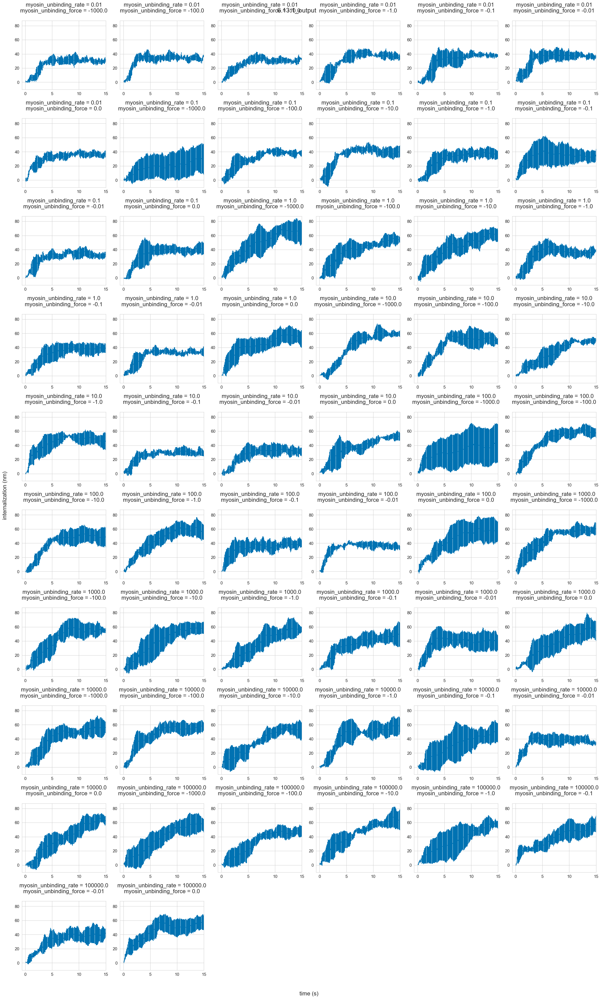
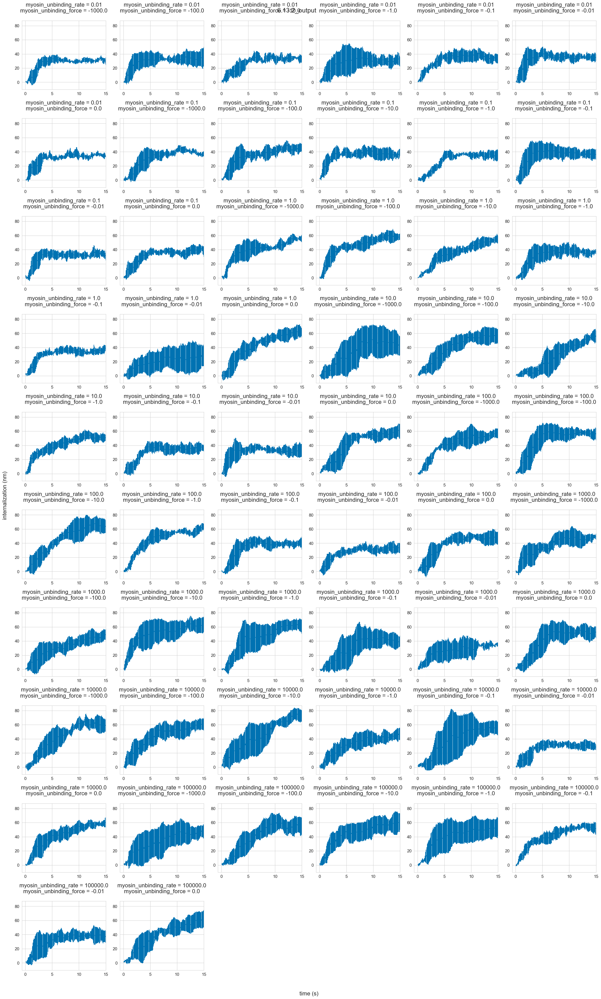
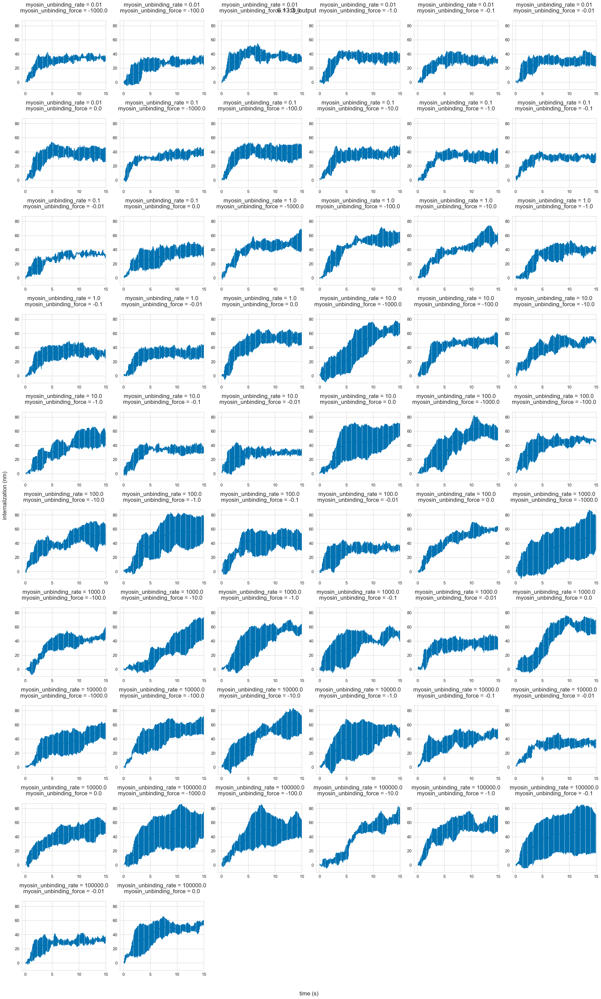

### specific overlaid means for figures

``` python
# ur, uf, speed, bc, mn
nomyo = ((100000.0, 0.0, 100.0, 200.0, 0.0),'0 myosin control','black')
assistive = ((10.0, -10.0, 100.0, 200.0, 100.0), 'Weakly force-sensitive myosin','#009E73')
resistive = ((10.0, -0.01, 100.0, 200.0, 100.0), 'Strongly force-sensitive myosin','#D55E00')


for name,label,color in [assistive,nomyo,resistive]:
    x = means.loc[name].reset_index()['time']
    y = means.loc[name]*1000
    ci95 = ci95s.loc[name]*1000
    plt.plot(x,y,label=label,color=color)
    plt.fill_between(x, y-ci95, y+ci95, color=color, alpha = 0.2)

plt.legend()
plt.xlabel('Time ($s$)')
plt.ylabel('Internalization ($nm$)')
plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_mean_solid_zpos-vs-time_fig1.png')
    plt.savefig(working_dir+'figures/'+pref+'_mean_solid_zpos-vs-time_fig1.svg')
```

### specific mean and 95 percentile for figures

``` python
# ur, uf, speed, bc, mn
nomyo = ((100000.0, 0.0, 100.0, 200.0, 0.0),'no myosin')


for name,label in [nomyo]:
    x = means.loc[name].reset_index()['time']
    y = means.loc[name]*1000
    ci95 = ci95s.loc[name]*1000
    plt.plot(x,y,label='internalization',color='black')
    plt.fill_between(x, y-ci95, y+ci95, color='black', alpha = 0.2)
    #percentile = np.percentile(means.loc[name],95)*1000
    percentile_mean = grouped_summaries.loc[
(grouped_summaries['bud_confine']==name[3])&
(grouped_summaries['membrane_myosin_number']==name[4])&
(grouped_summaries['myosin_unbinding_rate']==name[0])&
(grouped_summaries['myosin_unbinding_force']==name[1])
]['internalization_95_percentile_mean']*1000
    percentile_ci95 = grouped_summaries.loc[
(grouped_summaries['bud_confine']==name[3])&
(grouped_summaries['membrane_myosin_number']==name[4])&
(grouped_summaries['myosin_unbinding_rate']==name[0])&
(grouped_summaries['myosin_unbinding_force']==name[1])
]['internalization_95_percentile_ci95']*1000
    plt.hlines(percentile_mean,x.min(),x.max(),linestyles='-.', label='95 percentile',color='#56B4E9')
    plt.fill_between(x,
                     np.full_like(x,percentile_mean-percentile_ci95),
                     np.full_like(x,percentile_mean+percentile_ci95),
                     alpha = 0.2, color='#56B4E9')

plt.legend(loc='lower right')
plt.xlabel('time ($s$)')
plt.ylabel('internalization ($nm$)')
#plt.ylim(top=120)
plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_mean_solid_zpos-vs-time_percentile.png')
    plt.savefig(working_dir+'figures/'+pref+'_mean_solid_zpos-vs-time_percentile.svg')
```

### specific individual internalization and 95 percentile for figures

``` python
single_index = ('6.12.0_output','run0002_0000')
x = solid_allparams.loc[single_index].reset_index()['time']
y = solid_allparams.loc[single_index]['internalization']*1000
plt.plot(x,y,color='k',alpha=0.5,label='Internalization')
p95 = np.percentile(y,95)
#plt.hlines(p95,x.min(),x.max(),linestyles='-.',color='#56B4E9',label='95 percentile')
plt.hlines(p95,x.min(),x.max(),color='k',linewidth=5,label='95 Percentile')
plt.xlim(x.min(),x.max())
plt.ylim(bottom=min(y)-.05*max(y))
y_min, y_max = plt.ylim()
plt.fill_between(x,y,y2=y_min,color='k',alpha=0.1)
plt.legend(loc='lower right')

plt.xlabel('Time ($s$)')
plt.ylabel('Internalization ($nm$)')
#plt.ylim(top=120)
plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_single_solid_zpos-vs-time_percentile.png')
    plt.savefig(working_dir+'figures/'+pref+'_single_solid_zpos-vs-time_percentile.svg')
```

## cumulative histogram

plot an example internalization and cumulative histogram

``` python
internalization = solid_allparams.loc[output_dir].loc[run]['internalization']*1000
y = internalization
x = internalization.reset_index()['time']
plt.plot(x,y)
plt.xlabel('time ($s$)')
plt.ylabel('internalization ($nm$)')

plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'_solid_internalization_example.png')
```

``` python
plt.hist(internalization, 50, cumulative=True, density=True, histtype='step')
percentile = np.percentile(internalization, 95)
plt.plot([percentile, percentile], [0,1], label='95th percentile')
plt.ylabel('cumulative density')
plt.xlabel('internalization ($nm$)')
plt.legend()

plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'_solid_cumhist_percentile_example.png')
```

plot all cumulative histograms with 95 percentile internalization marked

``` python
num_plots = total_runs

width = 6
height = num_plots//width + 1

fig, ax = plt.subplots(nrows=height, ncols=width, sharex=True, sharey=True, figsize=(4*width,5*height))
fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
plt.grid(False)
fig.text(0.5, 0, 'internalization ($nm$)', ha='center', size=24)
fig.text(0, 0.5, 'cumulative density', va='center', rotation='vertical', size=24)

plot_no = 0

for output_dir in output_dirs:
    rundirs = rundirs_allparams_df.loc[output_dir]
    for run in rundirs:
        if run == 'empty':
            continue
        internalization = solid_allparams.loc[output_dir].loc[run]['internalization']*1000
        props = properties_allparams.loc[output_dir].loc[run]
        viscosity = props['internalize.cym_viscosity']
        hip1r_off = props['strongbinder_unbinding'].split(',')[0]

        plot_no += 1

        plt.subplot(height,width,plot_no) #height, width
        plt.hist(internalization, 50, cumulative=True, density=True, histtype='step')
        percentile = np.percentile(internalization, 95)
        plt.plot([percentile, percentile], [0,1])
        plt.xlim(right = 100)
        #plt.ylim(top = 100)

        title = output_dir+'\n'+run+'\n'
        for prop in property_groups:
            title += prop + ' = ' + str(props[prop]) + '\n'

        plt.title(title)

plt.tight_layout()

if save_figures == 'yes':
  plt.savefig(working_dir+'figures/'+pref+'_solid_cumhist_percentile_all.png')

```

## retraction event analysis

### exploring [Savistzky-Golay filter](https://en.wikipedia.org/wiki/Savitzky%E2%80%93Golay_filter) and local min/max

using example from [stack
overflow](https://stackoverflow.com/questions/20618804/how-to-smooth-a-curve-for-a-dataset)

``` python
single_index = ('6.12.0_output','run0002_0002')
x = solid_allparams.loc[single_index].reset_index()['time']
y = solid_allparams.loc[single_index]['internalization']*1000
plt.plot(x,y,label='raw')
for window in [10,20,40,80]:
    yhat = savgol_filter(y, window, 3) # window size 51, polynomial order 3
    plt.plot(x,yhat,label=window)

plt.xlabel('Time ($s$)')
plt.ylabel('Internalization ($nm$)')
plt.legend(title='Savitzky–Golay filter window')
plt.tight_layout()
```

``` python
single_index = ('6.12.0_output','run0002_0002')
x = solid_allparams.loc[single_index].reset_index()['time']
y = solid_allparams.loc[single_index]['internalization']*1000
for window in [5,10,20,40,80]:
    plt.figure()
    plt.plot(x,y,label='raw')
    yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
    plt.plot(x,yhat,label=window)
    minima = find_peaks(-yhat)[0]
    maxima = find_peaks(yhat)[0]
    if minima[0]>maxima[0]:
        retraction_times=0.1*(minima-maxima[:len(minima)])
        retraction_distances=yhat[minima]-yhat[maxima[:len(minima)]]
    if minima[0]<maxima[0]:
        retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
        retraction_distances=yhat[minima[1:]]-yhat[maxima[:len(minima)-1]]
    retraction_rates = -retraction_distances/retraction_times
    plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
    plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')
    plt.xlabel('Time ($s$)')
    plt.ylabel('Internalization ($nm$)')
    plt.legend(title='Savitzky–Golay filter window')
    plt.title(f'\
    {len(retraction_times)} retraction events \n\
    Sum retraction time: {sum(retraction_times):.1f} ($s$) \n\
    Sum retraction distance: {-sum(retraction_distances):.1f} ($nm$) \n\
    Mean retraction rate: {np.mean(retraction_rates):.1f} $\\pm$ {np.std(retraction_rates):.1f} ($\\frac{{nm}}{{s}}$)\
    ')
    plt.tight_layout()
```

### comparing replicates with/without myosins, overlay bound myosins

1.  lines marking start/end of retractions

    ``` python
    window=10
    width = 6

    #for bud_confine in np.sort(config_unique.bud_confine.unique()):
    for bud_confine in [200]:
        max_int = solid_allparams.loc[
                        (config_unique['bud_confine']==bud_confine)]['internalization'].max()*1000

        solid_nomyo = solid_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        num_plots = len(solid_nomyo.unstack(level=2).index)
        height = int(math.ceil(float(num_plots)/float(width)))
        figwidth =  np.min([num_plots,width])
        fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                               figsize=(4*figwidth,5*height)
                               #, layout='constrained'
                               )
        fig.add_subplot(111, frameon=False)
        plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
        plt.grid(False)
        fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
        fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

        plot_no = 0
        retraction_time_sums=[]
        retraction_distance_sums=[]
        retraction_rate_means=[]
        retraction_rate_stds=[]

        for run in solid_nomyo.unstack(level=2).index:
            solid_run = solid_nomyo.loc[run[:2]].loc[:10]
            x = solid_run.reset_index()['time']
            if x.max() < 10:
                continue
            y = solid_run['internalization']*1000

            plot_no += 1

            plt.subplot(height,figwidth,plot_no) #height, width
            plt.plot(x,y,label='raw')

            yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
            plt.plot(x,yhat,label='filtered')
            minima = find_peaks(-yhat)[0]
            maxima = find_peaks(yhat)[0]
            if len(minima) < 1 or len(maxima) < 1:
                retraction_times=0.1*[]
                retraction_distances=[]
            elif minima[0]>maxima[0]:
                retraction_times=0.1*(minima-maxima[:len(minima)])
                retraction_distances=yhat[maxima[:len(minima)]]-yhat[minima]
            elif minima[0]<maxima[0]:
                retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
                retraction_distances=yhat[maxima[:len(minima)-1]]-yhat[minima[1:]]
            retraction_rates = retraction_distances/retraction_times
            sum_retraction_times = sum(retraction_times)
            retraction_time_sums.append(sum_retraction_times)
            sum_retraction_distances = sum(retraction_distances)
            retraction_distance_sums.append(sum_retraction_distances)
            mean_retraction_rates = np.mean(retraction_rates)
            retraction_rate_means.append(mean_retraction_rates)
            std_retraction_rates = np.std(retraction_rates)
            retraction_rate_stds.append(std_retraction_rates)
            plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
            plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')

            #plt.xlim(right = 15)
            plt.ylim(top = max_int)

            #title = run[0]+'\n'+run[1]+'\n'
            plt.title(f'{run[0]}\n{run[1]}\n{len(retraction_times)} retraction events \n\
            Sum retraction time: {sum_retraction_times:.1f} ($s$) \n\
            Sum retraction distance: {sum_retraction_distances:.1f} ($nm$)\n\
            Mean retraction rate: {mean_retraction_rates:.1f} $\\pm$ {std_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\
            ')
            #plt.title(title)
            plt.legend()

        mean_sum_retraction_times = np.mean(retraction_time_sums)
        std_sum_retraction_times = np.std(retraction_time_sums)
        mean_sum_retraction_distances = np.mean(retraction_distance_sums)
        std_sum_retraction_distances = np.std(retraction_distance_sums)
        mean_mean_retraction_rates = np.mean(retraction_rate_means)
        stat_std = np.array(retraction_rate_means).std(ddof=1)
        n = np.array(retraction_rate_means).shape[0]
        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
        ci95_mean_retraction_rates = t_statistic * (stat_std / np.sqrt(n))
        filename=''
        for prop in list(config_unique):
            filename += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

        wrap_size = figwidth*30
        title=f'Mean sum retraction time: {mean_sum_retraction_times:.2f} $\\pm$\
        {std_sum_retraction_times:.2f} ($s$)\n\
        Mean sum retraction distance: {mean_sum_retraction_distances:.2f} $\\pm$\
        {std_sum_retraction_distances:.2f} ($nm$)\n\
        Mean mean retraction rate: {mean_mean_retraction_rates:.1f} $\\pm$\
        {ci95_mean_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\n\
        '+textwrap.fill(filename[:-2],wrap_size)
        fig.suptitle(title)
        plt.tight_layout()

        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+
                        filename.replace(' ','').replace('\n','')+
                        '_internalization_individual.svg')

        #for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
        for membrane_myosin_number in [100]:
            if membrane_myosin_number == 0:
                continue
            #for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_rate in [0.01,0.1]:
                #for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                for myosin_unbinding_force in [-0.01,-0.1]:
                    indices = (
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)
                        )
                    solid_myo = solid_allparams.loc[indices]
                    bound_myos = myos_bound_allparams.loc[indices]

                    num_plots = len(solid_myo.unstack(level=2).index)
                    height = int(math.ceil(float(num_plots)/float(width)))
                    figwidth =  np.min([num_plots,width])
                    fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                                        figsize=(4*figwidth,5*height)
                                        #, layout='constrained'
                                        )
                    fig.add_subplot(111, frameon=False)
                    plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
                    plt.grid(False)
                    fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
                    fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

                    plot_no = 0
                    retraction_time_sums=[]
                    retraction_distance_sums=[]
                    retraction_rate_means=[]
                    retraction_rate_stds=[]

                    for run in solid_myo.unstack(level=2).index:
                        solid_run = solid_myo.loc[run[:2]].loc[:10]
                        bound_myos_run = bound_myos[run[:2]].loc[:10]
                        x = solid_run.reset_index()['time']
                        if x.max() < 10:
                            continue
                        y = solid_run['internalization']*1000

                        plot_no += 1

                        plt.subplot(height,figwidth,plot_no) #height, width
                        plt.plot(x,y,label='raw')

                        yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
                        plt.plot(x,yhat,label='filtered')
                        minima = find_peaks(-yhat)[0]
                        maxima = find_peaks(yhat)[0]
                        if len(minima) < 1 or len(maxima) < 1:
                            retraction_times=0.1*[]
                            retraction_distances=[]
                        elif minima[0]>maxima[0]:
                            retraction_times=0.1*(minima-maxima[:len(minima)])
                            retraction_distances=yhat[maxima[:len(minima)]]-yhat[minima]
                        elif minima[0]<maxima[0]:
                            retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
                            retraction_distances=yhat[maxima[:len(minima)-1]]-yhat[minima[1:]]
                        retraction_rates = retraction_distances/retraction_times
                        sum_retraction_times = sum(retraction_times)
                        retraction_time_sums.append(sum_retraction_times)
                        sum_retraction_distances = sum(retraction_distances)
                        retraction_distance_sums.append(sum_retraction_distances)
                        mean_retraction_rates = np.mean(retraction_rates)
                        retraction_rate_means.append(mean_retraction_rates)
                        std_retraction_rates = np.std(retraction_rates)
                        retraction_rate_stds.append(std_retraction_rates)
                        plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
                        plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')

                        plt.plot(x,bound_myos_run,label='bound myosins')

                        #plt.xlim(right = 15)
                        plt.ylim(top = max_int)

                        #title = run[0]+'\n'+run[1]+'\n'
                        plt.title(f'{run[0]}\n{run[1]}\n{len(retraction_times)} retraction events \n\
                        Sum retraction time: {sum_retraction_times:.1f} ($s$) \n\
                        Sum retraction distance: {sum_retraction_distances:.1f} ($nm$)\n\
                        Mean retraction rate: {mean_retraction_rates:.1f} $\\pm$ {std_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\
                        ')
                        #plt.title(title)
                        plt.legend()

                    mean_sum_retraction_times = np.mean(retraction_time_sums)
                    std_sum_retraction_times = np.std(retraction_time_sums)
                    mean_sum_retraction_distances = np.mean(retraction_distance_sums)
                    std_sum_retraction_distances = np.std(retraction_distance_sums)
                    mean_mean_retraction_rates = np.mean(retraction_rate_means)
                    stat_std = np.array(retraction_rate_means).std(ddof=1)
                    n = np.array(retraction_rate_means).shape[0]
                    t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                    ci95_mean_retraction_rates = t_statistic * (stat_std / np.sqrt(n))
                    filename=''
                    for prop in list(config_unique):
                        filename += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

                    wrap_size = figwidth*30
                    title=f'Mean sum retraction time: {mean_sum_retraction_times:.2f} $\\pm$\
                    {std_sum_retraction_times:.2f} ($s$)\n\
                    Mean sum retraction distance: {mean_sum_retraction_distances:.2f} $\\pm$\
                    {std_sum_retraction_distances:.2f} ($nm$)\n\
                    Mean mean retraction rate: {mean_mean_retraction_rates:.1f} $\\pm$\
                    {ci95_mean_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\n\
                    '+textwrap.fill(filename[:-2],wrap_size)
                    fig.suptitle(title)
                    plt.tight_layout()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+
                                    filename.replace(' ','').replace('\n','')+
                                    '_internalization_individual.svg')
    ```

2.  shaded retractions

    ``` python
    window=10
    width = 6

    #for bud_confine in np.sort(config_unique.bud_confine.unique()):
    for bud_confine in [200]:
        max_int = solid_allparams.loc[
                        (config_unique['bud_confine']==bud_confine)]['internalization'].max()*1000

        solid_nomyo = solid_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        num_plots = len(solid_nomyo.unstack(level=2).index)
        height = int(math.ceil(float(num_plots)/float(width)))
        figwidth =  np.min([num_plots,width])
        fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                               figsize=(4*figwidth,5*height)
                               #, layout='constrained'
                               )
        fig.add_subplot(111, frameon=False)
        plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
        plt.grid(False)
        fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
        fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

        plot_no = 0
        retraction_time_sums=[]
        retraction_distance_sums=[]
        retraction_rate_means=[]
        retraction_rate_stds=[]

        for run in solid_nomyo.unstack(level=2).index:
            solid_run = solid_nomyo.loc[run[:2]].loc[:10]
            x = solid_run.reset_index()['time']
            if x.max() < 10:
                continue
            y = solid_run['internalization']*1000

            plot_no += 1

            plt.subplot(height,figwidth,plot_no) #height, width
            plt.plot(x,y,label='raw')

            yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
            plt.plot(x,yhat,label='filtered')
            minima = find_peaks(-yhat)[0]
            maxima = find_peaks(yhat)[0]
            if len(minima) < 1 or len(maxima) < 1:
                retraction_times=0.1*[]
                retraction_distances=[]
            elif minima[0]>maxima[0]:
                retraction_times=0.1*(minima-maxima[:len(minima)])
                retraction_distances=yhat[maxima[:len(minima)]]-yhat[minima]
            elif minima[0]<maxima[0]:
                retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
                retraction_distances=yhat[maxima[:len(minima)-1]]-yhat[minima[1:]]
            retraction_rates = retraction_distances/retraction_times
            sum_retraction_times = sum(retraction_times)
            retraction_time_sums.append(sum_retraction_times)
            sum_retraction_distances = sum(retraction_distances)
            retraction_distance_sums.append(sum_retraction_distances)
            mean_retraction_rates = np.mean(retraction_rates)
            retraction_rate_means.append(mean_retraction_rates)
            std_retraction_rates = np.std(retraction_rates)
            retraction_rate_stds.append(std_retraction_rates)
            #plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
            #plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')

            first_label = True
            if len(minima) > 0 and len(maxima) > 0:
                if minima[0] > maxima[0]:
                    for i in range(len(minima)):
                        label = 'retraction' if first_label else None
                        plt.fill_between(x[maxima[i]:minima[i]+1],
                                        min(yhat),
                                        yhat[maxima[i]:minima[i]+1],
                                        color='red', alpha=0.1, label=label)
                        first_label = False  # Ensure the label appears only once
                elif minima[0] < maxima[0] and len(minima) > 1:
                    for i in range(len(minima) - 1):
                        label = 'retraction' if first_label else None
                        plt.fill_between(x[maxima[i]:minima[i+1]+1],
                                        min(yhat),
                                        yhat[maxima[i]:minima[i+1]+1],
                                        color='red', alpha=0.1, label=label)
                        first_label = False  # Ensure the label appears only once

            #plt.xlim(right = 15)
            plt.ylim(top = max_int)

            #title = run[0]+'\n'+run[1]+'\n'
            plt.title(f'{run[0]}\n{run[1]}\n{len(retraction_times)} retraction events \n\
            Sum retraction time: {sum_retraction_times:.1f} ($s$) \n\
            Sum retraction distance: {sum_retraction_distances:.1f} ($nm$)\n\
            Mean retraction rate: {mean_retraction_rates:.1f} $\\pm$ {std_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\
            ')
            #plt.title(title)
            plt.legend()

        mean_sum_retraction_times = np.mean(retraction_time_sums)
        std_sum_retraction_times = np.std(retraction_time_sums)
        mean_sum_retraction_distances = np.mean(retraction_distance_sums)
        std_sum_retraction_distances = np.std(retraction_distance_sums)
        mean_mean_retraction_rates = np.mean(retraction_rate_means)
        stat_std = np.array(retraction_rate_means).std(ddof=1)
        n = np.array(retraction_rate_means).shape[0]
        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
        ci95_mean_retraction_rates = t_statistic * (stat_std / np.sqrt(n))
        filename=''
        for prop in list(config_unique):
            filename += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

        wrap_size = figwidth*30
        title=f'Mean sum retraction time: {mean_sum_retraction_times:.2f} $\\pm$\
        {std_sum_retraction_times:.2f} ($s$)\n\
        Mean sum retraction distance: {mean_sum_retraction_distances:.2f} $\\pm$\
        {std_sum_retraction_distances:.2f} ($nm$)\n\
        Mean mean retraction rate: {mean_mean_retraction_rates:.1f} $\\pm$\
        {ci95_mean_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\n\
        '+textwrap.fill(filename[:-2],wrap_size)
        fig.suptitle(title)
        plt.tight_layout()

        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+
                        filename.replace(' ','').replace('\n','')+
                        '_internalization_individual.svg')
            print(filename)

        #for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
        for membrane_myosin_number in [100]:
            if membrane_myosin_number == 0:
                continue
            #for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_rate in [0.01,0.1]:
                #for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                for myosin_unbinding_force in [-0.01,-0.1]:
                    indices = (
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)
                        )
                    solid_myo = solid_allparams.loc[indices]
                    bound_myos = myos_bound_allparams.loc[indices]

                    num_plots = len(solid_myo.unstack(level=2).index)
                    height = int(math.ceil(float(num_plots)/float(width)))
                    figwidth =  np.min([num_plots,width])
                    fig, ax = plt.subplots(nrows=height, ncols=figwidth, sharex=True, sharey=True,
                                        figsize=(4*figwidth,5*height)
                                        #, layout='constrained'
                                        )
                    fig.add_subplot(111, frameon=False)
                    plt.tick_params(labelcolor='none', top='off', bottom='off', left='off', right='off')
                    plt.grid(False)
                    fig.text(0.5, 0, 'time ($s$)', ha='center', size=24)
                    fig.text(0, 0.5, 'internalization ($nm$)', va='center', rotation='vertical', size=24)

                    plot_no = 0
                    retraction_time_sums=[]
                    retraction_distance_sums=[]
                    retraction_rate_means=[]
                    retraction_rate_stds=[]

                    for run in solid_myo.unstack(level=2).index:
                        solid_run = solid_myo.loc[run[:2]].loc[:10]
                        bound_myos_run = bound_myos[run[:2]].loc[:10]
                        x = solid_run.reset_index()['time']
                        if x.max() < 10:
                            continue
                        y = solid_run['internalization']*1000

                        plot_no += 1

                        plt.subplot(height,figwidth,plot_no) #height, width
                        plt.plot(x,y,label='raw')

                        yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
                        plt.plot(x,yhat,label='filtered')
                        minima = find_peaks(-yhat)[0]
                        maxima = find_peaks(yhat)[0]
                        if len(minima) < 1 or len(maxima) < 1:
                            retraction_times=0.1*[]
                            retraction_distances=[]
                        elif minima[0]>maxima[0]:
                            retraction_times=0.1*(minima-maxima[:len(minima)])
                            retraction_distances=yhat[maxima[:len(minima)]]-yhat[minima]
                        elif minima[0]<maxima[0]:
                            retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
                            retraction_distances=yhat[maxima[:len(minima)-1]]-yhat[minima[1:]]
                        retraction_rates = retraction_distances/retraction_times
                        sum_retraction_times = sum(retraction_times)
                        retraction_time_sums.append(sum_retraction_times)
                        sum_retraction_distances = sum(retraction_distances)
                        retraction_distance_sums.append(sum_retraction_distances)
                        mean_retraction_rates = np.mean(retraction_rates)
                        retraction_rate_means.append(mean_retraction_rates)
                        std_retraction_rates = np.std(retraction_rates)
                        retraction_rate_stds.append(std_retraction_rates)
                        #plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
                        #plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')
                        plt.plot(x,bound_myos_run,label='bound myosins')

                        first_label = True
                        if len(minima) > 0 and len(maxima) > 0:
                            if minima[0] > maxima[0]:
                                for i in range(len(minima)):
                                    label = 'retraction' if first_label else None
                                    plt.fill_between(x[maxima[i]:minima[i]+1],
                                                    min(yhat),
                                                    yhat[maxima[i]:minima[i]+1],
                                                    color='red', alpha=0.1, label=label)
                                    first_label = False  # Ensure the label appears only once
                            elif minima[0] < maxima[0] and len(minima) > 1:
                                for i in range(len(minima) - 1):
                                    label = 'retraction' if first_label else None
                                    plt.fill_between(x[maxima[i]:minima[i+1]+1],
                                                    min(yhat),
                                                    yhat[maxima[i]:minima[i+1]+1],
                                                    color='red', alpha=0.1, label=label)
                                    first_label = False  # Ensure the label appears only once

                        #plt.xlim(right = 15)
                        plt.ylim(top = max_int)

                        #title = run[0]+'\n'+run[1]+'\n'
                        plt.title(f'{run[0]}\n{run[1]}\n{len(retraction_times)} retraction events \n\
                        Sum retraction time: {sum_retraction_times:.1f} ($s$) \n\
                        Sum retraction distance: {sum_retraction_distances:.1f} ($nm$)\n\
                        Mean retraction rate: {mean_retraction_rates:.1f} $\\pm$ {std_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\
                        ')
                        #plt.title(title)
                        plt.legend()

                    mean_sum_retraction_times = np.mean(retraction_time_sums)
                    std_sum_retraction_times = np.std(retraction_time_sums)
                    mean_sum_retraction_distances = np.mean(retraction_distance_sums)
                    std_sum_retraction_distances = np.std(retraction_distance_sums)
                    mean_mean_retraction_rates = np.mean(retraction_rate_means)
                    stat_std = np.array(retraction_rate_means).std(ddof=1)
                    n = np.array(retraction_rate_means).shape[0]
                    t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                    ci95_mean_retraction_rates = t_statistic * (stat_std / np.sqrt(n))
                    filename=''
                    for prop in list(config_unique):
                        filename += prop + '=' + str(config_unique.loc[run[:2]][prop]) + ', '#+ '\n'

                    wrap_size = figwidth*30
                    title=f'Mean sum retraction time: {mean_sum_retraction_times:.2f} $\\pm$\
                    {std_sum_retraction_times:.2f} ($s$)\n\
                    Mean sum retraction distance: {mean_sum_retraction_distances:.2f} $\\pm$\
                    {std_sum_retraction_distances:.2f} ($nm$)\n\
                    Mean mean retraction rate: {mean_mean_retraction_rates:.1f} $\\pm$\
                    {ci95_mean_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\n\
                    '+textwrap.fill(filename[:-2],wrap_size)
                    fig.suptitle(title)
                    plt.tight_layout()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+
                                    filename.replace(' ','').replace('\n','')+
                                    '_internalization_individual.svg')
                        print(filename)
    ```

3.  picking single plot for figure

    ``` python
    run = solid_nomyo.unstack(level=2).index[6]
    solid_run = solid_nomyo.loc[run[:2]].loc[:10]
    x = solid_run.reset_index()['time']
    y = solid_run['internalization']*1000

    plt.plot(x,y,label='raw')

    yhat = savgol_filter(y, window, 4) # window size 51, polynomial order 3
    plt.plot(x,yhat,label='filtered')
    minima = find_peaks(-yhat)[0]
    maxima = find_peaks(yhat)[0]
    if len(minima) < 1 or len(maxima) < 1:
        retraction_times=0.1*[]
        retraction_distances=[]
    elif minima[0]>maxima[0]:
        retraction_times=0.1*(minima-maxima[:len(minima)])
        retraction_distances=yhat[maxima[:len(minima)]]-yhat[minima]
    elif minima[0]<maxima[0]:
        retraction_times=0.1*(minima[1:]-maxima[:len(minima)-1])
        retraction_distances=yhat[maxima[:len(minima)-1]]-yhat[minima[1:]]
    retraction_rates = retraction_distances/retraction_times
    sum_retraction_times = sum(retraction_times)
    retraction_time_sums.append(sum_retraction_times)
    sum_retraction_distances = sum(retraction_distances)
    retraction_distance_sums.append(sum_retraction_distances)
    mean_retraction_rates = np.mean(retraction_rates)
    retraction_rate_means.append(mean_retraction_rates)
    std_retraction_rates = np.std(retraction_rates)
    retraction_rate_stds.append(std_retraction_rates)
    #plt.vlines(0.1*(minima+1),min(y),max(y),color='green',label='local min')
    #plt.vlines(0.1*(maxima+1),min(y),max(y),color='red',label='local max')

    first_label = True
    if len(minima) > 0 and len(maxima) > 0:
        if minima[0] > maxima[0]:
            for i in range(len(minima)):
                label = 'retraction' if first_label else None
                plt.fill_between(x[maxima[i]:minima[i]+1],
                                0,
                                yhat[maxima[i]:minima[i]+1],
                                color='red', alpha=0.1, label=label)
                first_label = False  # Ensure the label appears only once
        elif minima[0] < maxima[0] and len(minima) > 1:
            for i in range(len(minima) - 1):
                label = 'retraction' if first_label else None
                plt.fill_between(x[maxima[i]:minima[i+1]+1],
                                0,
                                yhat[maxima[i]:minima[i+1]+1],
                                color='red', alpha=0.1, label=label)
                first_label = False  # Ensure the label appears only once

    #plt.xlim(right = 15)
    #plt.ylim(top = max_int)

    #title = run[0]+'\n'+run[1]+'\n'
    plt.title(f'{run[0]}\n{run[1]}\n{len(retraction_times)} retraction events \n\
    Sum retraction time: {sum_retraction_times:.1f} ($s$) \n\
    Sum retraction distance: {sum_retraction_distances:.1f} ($nm$)\n\
    Mean retraction rate: {mean_retraction_rates:.1f} $\\pm$ {std_retraction_rates:.1f} ($\\frac{{nm}}{{s}}$)\
    ')
    #plt.title(title)

    plt.xlabel('time ($s$)')
    plt.ylabel('internalization ($nm$)')
    plt.legend()
    plt.tight_layout()

    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_'+
                    '_internalization_retraction_figure.svg')
    ```

## number of simulations scatter plots

### motile myosins

``` python
width = 3
height = 4

fig = plt.figure()
fig.set_size_inches(6*width,5*height)

plot_no = 1

for bud_confine in np.sort(config_unique.bud_confine.unique()):
  confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
  for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
    if membrane_myosin_number == 0:
      continue
    subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
    x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
    #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
    y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
    y.replace([np.inf, -np.inf], 0, inplace=True)
    y = np.array(y)
    z = np.array(pd.to_numeric(subset_grouped_summaries['sim_count']))

    idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

    ax = fig.add_subplot(height, width, plot_no)
    #plt.figure()
    #plt.contourf(x[idx],y[idx],z[idx])
    plt.scatter(y,x,c=z,alpha=1,linewidths=10)
    ax.set_yscale('symlog', linthresh=0.1)
    #ax.set_yscale('symlog', linthresh=0.001)
    ax.set_xscale('symlog', linthresh=0.002)
    ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
    #ax.set_ylabel('catch bond strength ($pN^{-1}$)')
    ax.set_xlabel('Distance parameter $d$ ($nm$)')
    plt.plasma()
    plt.colorbar(label='number of simulations analyzed')
    ax.set_title('Spring constant = '+str(bud_confine/1000) + '\n' +
              str(int(membrane_myosin_number)) + ' myosins')

    plot_no += 1
plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_motile_sim_count_scatter_inverse.png')
    plt.savefig(working_dir+'figures/'+pref+'_motile_sim_count_scatter_inverse.svg')
```

### immotile myosins

``` python
width = 3
height = 4

fig = plt.figure()
fig.set_size_inches(6*width,5*height)

plot_no = 1

for bud_confine in np.sort(config_unique.bud_confine.unique()):
  confine_grouped_summaries = immotile_grouped_summaries[immotile_grouped_summaries['bud_confine']==bud_confine]
  for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
    if membrane_myosin_number == 0:
      continue
    subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
    x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
    #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
    y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
    y.replace([np.inf, -np.inf], 0, inplace=True)
    y = np.array(y)
    z = np.array(pd.to_numeric(subset_grouped_summaries['sim_count']))

    idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

    ax = fig.add_subplot(height, width, plot_no)
    #plt.figure()
    #plt.contourf(x[idx],y[idx],z[idx])
    plt.scatter(y,x,c=z,alpha=1,linewidths=10)
    ax.set_yscale('symlog', linthresh=0.1)
    #ax.set_yscale('symlog', linthresh=0.001)
    ax.set_xscale('symlog', linthresh=0.002)
    ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
    #ax.set_ylabel('catch bond strength ($pN^{-1}$)')
    ax.set_xlabel('Distance parameter $d$ ($nm$)')
    plt.plasma()
    plt.colorbar(label='number of simulations analyzed')
    ax.set_title('Spring constant = '+str(bud_confine/1000) + '\n' +
              str(int(membrane_myosin_number)) + ' myosins')

    plot_no += 1
plt.tight_layout()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_immotile_sim_count_scatter_inverse.png')
    plt.savefig(working_dir+'figures/'+pref+'_immotile_sim_count_scatter_inverse.svg')
```

## measurement contour maps

### raw

1.  all copy numbers

    1.  motile

        ``` python
        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              minvalue = subset_grouped_summaries[statistic].min()
              maxvalue = subset_grouped_summaries[statistic].max()
              if np.abs(minvalue) > vrange:
                vrange = np.abs(minvalue)
              if np.abs(maxvalue) > vrange:
                vrange = np.abs(maxvalue)
              if minvalue < lrange:
                lrange = minvalue
              if maxvalue > urange:
                urange = maxvalue

          width = 3
          height = 4

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
              y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
              y.replace([np.inf, -np.inf], 0, inplace=True)
              y = np.array(y)
              z = np.array(pd.to_numeric(subset_grouped_summaries[statistic]))

              idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

              ax = fig.add_subplot(height, width, plot_no)

              #colorscale = colors.CenteredNorm(vcenter=0)
              colorscale = colors.CenteredNorm(vcenter=0, halfrange=vrange)
              #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
              #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
              plt.contourf(y[idx],x[idx],z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
              ax.set_yscale('symlog', linthresh=0.1)
              #ax.set_yscale('symlog', linthresh=0.001)
              ax.set_xscale('symlog', linthresh=0.002)
              ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
              #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
              #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
              ax.set_xlabel('Distance parameter $d$ ($nm$)')
              #plt.plasma()
              plt.colorbar(label=statistic)
              ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins')
              #print(plot_no)

              plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_motile_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_motile_contour_6.svg')
        ```

    2.  immotile

        ``` python
        immotile_config_unique = config_unique.loc[config_unique['myosin_max_speed']==0]

        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              minvalue = subset_grouped_summaries[statistic].min()
              maxvalue = subset_grouped_summaries[statistic].max()
              if np.abs(minvalue) > vrange:
                vrange = np.abs(minvalue)
              if np.abs(maxvalue) > vrange:
                vrange = np.abs(maxvalue)
              if minvalue < lrange:
                lrange = minvalue
              if maxvalue > urange:
                urange = maxvalue

          width = 1
          height = 1

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(immotile_config_unique.bud_confine.unique()):
            confine_grouped_summaries = immotile_grouped_summaries[immotile_grouped_summaries['bud_confine']==bud_confine]
            for membrane_myosin_number in np.sort(immotile_config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
              y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
              y.replace([np.inf, -np.inf], 0, inplace=True)
              y = np.array(y)
              z = np.array(pd.to_numeric(subset_grouped_summaries[statistic]))

              idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

              ax = fig.add_subplot(height, width, plot_no)

              #colorscale = colors.CenteredNorm(vcenter=0)
              colorscale = colors.CenteredNorm(vcenter=0, halfrange=vrange)
              #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
              #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
              plt.contourf(y[idx],x[idx],z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
              ax.set_yscale('symlog', linthresh=0.1)
              #ax.set_yscale('symlog', linthresh=0.001)
              ax.set_xscale('symlog', linthresh=0.002)
              ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
              #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
              #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
              ax.set_xlabel('Distance parameter $d$ ($nm$)')
              #plt.plasma()
              plt.colorbar(label=statistic)
              ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins')
              #print(plot_no)

              plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_immotile_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_immotile_contour_6.svg')
        ```

2.  100 myosins

    1.  motile

        ``` python
        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            membrane_myosin_number = 100
            # for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            #   if membrane_myosin_number == 0:
            #     continue
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            minvalue = subset_grouped_summaries[statistic].min()
            maxvalue = subset_grouped_summaries[statistic].max()
            if np.abs(minvalue) > vrange:
              vrange = np.abs(minvalue)
            if np.abs(maxvalue) > vrange:
              vrange = np.abs(maxvalue)
            if minvalue < lrange:
              lrange = minvalue
            if maxvalue > urange:
              urange = maxvalue

          width = 1
          height = 4

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            # for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            #   if membrane_myosin_number == 0:
            #     continue
            membrane_myosin_number = 100
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
            y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
            y.replace([np.inf, -np.inf], 0, inplace=True)
            y = np.array(y)
            z = np.array(pd.to_numeric(subset_grouped_summaries[statistic]))

            idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

            ax = fig.add_subplot(height, width, plot_no)

            #colorscale = colors.CenteredNorm(vcenter=0)
            colorscale = colors.CenteredNorm(vcenter=0, halfrange=vrange)
            #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
            #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
            plt.contourf(y[idx],x[idx],z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
            ax.set_yscale('symlog', linthresh=0.1)
            #ax.set_yscale('symlog', linthresh=0.001)
            ax.set_xscale('symlog', linthresh=0.002)
            ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
            #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
            #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
            ax.set_xlabel('Distance parameter $d$ ($nm$)')
            #plt.plasma()
            plt.colorbar(label=statistic)
            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                      str(int(membrane_myosin_number)) + ' myosins')
            #print(plot_no)

            plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_100myo_motile_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_100myo_motile_contour_6.svg')
        ```

    2.  immotile

        ``` python
        immotile_config_unique = config_unique.loc[config_unique['myosin_max_speed']==0]

        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            membrane_myosin_number = 100
            # for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            #   if membrane_myosin_number == 0:
            #     continue
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            minvalue = subset_grouped_summaries[statistic].min()
            maxvalue = subset_grouped_summaries[statistic].max()
            if np.abs(minvalue) > vrange:
              vrange = np.abs(minvalue)
            if np.abs(maxvalue) > vrange:
              vrange = np.abs(maxvalue)
            if minvalue < lrange:
              lrange = minvalue
            if maxvalue > urange:
              urange = maxvalue

          width = 1
          height = 1

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(immotile_config_unique.bud_confine.unique()):
            confine_grouped_summaries = immotile_grouped_summaries[immotile_grouped_summaries['bud_confine']==bud_confine]
            # for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            #   if membrane_myosin_number == 0:
            #     continue
            membrane_myosin_number = 100
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
            y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
            y.replace([np.inf, -np.inf], 0, inplace=True)
            y = np.array(y)
            z = np.array(pd.to_numeric(subset_grouped_summaries[statistic]))

            idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

            ax = fig.add_subplot(height, width, plot_no)

            #colorscale = colors.CenteredNorm(vcenter=0)
            colorscale = colors.CenteredNorm(vcenter=0, halfrange=vrange)
            #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
            #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
            plt.contourf(y[idx],x[idx],z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
            ax.set_yscale('symlog', linthresh=0.1)
            #ax.set_yscale('symlog', linthresh=0.001)
            ax.set_xscale('symlog', linthresh=0.002)
            ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
            #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
            #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
            ax.set_xlabel('Distance parameter $d$ ($nm$)')
            #plt.plasma()
            plt.colorbar(label=statistic)
            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                      str(int(membrane_myosin_number)) + ' myosins')
            #print(plot_no)

            plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_100myo_immotile_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_100myo_immotile_contour_6.svg')
        ```

### relative to no myosin

1.  all copy numbers

    1.  motile

        ``` python
        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              mindelta = (subset_grouped_summaries[statistic].min()-nomyo_z)/nomyo_z
              maxdelta = (subset_grouped_summaries[statistic].max()-nomyo_z)/nomyo_z
              if np.abs(mindelta) > vrange:
                vrange = np.abs(mindelta)
              if np.abs(maxdelta) > vrange:
                vrange = np.abs(maxdelta)
              if mindelta < lrange:
                lrange = mindelta
              if maxdelta > urange:
                urange = maxdelta

          width = 3
          height = 4

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
              #y = 1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
              #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
              y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
              y.replace([np.inf, -np.inf], 0, inplace=True)
              y = np.array(y)
              z = np.array((pd.to_numeric(subset_grouped_summaries[statistic])-nomyo_z)/nomyo_z)

              idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

              ax = fig.add_subplot(height, width, plot_no)

              colorscale = colors.CenteredNorm(vcenter=0, halfrange=100*vrange)
              #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
              #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
              plt.contourf(y[idx],x[idx],100*z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
              ax.set_yscale('symlog', linthresh=0.1)
              #ax.set_yscale('symlog', linthresh=0.001)
              ax.set_xscale('symlog', linthresh=0.002)
              ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
              #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
              #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
              ax.set_xlabel('Distance parameter $d$ ($nm$)')
              #plt.plasma()
              plt.colorbar(label='% Δ '+statistic)
              ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins')
              #print(plot_no)

              plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_motile_difference_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_motile_difference_contour_6.svg')
        ```

    2.  immotile

        ``` python
        immotile_config_unique = config_unique.loc[config_unique['myosin_max_speed']==0]

        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              mindelta = (subset_grouped_summaries[statistic].min()-nomyo_z)/nomyo_z
              maxdelta = (subset_grouped_summaries[statistic].max()-nomyo_z)/nomyo_z
              if np.abs(mindelta) > vrange:
                vrange = np.abs(mindelta)
              if np.abs(maxdelta) > vrange:
                vrange = np.abs(maxdelta)
              if mindelta < lrange:
                lrange = mindelta
              if maxdelta > urange:
                urange = maxdelta

          width = 1
          height = 1

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(immotile_config_unique.bud_confine.unique()):
            confine_grouped_summaries = immotile_grouped_summaries[immotile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            for membrane_myosin_number in np.sort(immotile_config_unique.membrane_myosin_number.unique()):
              if membrane_myosin_number == 0:
                continue
              subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
              x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
              #y = 1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
              #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
              y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
              y.replace([np.inf, -np.inf], 0, inplace=True)
              y = np.array(y)
              z = np.array((pd.to_numeric(subset_grouped_summaries[statistic])-nomyo_z)/nomyo_z)

              idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

              ax = fig.add_subplot(height, width, plot_no)

              colorscale = colors.CenteredNorm(vcenter=0, halfrange=100*vrange)
              #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
              #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
              plt.contourf(y[idx],x[idx],100*z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
              ax.set_yscale('symlog', linthresh=0.1)
              #ax.set_yscale('symlog', linthresh=0.001)
              ax.set_xscale('symlog', linthresh=0.002)
              ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
              #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
              #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
              ax.set_xlabel('Distance parameter $d$ ($nm$)')
              #plt.plasma()
              plt.colorbar(label='% Δ '+statistic)
              ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins')
              #print(plot_no)

              plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_immotile_difference_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_'+statistic+'_immotile_difference_contour_6.svg')
        ```

2.  just 100 myosins

    1.  no known myosins

        ``` python
        membrane_myosin_number = 100
        for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            mindelta = (subset_grouped_summaries[statistic].min()-nomyo_z)/nomyo_z
            maxdelta = (subset_grouped_summaries[statistic].max()-nomyo_z)/nomyo_z
            if np.abs(mindelta) > vrange:
              vrange = np.abs(mindelta)
            if np.abs(maxdelta) > vrange:
              vrange = np.abs(maxdelta)
            if mindelta < lrange:
              lrange = mindelta
            if maxdelta > urange:
              urange = maxdelta

          width = 1
          height = 4

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
            #y = 1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
            #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
            y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
            y.replace([np.inf, -np.inf], 0, inplace=True)
            y = np.array(y)
            z = np.array((pd.to_numeric(subset_grouped_summaries[statistic])-nomyo_z)/nomyo_z)

            idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

            ax = fig.add_subplot(height, width, plot_no)

            colorscale = colors.CenteredNorm(vcenter=0, halfrange=100*vrange)
            #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
            #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
            plt.contourf(y[idx],x[idx],100*z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
            ax.set_yscale('symlog', linthresh=0.1)
            #ax.set_yscale('symlog', linthresh=0.001)
            ax.set_xscale('symlog', linthresh=0.002)
            ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
            #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
            #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
            ax.set_xlabel('Distance parameter $d$ ($nm$)')
            #plt.plasma()
            plt.colorbar(label='% Δ '+statistic)
            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                      str(int(membrane_myosin_number)) + ' myosins')
            #print(plot_no)

            plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_100myo_'+statistic+'_motile_difference_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_100myo_'+statistic+'_motile_difference_contour_6.svg')
        ```

    2.  with known myosins

        myo5 from \[cite:@pedersen_endocytic_2023-1\] myo1b from
        \[cite:@laakso_myosin_2008\] myo1ba-d from
        \[cite:@laakso_control_2010\] myo1c from
        \[cite:@greenberg_myosin_2012\]

        ``` python
        membrane_myosin_number = 100
        #for statistic in ['efficiency_associated_last5s_mean_mean']:
        for statistic in ['internalization_95_percentile_mean']:
        #for statistic in list(grouped_summaries):

          vrange = 0
          urange = 0
          lrange = 0

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            mindelta = (subset_grouped_summaries[statistic][~np.isinf(subset_grouped_summaries[statistic])].min()-nomyo_z)/nomyo_z
            maxdelta = (subset_grouped_summaries[statistic][~np.isinf(subset_grouped_summaries[statistic])].max()-nomyo_z)/nomyo_z
            if np.abs(mindelta) > vrange:
              vrange = np.abs(mindelta)
            if np.abs(maxdelta) > vrange:
              vrange = np.abs(maxdelta)
            if mindelta < lrange:
              lrange = mindelta
            if maxdelta > urange:
              urange = maxdelta

          width = 1
          height = 4

          fig = plt.figure()
          fig.set_size_inches(6*width,5*height)

          plot_no = 1

          for bud_confine in np.sort(config_unique.bud_confine.unique()):
            confine_grouped_summaries = motile_grouped_summaries[motile_grouped_summaries['bud_confine']==bud_confine]
            nomyo_z = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine][statistic].mean()
            subset_grouped_summaries = confine_grouped_summaries[confine_grouped_summaries['membrane_myosin_number']==membrane_myosin_number]
            x = np.array(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_rate']))
            #y = 1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
            #y = -1/pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force'])
            y = caf.ufpN_to_dnm(pd.to_numeric(subset_grouped_summaries['myosin_unbinding_force']))
            y.replace([np.inf, -np.inf], 0, inplace=True)
            y = np.array(y)
            z = np.array((pd.to_numeric(subset_grouped_summaries[statistic])-nomyo_z)/nomyo_z)

            idx=np.lexsort((y,x)).reshape(np.unique(x).shape[0],np.unique(y).shape[0])

            ax = fig.add_subplot(height, width, plot_no)

            colorscale = colors.CenteredNorm(vcenter=0, halfrange=100*vrange)
            #colorscale = colors.TwoSlopeNorm(vcenter=0, vmin=lrange, vmax=urange)
            #colorscale = colors.TwoSlopeNorm(vcenter=nomyo_z)
            plt.contourf(y[idx],x[idx],100*z[idx],6,cmap=matplotlib.colormaps['seismic'], alpha=1, norm=colorscale)
            plt.colorbar(label='% Δ '+statistic)
            #plt.colorbar(label='% Change in 95 percentile internalization')
            plt.scatter(myo5_dp,myo5_ur,label='Myo5',marker='X',s=200,color='#33ca84ff',edgecolors='k')
            plt.scatter(myo1c_dp,myo1c_ur,label='Myo1c',marker='*',s=300,color='#bac284ff',edgecolors='k')
            plt.scatter(myo1b_dp,myo1b_ur,label='Myo1b',marker='P',s=200,color='#d15f02ff',edgecolors='k')
            #plt.scatter(myo1ba_dp,myo1bIQ_ur,label='myo1ba',marker='x')
            #plt.scatter(myo1bb_dp,myo1bIQ_ur,label='myo1bb',marker='x')
            #plt.scatter(myo1bc_dp,myo1bIQ_ur,label='myo1bc',marker='x')
            #plt.scatter(myo1bIQ_dp,myo1bIQ_ur,label='myo1bIQ',marker='x')
            plt.legend(loc='upper left')
            ax.set_yscale('symlog', linthresh=0.1)
            #ax.set_yscale('symlog', linthresh=0.001)
            ax.set_xscale('symlog', linthresh=0.002)
            ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
            #ax.set_ylabel('inverse myosin unbinding force ($pN^{-1}$)')
            #ax.set_ylabel('myosin catch bond strength ($pN^{-1}$)')
            ax.set_xlabel('Distance parameter $d$ ($nm$)')
            #plt.plasma()
            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n'
                         #+ str(int(membrane_myosin_number)) + ' myosins'
                         )
            #print(plot_no)

            plot_no += 1

          plt.tight_layout()

          if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_100myo_known_'+statistic+'_motile_difference_contour_6.png')
            plt.savefig(working_dir+'figures/'+pref+'_100myo_known_'+statistic+'_motile_difference_contour_6.svg')
        ```

## measurement summary slices

### absolute

1.  all slices

    1.  motile

        ``` python
        width = 3
        height = 4

        for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:

            fig = plt.figure()
            fig.set_size_inches(7*width,5*height)

            plot_no = 1

            for bud_confine in np.sort(config_unique.bud_confine.unique()):
                for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                    if membrane_myosin_number == 0:
                        continue
                    ax = fig.add_subplot(height, width, plot_no)
                    for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                        subdf = motile_grouped_summaries.loc[
                        (motile_grouped_summaries['bud_confine']==bud_confine)&
                        (motile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)&
                        (motile_grouped_summaries['myosin_unbinding_rate']==myosin_unbinding_rate)
                        ]
                        subdf['distance_parameter']=caf.ufpN_to_dnm(subdf['myosin_unbinding_force'])
                        subdf['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                        subdf.sort_values('distance_parameter', inplace=True)
                        x = subdf['distance_parameter']
                        y = subdf[measurement+'_mean']
                        ci95 = subdf[measurement+'_ci95']
                        plt.plot(x,y,label=myosin_unbinding_rate)
                        plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                    ax.set_xscale('symlog', linthresh=0.002)
                    ax.set_ylabel(measurement)
                    ax.set_xlabel('myosin distance parameter ($nm$)')
                    ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                    ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                str(int(membrane_myosin_number)) + ' myosins')
                    #print(plot_no)

                    plot_no += 1

            plt.tight_layout()

            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_motile_means_ci95fill.png')
        ```

    2.  immotile

        ``` python
        width = 3
        height = 4

        for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:

            fig = plt.figure()
            fig.set_size_inches(7*width,5*height)

            plot_no = 1

            for bud_confine in np.sort(config_unique.bud_confine.unique()):
                for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                    if membrane_myosin_number == 0:
                        continue
                    ax = fig.add_subplot(height, width, plot_no)
                    for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                        subdf = immotile_grouped_summaries.loc[
                        (immotile_grouped_summaries['bud_confine']==bud_confine)&
                        (immotile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)&
                        (immotile_grouped_summaries['myosin_unbinding_rate']==myosin_unbinding_rate)
                        ]
                        subdf['distance_parameter']=caf.ufpN_to_dnm(subdf['myosin_unbinding_force'])
                        subdf['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                        subdf.sort_values('distance_parameter', inplace=True)
                        x = subdf['distance_parameter']
                        y = subdf[measurement+'_mean']
                        ci95 = subdf[measurement+'_ci95']
                        plt.plot(x,y,label=myosin_unbinding_rate)
                        plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                    ax.set_xscale('symlog', linthresh=0.002)
                    ax.set_ylabel(measurement)
                    ax.set_xlabel('myosin distance parameter ($nm$)')
                    ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                    ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                str(int(membrane_myosin_number)) + ' myosins')
                    #print(plot_no)

                    plot_no += 1

            plt.tight_layout()

            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_immotile_means_ci95fill.png')
        ```

2.  select slices

    ``` python
    bud_confine = 200
    myo_number = 100
    off_rates = [10,100]

    for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
        for off_rate in off_rates:
            plt.figure()
            subdf = grouped_summaries.loc[
            (grouped_summaries['bud_confine']==bud_confine)&
            (grouped_summaries['membrane_myosin_number']==0)
            ]
            subdf['distance_parameter']=0
            subdf.sort_values('distance_parameter', inplace=True)
            x = subdf['distance_parameter']
            x= [0,caf.ufpN_to_dnm(-0.01)]
            #y = subdf['internalization_95_percentile_mean']*1000
            y = subdf[measurement+'_mean']
            y = np.concatenate((y,y))
            #ci95 = subdf['internalization_95_percentile_ci95']*1000
            ci95 = subdf[measurement+'_ci95']
            ci95 = np.concatenate((ci95,ci95))
            plt.plot(x,y,label='no myosin')
            #plt.hlines(y,0,1000,label='no myosin')
            plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

            subdf = immotile_grouped_summaries.loc[
            (immotile_grouped_summaries['bud_confine']==bud_confine)&
            (immotile_grouped_summaries['membrane_myosin_number']==myo_number)&
            (immotile_grouped_summaries['myosin_unbinding_rate']==off_rate)
            ]
            subdf['distance_parameter']=caf.ufpN_to_dnm(subdf['myosin_unbinding_force'])
            subdf['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            subdf.sort_values('distance_parameter', inplace=True)
            x = subdf['distance_parameter']
            #y = subdf['internalization_95_percentile_mean']*1000
            y = subdf[measurement+'_mean']
            ci95 = subdf[measurement+'_ci95']
            #ci95 = subdf['internalization_95_percentile_ci95']*1000
            plt.plot(x,y,label='- power stroke')
            plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

            subdf = motile_grouped_summaries.loc[
            (motile_grouped_summaries['bud_confine']==bud_confine)&
            (motile_grouped_summaries['membrane_myosin_number']==myo_number)&
            (motile_grouped_summaries['myosin_unbinding_rate']==off_rate)
            ]
            subdf['distance_parameter']=caf.ufpN_to_dnm(subdf['myosin_unbinding_force'])
            subdf['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            subdf.sort_values('distance_parameter', inplace=True)
            x = subdf['distance_parameter']
            #y = subdf['internalization_95_percentile_mean']*1000
            y = subdf[measurement+'_mean']
            ci95 = subdf[measurement+'_ci95']
            #ci95 = subdf['internalization_95_percentile_ci95']*1000
            plt.plot(x,y,label='+ power stroke')
            plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

            plt.xscale('symlog', linthresh=0.002)
            plt.ylabel(measurement)
            plt.xlabel('myosin distance parameter ($nm$)')
            plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(myo_number)) + ' myosins\n'+
                    'unbinding rate = '+str(off_rate) + ' ($s^{-1}$)'
                        )
            plt.legend()
            plt.tight_layout()

            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+
                            measurement+'_'+
                            str(bud_confine)+'bc_'+
                            str(myo_number)+'mn_'+
                            str(off_rate)+'ur_'+
                            '_slice.png')
    ```

### relative to no myosin

1.  all slices

    1.  motile, all separate plots

        ``` python
        for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            for bud_confine in np.sort(config_unique.bud_confine.unique()):
                for myo_number in np.sort(config_unique.membrane_myosin_number.unique()):
                    if myo_number == 0:
                        continue
                    for off_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                        plt.figure()

                        nomyo = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine]
                        nomyo_B = nomyo[measurement+'_mean'].mean()
                        std_B = nomyo[measurement+'_std'].mean()
                        n_B = nomyo['sim_count']

                        plusmot = motile_grouped_summaries.loc[
                        (motile_grouped_summaries['bud_confine']==bud_confine)&
                        (motile_grouped_summaries['membrane_myosin_number']==myo_number)&
                        (motile_grouped_summaries['myosin_unbinding_rate']==off_rate)
                        ]
                        plusmot['distance_parameter']=caf.ufpN_to_dnm(plusmot['myosin_unbinding_force'])
                        plusmot['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                        plusmot.sort_values('distance_parameter', inplace=True)
                        plusmot_A = plusmot[measurement+'_mean']
                        motstd_A = plusmot[measurement+'_std']
                        n_A = plusmot['sim_count']
                        x = plusmot['distance_parameter']
                        y = np.array((pd.to_numeric(plusmot_A)-nomyo_B)/nomyo_B)*100
                        std = np.sqrt((np.sqrt(motstd_A**2 + std_B**2)/(plusmot_A-nomyo_B))**2 + (std_B/nomyo_B)**2)*np.abs((plusmot_A-nomyo_B)/nomyo_B)*100
                        n = np.concatenate((n_A,n_B)).min()
                        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                        ci95 = t_statistic * (std / np.sqrt(n))
                        plt.plot(x,y,label='+ power stroke')
                        plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                        plt.xscale('symlog', linthresh=0.002)
                        plt.ylabel('% Δ '+measurement)
                        plt.xlabel('myosin distance parameter ($nm$)')
                        plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                                    str(int(myo_number)) + ' myosins\n'+
                                'unbinding rate = '+str(off_rate) + ' ($s^{-1}$)'
                                    )
                        plt.legend()
                        plt.tight_layout()

                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        measurement+'_relative_'+
                                        str(bud_confine)+'bc_'+
                                        str(myo_number)+'mn_'+
                                        str(off_rate)+'ur_'+
                                        '_singleslice_95cifill.png')
        ```

    2.  motile, overlaid same plots

        ``` python
        width = 3
        height = 4
        for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            fig = plt.figure()
            fig.set_size_inches(7*width,5*height)

            plot_no = 1
            for bud_confine in np.sort(config_unique.bud_confine.unique()):
                for myo_number in np.sort(config_unique.membrane_myosin_number.unique()):
                    if myo_number == 0:
                        continue
                    ax = fig.add_subplot(height, width, plot_no)
                    for off_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                        nomyo = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine]
                        nomyo_B = nomyo[measurement+'_mean'].mean()
                        std_B = nomyo[measurement+'_std'].mean()
                        n_B = nomyo['sim_count']

                        plusmot = motile_grouped_summaries.loc[
                        (motile_grouped_summaries['bud_confine']==bud_confine)&
                        (motile_grouped_summaries['membrane_myosin_number']==myo_number)&
                        (motile_grouped_summaries['myosin_unbinding_rate']==off_rate)
                        ]
                        plusmot['distance_parameter']=caf.ufpN_to_dnm(plusmot['myosin_unbinding_force'])
                        plusmot['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                        plusmot.sort_values('distance_parameter', inplace=True)
                        plusmot_A = plusmot[measurement+'_mean']
                        motstd_A = plusmot[measurement+'_std']
                        n_A = plusmot['sim_count']
                        x = plusmot['distance_parameter']
                        y = np.array((pd.to_numeric(plusmot_A)-nomyo_B)/nomyo_B)*100
                        std = np.sqrt((np.sqrt(motstd_A**2 + std_B**2)/(plusmot_A-nomyo_B))**2 + (std_B/nomyo_B)**2)*np.abs((plusmot_A-nomyo_B)/nomyo_B)*100
                        n = np.concatenate((n_A,n_B)).min()
                        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                        ci95 = t_statistic * (std / np.sqrt(n))
                        plt.plot(x,y,label=off_rate)
                        plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                    ax.set_xscale('symlog', linthresh=0.002)
                    ax.set_ylabel('% Δ '+measurement)
                    ax.set_xlabel('myosin distance parameter ($nm$)')
                    ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                    ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                str(int(myo_number)) + ' myosins')
                    #print(plot_no)

                    plot_no += 1

            plt.tight_layout()

            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_motile_relative_ci95fill.png')
        ```

2.  select slices

    1.  motile, overlaid same plots

        ``` python
        width = 3
        height = 4
        #for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
        for measurement in [i[:-5] for i in ['internalization_95_percentile_mean'] if i.endswith('_mean')]:
            fig = plt.figure()
            fig.set_size_inches(6*width,5*height)

            plot_no = 1
            for bud_confine in np.sort(config_unique.bud_confine.unique()):
                for myo_number in np.sort(config_unique.membrane_myosin_number.unique()):
                    if myo_number == 0:
                        continue
                    ax = fig.add_subplot(height, width, plot_no)
                    for off_rate in [100,10,1,0.1]:
                        nomyo = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine]
                        nomyo_B = nomyo[measurement+'_mean'].mean()
                        std_B = nomyo[measurement+'_std'].mean()
                        n_B = nomyo['sim_count']

                        plusmot = motile_grouped_summaries.loc[
                        (motile_grouped_summaries['bud_confine']==bud_confine)&
                        (motile_grouped_summaries['membrane_myosin_number']==myo_number)&
                        (motile_grouped_summaries['myosin_unbinding_rate']==off_rate)
                        ]
                        plusmot['distance_parameter']=caf.ufpN_to_dnm(plusmot['myosin_unbinding_force'])
                        plusmot['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                        plusmot.sort_values('distance_parameter', inplace=True)
                        plusmot_A = plusmot[measurement+'_mean']
                        motstd_A = plusmot[measurement+'_std']
                        n_A = plusmot['sim_count']
                        x = plusmot['distance_parameter']
                        y = np.array((pd.to_numeric(plusmot_A)-nomyo_B)/nomyo_B)*100
                        std = np.sqrt((np.sqrt(motstd_A**2 + std_B**2)/(plusmot_A-nomyo_B))**2 + (std_B/nomyo_B)**2)*np.abs((plusmot_A-nomyo_B)/nomyo_B)*100
                        n = np.concatenate((n_A,n_B)).min()
                        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                        ci95 = t_statistic * (std / np.sqrt(n))
                        plt.plot(x,y,label=off_rate)
                        plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                    ax.set_xscale('symlog', linthresh=0.002)
                    #ax.set_ylabel('% Δ '+measurement)
                    ax.set_ylabel('% Change in 95 percentile internalization')
                    ax.set_xlabel('Distance parameter $d$ ($nm$)')
                    legend = ax.legend(title='Unloaded\ndetachment\nrate $k_0$ ($s^{-1}$)')
                    legend.get_title().set_ha('center')

                    ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                str(int(myo_number)) + ' myosins')
                    #print(plot_no)

                    plot_no += 1

            plt.tight_layout()

            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_100-0.1ur_'+measurement+'_motile_relative_ci95fill.png')
                plt.savefig(working_dir+'figures/'+pref+'_100-0.1ur_'+measurement+'_motile_relative_ci95fill.svg')
        ```

    2.  both motile and immotile

        ``` python
        bud_confine = 200
        myo_number = 100
        off_rates = [10,100]

        for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            for off_rate in off_rates:
                plt.figure()

                nomyo = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine]
                nomyo_B = nomyo[measurement+'_mean'].mean()
                std_B = nomyo[measurement+'_std'].mean()
                n_B = nomyo['sim_count']

                plusmot = motile_grouped_summaries.loc[
                (motile_grouped_summaries['bud_confine']==bud_confine)&
                (motile_grouped_summaries['membrane_myosin_number']==myo_number)&
                (motile_grouped_summaries['myosin_unbinding_rate']==off_rate)
                ]
                plusmot['distance_parameter']=caf.ufpN_to_dnm(plusmot['myosin_unbinding_force'])
                plusmot['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                plusmot.sort_values('distance_parameter', inplace=True)
                plusmot_A = plusmot[measurement+'_mean']
                motstd_A = plusmot[measurement+'_std']
                n_A = plusmot['sim_count']
                x = plusmot['distance_parameter']
                y = np.array((pd.to_numeric(plusmot_A)-nomyo_B)/nomyo_B)*100
                std = np.sqrt((np.sqrt(motstd_A**2 + std_B**2)/(plusmot_A-nomyo_B))**2 + (std_B/nomyo_B)**2)*np.abs((plusmot_A-nomyo_B)/nomyo_B)*100
                n = np.concatenate((n_A,n_B)).min()
                t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025
                ci95 = t_statistic * (std / np.sqrt(n))
                plt.plot(x,y,label='+ power stroke')
                plt.fill_between(x, y-ci95, y+ci95, alpha = 0.2)

                plusimmot = immotile_grouped_summaries.loc[
                (immotile_grouped_summaries['bud_confine']==bud_confine)&
                (immotile_grouped_summaries['membrane_myosin_number']==myo_number)&
                (immotile_grouped_summaries['myosin_unbinding_rate']==off_rate)
                ]
                plusimmot['distance_parameter']=caf.ufpN_to_dnm(plusimmot['myosin_unbinding_force'])
                plusimmot['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                plusimmot.sort_values('distance_parameter', inplace=True)
                plusimmot_A = plusimmot[measurement+'_mean']
                immotstd_A = plusimmot[measurement+'_std']
                x = plusimmot['distance_parameter']
                y = np.array((pd.to_numeric(plusimmot_A)-nomyo_B)/nomyo_B)*100
                std = np.sqrt((np.sqrt(immotstd_A**2 + std_B**2)/(plusimmot_A-nomyo_B))**2 + (std_B/nomyo_B)**2)*np.abs((plusimmot_A-nomyo_B)/nomyo_B)*100
                plt.plot(x,y,label='- power stroke')
                plt.fill_between(x, y-std, y+std, alpha = 0.2)

                plt.xscale('symlog', linthresh=0.002)
                plt.ylabel('% Δ '+measurement)
                plt.xlabel('myosin distance parameter ($nm$)')
                plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                            str(int(myo_number)) + ' myosins\n'+
                        'unbinding rate = '+str(off_rate) + ' ($s^{-1}$)'
                            )
                plt.legend()
                plt.tight_layout()

                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                measurement+'_relative_'+
                                str(bud_confine)+'bc_'+
                                str(myo_number)+'mn_'+
                                str(off_rate)+'ur_'+
                                '_slice_ci95fill.png')
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                measurement+'_relative_'+
                                str(bud_confine)+'bc_'+
                                str(myo_number)+'mn_'+
                                str(off_rate)+'ur_'+
                                '_slice_ci95fill.svg')
        ```

## barbed end direction spatial analysis

see previous examples of this in [localization of fiber
growth](id:a284de7f-30f2-45a8-b811-a542451359d8)

### testing a single simulation

1.  no myosin

    ``` python
    solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].tail()
    ```

    1.  as vector component

        ``` python
        single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
        single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
        xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
        ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
        x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y = (single_sim['plus_zpos']+0.4)*-1000
        color = single_sim['plus_zdir']*-1
        bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
                bins=30, statistic='mean', range = [[0,200],[-200,0]])
        bin_means = np.flipud(np.rot90(bin_means))
        plt.pcolormesh(xedges, yedges, bin_means,
                       cmap=matplotlib.colormaps['seismic'],
                       norm=colors.CenteredNorm(vcenter=0))
        plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
        plt.xlabel('r-distance from bud center ($nm$)')
        plt.ylabel('z-distance from membrane ($nm$)')
        plt.title('no myosin')
        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_zdir_singlesim_nomyo.png')
        ```

    2.  as angle

        ``` python
        single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
        single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
        xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
        ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
        x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y = (single_sim['plus_zpos']+0.4)*-1000
        color = single_sim['plus_zdir']*-1
        bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
                bins=30, statistic='mean', range = [[0,200],[-200,0]])
        bin_means = np.arcsin(np.flipud(np.rot90(bin_means)))*(180/np.pi)
        plt.pcolormesh(xedges, yedges, bin_means,
                       cmap=matplotlib.colormaps['seismic'],
                       norm=colors.CenteredNorm(vcenter=0, halfrange=90))
        plt.colorbar(label = 'actin barbed end z-r angle (°) \n(mean, last 5s)')
        plt.xlabel('r-distance from bud center ($nm$)')
        plt.ylabel('z-distance from membrane ($nm$)')
        plt.title('no myosin')
        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_barbedangle_singlesim_nomyo.png')
        ```

2.  assistive myosin

    finding an assistive myosin:

    ``` python
    config_unique.loc[(config_unique['myosin_unbinding_force']==-10**3)&
                      (config_unique['myosin_unbinding_rate']==10)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)].head()
    ```

    ``` python
    solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].tail()
    ```

    ``` python
    single_sim = ends_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['plus_zpos']+0.4)*-1000
    color = single_sim['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))
    plt.pcolormesh(xedges, yedges, bin_means,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_singlesim_assistivemyo.png')
    ```

3.  ressistive myosin

    finding an assistive myosin:

    ``` python
    config_unique.loc[(config_unique['myosin_unbinding_force']==-10**-2)&
                      (config_unique['myosin_unbinding_rate']==0.01)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)].head()
    ```

    ``` python
    solid_allparams.loc['6.12b.11_output'].loc['run0001_0000'].tail()
    ```

    ``` python
    single_sim = ends_allparams.loc['6.12b.11_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['plus_zpos']+0.4)*-1000
    color = single_sim['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))
    plt.pcolormesh(xedges, yedges, bin_means,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('resistive myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_singlesim_resistivemyo.png')
    ```

4.  difference between +/- assistive myosin

    ``` python
    single_assistive = ends_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_assistive['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_assistive['plus_ypos']-single_solid['ypos']
    x_assistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_assistive = (single_assistive['plus_zpos']+0.4)*-1000
    color_assistive = single_assistive['plus_zdir']*-1
    bin_means_assistive, xedges_assistive, yedges_assistive, binnumbers_assistive = binned_statistic_2d(
        x_assistive, y_assistive, color_assistive,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_assistive = np.flipud(np.rot90(bin_means_assistive))

    single_nomyo = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    xcoord_adj = single_nomyo['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_nomyo['plus_ypos']-single_solid['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (single_nomyo['plus_zpos']+0.4)*-1000
    color_nomyo = single_nomyo['plus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = bin_means_assistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'difference in actin barbed end\nz-direction (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin - no myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_singlesim_difference.png')
    ```

### averaging many simulations

1.  no myosin

    ``` python
    ends_nomyo_20 = ends_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    ends_data = ends_nomyo_20[ends_nomyo_20.index.get_level_values('time') >= 10]

    solid_20 = solid_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    solid_data = solid_20[solid_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
    xcoord_adj = ends_data['plus_xpos']-solid_data['xpos']
    ycoord_adj = ends_data['plus_ypos']-solid_data['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (ends_data['plus_zpos']+0.4)*-1000
    color = ends_data['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))
    plt.pcolormesh(xedges, yedges, bin_means,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('no myosin, 20 confine')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_nomyo.png')
    ```

2.  assistive myosin

    ``` python
    ends_goodmyo_20 = ends_allparams.loc[(config_unique['myosin_unbinding_force']==-10**3)&
                      (config_unique['myosin_unbinding_rate']==10)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    ends_data = ends_goodmyo_20[ends_goodmyo_20.index.get_level_values('time') >= 10]

    solid_goodmyo_20 = solid_allparams.loc[(config_unique['myosin_unbinding_force']==-10**3)&
                      (config_unique['myosin_unbinding_rate']==10)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    solid_data = solid_goodmyo_20[solid_goodmyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
    xcoord_adj = ends_data['plus_xpos']-solid_data['xpos']
    ycoord_adj = ends_data['plus_ypos']-solid_data['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (ends_data['plus_zpos']+0.4)*-1000
    color = ends_data['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))
    plt.pcolormesh(xedges, yedges, bin_means,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin, 20 confine')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_assistivemyo.png')
    ```

3.  resistive myosin

    ``` python
    ends_badmyo_20 = ends_allparams.loc[(config_unique['myosin_unbinding_force']==-10**-2)&
                      (config_unique['myosin_unbinding_rate']==0.01)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    ends_data = ends_badmyo_20[ends_badmyo_20.index.get_level_values('time') >= 10]
    solid_badmyo_20 = solid_allparams.loc[(config_unique['myosin_unbinding_force']==-10**-2)&
                      (config_unique['myosin_unbinding_rate']==0.01)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    solid_data = solid_badmyo_20[solid_badmyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
    xcoord_adj = ends_data['plus_xpos']-solid_data['xpos']
    ycoord_adj = ends_data['plus_ypos']-solid_data['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (ends_data['plus_zpos']+0.4)*-1000
    color = ends_data['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))
    plt.pcolormesh(xedges, yedges, bin_means,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'actin barbed end z-direction\n(mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('resistive myosin, 20 confine')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_resistivemyo.png')
    ```

4.  assistive - no myosin

    ``` python
    ends_goodmyo_20 = ends_allparams.loc[(config_unique['myosin_unbinding_force']==-10**3)&
                      (config_unique['myosin_unbinding_rate']==10)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    ends_goodmyo_20 = ends_goodmyo_20[ends_goodmyo_20.index.get_level_values('time') >= 10]
    solid_goodmyo_20 = solid_allparams.loc[(config_unique['myosin_unbinding_force']==-10**3)&
                      (config_unique['myosin_unbinding_rate']==10)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    solid_goodmyo_20 = solid_goodmyo_20[solid_goodmyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
    xcoord_adj = ends_goodmyo_20['plus_xpos']-solid_goodmyo_20['xpos']
    ycoord_adj = ends_goodmyo_20['plus_ypos']-solid_goodmyo_20['ypos']
    x_assistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_assistive = (ends_goodmyo_20['plus_zpos']+0.4)*-1000
    color_assistive = ends_goodmyo_20['plus_zdir']*-1
    bin_means_assistive, xedges_assistive, yedges_assistive, binnumbers_assistive = binned_statistic_2d(
        x_assistive, y_assistive, color_assistive,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_assistive = np.flipud(np.rot90(bin_means_assistive))

    ends_nomyo_20 = ends_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    ends_nomyo_20 = ends_nomyo_20[ends_nomyo_20.index.get_level_values('time') >= 10]
    solid_nomyo_20 = solid_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    solid_nomyo_20 = solid_nomyo_20[solid_nomyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
    xcoord_adj = ends_nomyo_20['plus_xpos']-solid_nomyo_20['xpos']
    ycoord_adj = ends_nomyo_20['plus_ypos']-solid_nomyo_20['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (ends_nomyo_20['plus_zpos']+0.4)*-1000
    color_nomyo = ends_nomyo_20['plus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = bin_means_assistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'difference in actin barbed end\nz-direction (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin - no myosin, 20 confine')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_assistive_difference.png')
    ```

5.  resistive - no myosin

    ``` python
    ends_badmyo_20 = ends_allparams.loc[(config_unique['myosin_unbinding_force']==-10**-2)&
                      (config_unique['myosin_unbinding_rate']==0.01)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    ends_badmyo_20 = ends_badmyo_20[ends_badmyo_20.index.get_level_values('time') >= 10]

    solid_badmyo_20 = solid_allparams.loc[(config_unique['myosin_unbinding_force']==-10**-2)&
                      (config_unique['myosin_unbinding_rate']==0.01)&
                      (config_unique['membrane_myosin_number']==100)&
                      (config_unique['bud_confine']==20)]
    solid_badmyo_20 = solid_badmyo_20[solid_badmyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)

    xcoord_adj = ends_badmyo_20['plus_xpos']-solid_badmyo_20['xpos']
    ycoord_adj = ends_badmyo_20['plus_ypos']-solid_badmyo_20['ypos']
    x_resistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_resistive = (ends_badmyo_20['plus_zpos']+0.4)*-1000
    color_resistive = ends_badmyo_20['plus_zdir']*-1
    bin_means_resistive, xedges_resistive, yedges_resistive, binnumbers_resistive = binned_statistic_2d(
        x_resistive, y_resistive, color_resistive,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_resistive = np.flipud(np.rot90(bin_means_resistive))

    ends_nomyo_20 = ends_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    ends_nomyo_20 = ends_nomyo_20[ends_nomyo_20.index.get_level_values('time') >= 10]

    solid_nomyo_20 = solid_allparams.loc[
                      (config_unique['membrane_myosin_number']==0)&
                      (config_unique['bud_confine']==20)]
    solid_nomyo_20 = solid_nomyo_20[solid_nomyo_20.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)

    xcoord_adj = ends_nomyo_20['plus_xpos']-solid_nomyo_20['xpos']
    ycoord_adj = ends_nomyo_20['plus_ypos']-solid_nomyo_20['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (ends_nomyo_20['plus_zpos']+0.4)*-1000
    color_nomyo = ends_nomyo_20['plus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = bin_means_resistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'difference in actin barbed end\nz-direction (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('resistive myosin - no myosin, 20 confine')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_zdir_resistive_difference.png')
    ```

### comprehensive plots of averages

1.  as vector component

    1.  with myosin - no myosin

        ``` python
        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            ends_nomyo = ends_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
            solid_nomyo = solid_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_nomyo['plus_xpos']-solid_nomyo['xpos']
            ycoord_adj = ends_nomyo['plus_ypos']-solid_nomyo['ypos']
            x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_nomyo = (ends_nomyo['plus_zpos']+0.4)*-1000
            color_nomyo = ends_nomyo['plus_zdir']*-1
            bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
                x_nomyo, y_nomyo, color_nomyo,
                    bins=30, statistic='mean', range = [[0,200],[-200,0]])
            bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                if membrane_myosin_number == 0:
                    continue
                for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                    for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                        ends_myo = ends_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                        solid_myo = solid_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                        xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
                        ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
                        x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                        y_myo = (ends_myo['plus_zpos']+0.4)*-1000
                        color_myo = ends_myo['plus_zdir']*-1
                        bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                            x_myo, y_myo, color_myo,
                                bins=30, statistic='mean', range = [[0,200],[-200,0]])
                        bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                        bin_means_difference = bin_means_myo - bin_means_nomyo

                        fig = plt.figure()
                        ax = fig.add_subplot(aspect='equal')
                        plt.pcolormesh(xedges, yedges, bin_means_difference,
                                    cmap=matplotlib.colormaps['seismic'],
                                    norm=colors.CenteredNorm(vcenter=0))
                        plt.colorbar(label = 'difference in actin barbed end\nz-direction +/- myosin\n(mean, last 5s)')
                        plt.xlabel('r-distance from bud center ($nm$)')
                        plt.ylabel('z-distance from membrane ($nm$)')
                        plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                                  str(int(membrane_myosin_number)) + ' myosins\n'+
                                'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                                'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                                  )
                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        str(bud_confine)+'bc_'+
                                        str(membrane_myosin_number)+'mn_'+
                                        str(myosin_unbinding_rate)+'ur_'+
                                        str(myosin_unbinding_force)+'uf'+
                                        '_zdir_motilemyo_nomyo_difference.png')
        ```

    2.  with - without powerstroke

        ``` python
        bud_confine = 200.
        membrane_myosin_number = 100.
        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

                ends_immotile = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
                solid_immotile = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_immotile['plus_xpos']-solid_immotile['xpos']
                ycoord_adj = ends_immotile['plus_ypos']-solid_immotile['ypos']
                x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_immotile = (ends_immotile['plus_zpos']+0.4)*-1000
                color_immotile = ends_immotile['plus_zdir']*-1
                bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                    x_immotile, y_immotile, color_immotile,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

                ends_myo = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                solid_myo = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
                ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
                x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_myo = (ends_myo['plus_zpos']+0.4)*-1000
                color_myo = ends_myo['plus_zdir']*-1
                bin_means_myo, xedges_myo, yedges_myo, binnumbers_myo = binned_statistic_2d(
                    x_myo, y_myo, color_myo,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                bin_means_difference = bin_means_myo - bin_means_immotile

                fig = plt.figure()
                ax = fig.add_subplot(aspect='equal')
                plt.pcolormesh(xedges, yedges, bin_means_difference,
                            cmap=matplotlib.colormaps['seismic'],
                            norm=colors.CenteredNorm(vcenter=0))
                plt.colorbar(label = 'difference in actin barbed end\nz-direction +/- power stroke\n(mean, last 5s)')
                plt.xlabel('r-distance from bud center ($nm$)')
                plt.ylabel('z-distance from membrane ($nm$)')
                plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                            str(int(membrane_myosin_number)) + ' myosins\n'+
                        'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                        'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                            )

                plt.tight_layout()
                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                str(bud_confine)+'bc_'+
                                str(membrane_myosin_number)+'mn_'+
                                str(myosin_unbinding_rate)+'ur_'+
                                str(myosin_unbinding_force)+'uf'+
                                '_zdir_motile_immotile_difference.png')
        ```

2.  as angle

    1.  with myosin - no myosin

        ``` python
        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            ends_nomyo = ends_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
            solid_nomyo = solid_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_nomyo['plus_xpos']-solid_nomyo['xpos']
            ycoord_adj = ends_nomyo['plus_ypos']-solid_nomyo['ypos']
            x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_nomyo = (ends_nomyo['plus_zpos']+0.4)*-1000
            color_nomyo = ends_nomyo['plus_zdir']*-1
            bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
                x_nomyo, y_nomyo, color_nomyo,
                    bins=30, statistic='mean', range = [[0,200],[-200,0]])
            bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                if membrane_myosin_number == 0:
                    continue
                for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                    for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                        ends_myo = ends_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                        solid_myo = solid_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                        xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
                        ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
                        x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                        y_myo = (ends_myo['plus_zpos']+0.4)*-1000
                        color_myo = ends_myo['plus_zdir']*-1
                        bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                            x_myo, y_myo, color_myo,
                                bins=30, statistic='mean', range = [[0,200],[-200,0]])
                        bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                        bin_means_difference = np.arcsin(bin_means_myo - bin_means_nomyo)*(180/np.pi)

                        fig = plt.figure()
                        ax = fig.add_subplot(aspect='equal')
                        plt.pcolormesh(xedges, yedges, bin_means_difference,
                                    cmap=matplotlib.colormaps['seismic'],
                                    norm=colors.CenteredNorm(vcenter=0, halfrange=90))
                        plt.colorbar(label = 'difference in actin barbed end\nz-r angle +/- myosin (°)\n(mean, last 5s)')
                        plt.xlabel('r-distance from bud center ($nm$)')
                        plt.ylabel('z-distance from membrane ($nm$)')
                        plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                                  str(int(membrane_myosin_number)) + ' myosins\n'+
                                'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                                'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                                  )
                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        str(bud_confine)+'bc_'+
                                        str(membrane_myosin_number)+'mn_'+
                                        str(myosin_unbinding_rate)+'ur_'+
                                        str(myosin_unbinding_force)+'uf'+
                                        '_barbedangle_motilemyo_nomyo_difference.png')
        ```

    2.  with - without powerstroke

        ``` python
        bud_confine = 200.
        membrane_myosin_number = 100.
        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

                ends_immotile = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
                solid_immotile = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_immotile['plus_xpos']-solid_immotile['xpos']
                ycoord_adj = ends_immotile['plus_ypos']-solid_immotile['ypos']
                x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_immotile = (ends_immotile['plus_zpos']+0.4)*-1000
                color_immotile = ends_immotile['plus_zdir']*-1
                bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                    x_immotile, y_immotile, color_immotile,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

                ends_myo = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                solid_myo = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
                ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
                x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_myo = (ends_myo['plus_zpos']+0.4)*-1000
                color_myo = ends_myo['plus_zdir']*-1
                bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                    x_myo, y_myo, color_myo,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                bin_means_difference = np.arcsin(bin_means_myo - bin_means_immotile)*(180/np.pi)

                fig = plt.figure()
                ax = fig.add_subplot(aspect='equal')
                plt.pcolormesh(xedges, yedges, bin_means_difference,
                            cmap=matplotlib.colormaps['seismic'],
                            norm=colors.CenteredNorm(vcenter=0, halfrange=90))
                plt.colorbar(label = 'difference in actin barbed end\nz-r angle +/- power stroke (°)\n(mean, last 5s)')
                plt.xlabel('r-distance from bud center ($nm$)')
                plt.ylabel('z-distance from membrane ($nm$)')
                plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                            str(int(membrane_myosin_number)) + ' myosins\n'+
                        'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                        'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                            )

                plt.tight_layout()
                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                str(bud_confine)+'bc_'+
                                str(membrane_myosin_number)+'mn_'+
                                str(myosin_unbinding_rate)+'ur_'+
                                str(myosin_unbinding_force)+'uf'+
                                '_barbedangle_motile_immotile_difference.png')
        ```

## pointed end direction spatial analysis

### testing a single simulation

1.  no myosin

    ``` python
    solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].tail()
    ```

    1.  as vector component

        ``` python
        single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
        single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
        xcoord_adj = single_sim['minus_xpos']-single_solid['xpos']
        ycoord_adj = single_sim['minus_ypos']-single_solid['ypos']
        x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y = (single_sim['minus_zpos']+0.4)*-1000
        color = single_sim['minus_zdir']*-1
        bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
                bins=30, statistic='mean', range = [[0,200],[-200,0]])
        bin_means = np.flipud(np.rot90(bin_means))
        plt.pcolormesh(xedges, yedges, bin_means,
                       cmap=matplotlib.colormaps['seismic'],
                       norm=colors.CenteredNorm(vcenter=0))
        plt.colorbar(label = 'actin pointed end z-direction\n(mean, last 5s)')
        plt.xlabel('r-distance from bud center ($nm$)')
        plt.ylabel('z-distance from membrane ($nm$)')
        plt.title('no myosin')
        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'minus_zdir_singlesim_nomyo.png')
        ```

    2.  as angle

        ``` python
        single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
        single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
        xcoord_adj = single_sim['minus_xpos']-single_solid['xpos']
        ycoord_adj = single_sim['minus_ypos']-single_solid['ypos']
        x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y = (single_sim['minus_zpos']+0.4)*-1000
        color = single_sim['minus_zdir']*-1
        bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
                bins=30, statistic='mean', range = [[0,200],[-200,0]])
        bin_means = np.arcsin(np.flipud(np.rot90(bin_means)))*(180/np.pi)
        plt.pcolormesh(xedges, yedges, bin_means,
                       cmap=matplotlib.colormaps['seismic'],
                       norm=colors.CenteredNorm(vcenter=0, halfrange=90))
        plt.colorbar(label = 'actin pointed end z-r angle (°) \n(mean, last 5s)')
        plt.xlabel('r-distance from bud center ($nm$)')
        plt.ylabel('z-distance from membrane ($nm$)')
        plt.title('no myosin')
        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_pointed_barbedangle_singlesim_nomyo.png')
        ```

2.  difference between +/- assistive myosin

    ``` python
    single_assistive = ends_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_assistive['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_assistive['minus_ypos']-single_solid['ypos']
    x_assistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_assistive = (single_assistive['minus_zpos']+0.4)*-1000
    color_assistive = single_assistive['minus_zdir']*-1
    bin_means_assistive, xedges_assistive, yedges_assistive, binnumbers_assistive = binned_statistic_2d(
        x_assistive, y_assistive, color_assistive,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_assistive = np.flipud(np.rot90(bin_means_assistive))

    single_nomyo = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    xcoord_adj = single_nomyo['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_nomyo['minus_ypos']-single_solid['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (single_nomyo['minus_zpos']+0.4)*-1000
    color_nomyo = single_nomyo['minus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='mean', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = bin_means_assistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0))
    plt.colorbar(label = 'difference in actin pointed end\nz-direction (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin - no myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_pointed_zdir_singlesim_difference.png')
    ```

### comprehensive plots of averages

1.  as vector component

    1.  with myosin - no myosin

        ``` python
        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            ends_nomyo = ends_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
            solid_nomyo = solid_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_nomyo['minus_xpos']-solid_nomyo['xpos']
            ycoord_adj = ends_nomyo['minus_ypos']-solid_nomyo['ypos']
            x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_nomyo = (ends_nomyo['minus_zpos']+0.4)*-1000
            color_nomyo = ends_nomyo['minus_zir']*-1
            bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
                x_nomyo, y_nomyo, color_nomyo,
                    bins=30, statistic='mean', range = [[0,200],[-200,0]])
            bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                if membrane_myosin_number == 0:
                    continue
                for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                    for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                        ends_myo = ends_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                        solid_myo = solid_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                        xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
                        ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
                        x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                        y_myo = (ends_myo['minus_zpos']+0.4)*-1000
                        color_myo = ends_myo['minus_zir']*-1
                        bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                            x_myo, y_myo, color_myo,
                                bins=30, statistic='mean', range = [[0,200],[-200,0]])
                        bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                        bin_means_difference = bin_means_myo - bin_means_nomyo

                        fig = plt.figure()
                        ax = fig.add_subplot(aspect='equal')
                        plt.pcolormesh(xedges, yedges, bin_means_difference,
                                    cmap=matplotlib.colormaps['seismic'],
                                    norm=colors.CenteredNorm(vcenter=0))
                        plt.colorbar(label = 'difference in actin pointed end\nz-direction +/- myosin\n(mean, last 5s)')
                        plt.xlabel('r-distance from bud center ($nm$)')
                        plt.ylabel('z-distance from membrane ($nm$)')
                        plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                                  str(int(membrane_myosin_number)) + ' myosins\n'+
                                'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                                'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                                  )
                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        str(bud_confine)+'bc_'+
                                        str(membrane_myosin_number)+'mn_'+
                                        str(myosin_unbinding_rate)+'ur_'+
                                        str(myosin_unbinding_force)+'uf'+
                                        '_pointed_zdir_motilemyo_nomyo_difference.png')
        ```

    2.  with - without powerstroke

        ``` python
        bud_confine = 200.
        membrane_myosin_number = 100.
        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

                ends_immotile = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
                solid_immotile = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_immotile['minus_xpos']-solid_immotile['xpos']
                ycoord_adj = ends_immotile['minus_ypos']-solid_immotile['ypos']
                x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_immotile = (ends_immotile['minus_zpos']+0.4)*-1000
                color_immotile = ends_immotile['minus_zdir']*-1
                bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                    x_immotile, y_immotile, color_immotile,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

                ends_myo = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                solid_myo = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
                ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
                x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_myo = (ends_myo['minus_zpos']+0.4)*-1000
                color_myo = ends_myo['minus_zdir']*-1
                bin_means_myo, xedges_myo, yedges_myo, binnumbers_myo = binned_statistic_2d(
                    x_myo, y_myo, color_myo,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                bin_means_difference = bin_means_myo - bin_means_immotile

                fig = plt.figure()
                ax = fig.add_subplot(aspect='equal')
                plt.pcolormesh(xedges, yedges, bin_means_difference,
                            cmap=matplotlib.colormaps['seismic'],
                            norm=colors.CenteredNorm(vcenter=0))
                plt.colorbar(label = 'difference in actin pointed end\nz-direction +/- power stroke\n(mean, last 5s)')
                plt.xlabel('r-distance from bud center ($nm$)')
                plt.ylabel('z-distance from membrane ($nm$)')
                plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                            str(int(membrane_myosin_number)) + ' myosins\n'+
                        'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                        'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                            )

                plt.tight_layout()
                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                str(bud_confine)+'bc_'+
                                str(membrane_myosin_number)+'mn_'+
                                str(myosin_unbinding_rate)+'ur_'+
                                str(myosin_unbinding_force)+'uf'+
                                '_pointed_zdir_motile_immotile_difference.png')
        ```

2.  as angle

    1.  with myosin - no myosin

        ``` python
        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            ends_nomyo = ends_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
            solid_nomyo = solid_allparams.loc[
                            (config_unique['membrane_myosin_number']==0)&
                            (config_unique['bud_confine']==bud_confine)]
            solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_nomyo['minus_xpos']-solid_nomyo['xpos']
            ycoord_adj = ends_nomyo['minus_ypos']-solid_nomyo['ypos']
            x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_nomyo = (ends_nomyo['minus_zpos']+0.4)*-1000
            color_nomyo = ends_nomyo['minus_zdir']*-1
            bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
                x_nomyo, y_nomyo, color_nomyo,
                    bins=30, statistic='mean', range = [[0,200],[-200,0]])
            bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                if membrane_myosin_number == 0:
                    continue
                for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                    for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                        ends_myo = ends_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                        solid_myo = solid_allparams.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]
                        solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                        xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
                        ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
                        x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                        y_myo = (ends_myo['minus_zpos']+0.4)*-1000
                        color_myo = ends_myo['minus_zdir']*-1
                        bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                            x_myo, y_myo, color_myo,
                                bins=30, statistic='mean', range = [[0,200],[-200,0]])
                        bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                        bin_means_difference = np.arcsin(bin_means_myo - bin_means_nomyo)*(180/np.pi)

                        fig = plt.figure()
                        ax = fig.add_subplot(aspect='equal')
                        plt.pcolormesh(xedges, yedges, bin_means_difference,
                                    cmap=matplotlib.colormaps['seismic'],
                                    norm=colors.CenteredNorm(vcenter=0, halfrange=90))
                        plt.colorbar(label = 'difference in actin pointed end\nz-r angle +/- myosin (°)\n(mean, last 5s)')
                        plt.xlabel('r-distance from bud center ($nm$)')
                        plt.ylabel('z-distance from membrane ($nm$)')
                        plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                                  str(int(membrane_myosin_number)) + ' myosins\n'+
                                'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                                'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                                  )
                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        str(bud_confine)+'bc_'+
                                        str(membrane_myosin_number)+'mn_'+
                                        str(myosin_unbinding_rate)+'ur_'+
                                        str(myosin_unbinding_force)+'uf'+
                                        '_pointedangle_motilemyo_nomyo_difference.png')
        ```

    2.  with - without powerstroke

        ``` python
        bud_confine = 200.
        membrane_myosin_number = 100.
        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
            for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

                ends_immotile = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
                solid_immotile = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==0)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_immotile['minus_xpos']-solid_immotile['xpos']
                ycoord_adj = ends_immotile['minus_ypos']-solid_immotile['ypos']
                x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_immotile = (ends_immotile['minus_zpos']+0.4)*-1000
                color_immotile = ends_immotile['minus_zdir']*-1
                bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                    x_immotile, y_immotile, color_immotile,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

                ends_myo = ends_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                solid_myo = solid_allparams.loc[
                    (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                    (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                    (config_unique['myosin_max_speed']==100)&
                    (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                    (config_unique['bud_confine']==bud_confine)]
                solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
                ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
                x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                y_myo = (ends_myo['minus_zpos']+0.4)*-1000
                color_myo = ends_myo['minus_zdir']*-1
                bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                    x_myo, y_myo, color_myo,
                        bins=30, statistic='mean', range = [[0,200],[-200,0]])
                bin_means_myo = np.flipud(np.rot90(bin_means_myo))


                bin_means_difference = np.arcsin(bin_means_myo - bin_means_immotile)*(180/np.pi)

                fig = plt.figure()
                ax = fig.add_subplot(aspect='equal')
                plt.pcolormesh(xedges, yedges, bin_means_difference,
                            cmap=matplotlib.colormaps['seismic'],
                            norm=colors.CenteredNorm(vcenter=0, halfrange=90))
                plt.colorbar(label = 'difference in actin pointed end\nz-r angle +/- power stroke (°)\n(mean, last 5s)')
                plt.xlabel('r-distance from bud center ($nm$)')
                plt.ylabel('z-distance from membrane ($nm$)')
                plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                            str(int(membrane_myosin_number)) + ' myosins\n'+
                        'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                        'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                            )

                plt.tight_layout()
                if save_figures == 'yes':
                    plt.savefig(working_dir+'figures/'+pref+'_'+
                                str(bud_confine)+'bc_'+
                                str(membrane_myosin_number)+'mn_'+
                                str(myosin_unbinding_rate)+'ur_'+
                                str(myosin_unbinding_force)+'uf'+
                                '_pointedangle_motile_immotile_difference.png')
        ```

## barbed end density spatial analysis

### testing a single simulation

1.  no myosin

    ``` python
    single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['plus_zpos']+0.4)*-1000
    #plt.hist2d(x, y, bins = 30, norm=LogNorm(), range=[[0,200],[-200,0]])
    plt.hist2d(x, y, bins = 30, density=True, range=[[0,200],[-200,0]])
    plt.colorbar(label = 'number of actin barbed ends (density, last5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('no myosin')
    plt.tight_layout()
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_barbeddensity_singlesim_nomyo.png')
    ```

    ``` python
    single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['plus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['plus_zpos']+0.4)*-1000
    #plt.hist2d(x, y, bins = 30, norm=LogNorm(), range=[[0,200],[-200,0]])
    color = single_sim['plus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))/51
    plt.pcolormesh(xedges, yedges, bin_means)
    plt.colorbar(label = 'number of actin barbed ends (mean, last5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('no myosin')
    plt.tight_layout()
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_barbedmean_singlesim_nomyo.png')
    ```

2.  difference between +/- assistive myosin

    ``` python
    single_assistive = ends_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_assistive['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_assistive['plus_ypos']-single_solid['ypos']
    x_assistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_assistive = (single_assistive['plus_zpos']+0.4)*-1000
    color_assistive = single_assistive['plus_zdir']*-1
    bin_means_assistive, xedges_assistive, yedges_assistive, binnumbers_assistive = binned_statistic_2d(
        x_assistive, y_assistive, color_assistive,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means_assistive = np.flipud(np.rot90(bin_means_assistive))

    single_nomyo = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_nomyo['plus_xpos']-single_solid['xpos']
    ycoord_adj = single_nomyo['plus_ypos']-single_solid['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (single_nomyo['plus_zpos']+0.4)*-1000
    color_nomyo = single_nomyo['plus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = 100*(bin_means_assistive - bin_means_nomyo)/bin_means_nomyo
    #bin_means_difference = bin_means_assistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0,
                   halfrange=1000))
    plt.colorbar(label = '% difference in actin barbed end\nlocalization (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin - no myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_barbedlocalization_singlesim_difference.png')
    ```

### comprehensive plots of averages

1.  with myosin - no myosin

    ``` python
    for bud_confine in np.sort(config_unique.bud_confine.unique()):
        ends_nomyo = ends_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
        solid_nomyo = solid_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
        xcoord_adj = ends_nomyo['plus_xpos']-solid_nomyo['xpos']
        ycoord_adj = ends_nomyo['plus_ypos']-solid_nomyo['ypos']
        x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y_nomyo = (ends_nomyo['plus_zpos']+0.4)*-1000
        color_nomyo = ends_nomyo['plus_zdir']*-1
        bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
            x_nomyo, y_nomyo, color_nomyo,
                bins=30, statistic='count', range = [[0,200],[-200,0]])
        bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
        for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            if membrane_myosin_number == 0:
                continue
            for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                    ends_myo = ends_allparams.loc[
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)]
                    ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                    solid_myo = solid_allparams.loc[
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)]
                    solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                    xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
                    ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
                    x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                    y_myo = (ends_myo['plus_zpos']+0.4)*-1000
                    color_myo = ends_myo['plus_zdir']*-1
                    bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                        x_myo, y_myo, color_myo,
                            bins=30, statistic='count', range = [[0,200],[-200,0]])
                    bin_means_myo = np.flipud(np.rot90(bin_means_myo))

                    bin_means_difference = 100*(bin_means_myo - bin_means_nomyo)/bin_means_nomyo

                    fig = plt.figure()
                    ax = fig.add_subplot(aspect='equal')
                    plt.pcolormesh(xedges, yedges, bin_means_difference,
                                cmap=matplotlib.colormaps['seismic'],
                                norm=colors.CenteredNorm(vcenter=0,
                                                         halfrange=300))
                    plt.colorbar(label = '% difference in actin barbed end\nlocalization +/- myosin\n(mean, last 5s)')
                    plt.xlabel('r-distance from bud center ($nm$)')
                    plt.ylabel('z-distance from membrane ($nm$)')
                    plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                              str(int(membrane_myosin_number)) + ' myosins\n'+
                            'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                            'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                              )
                    plt.tight_layout()
                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+
                                    str(bud_confine)+'bc_'+
                                    str(membrane_myosin_number)+'mn_'+
                                    str(myosin_unbinding_rate)+'ur_'+
                                    str(myosin_unbinding_force)+'uf'+
                                    '_barbedlocalization_motilemyo_nomyo_difference.png')
    ```

2.  with - without powerstroke

    ``` python
    bud_confine = 200.
    membrane_myosin_number = 100.
    for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
        for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

            ends_immotile = ends_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==0)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
            solid_immotile = solid_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==0)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_immotile['plus_xpos']-solid_immotile['xpos']
            ycoord_adj = ends_immotile['plus_ypos']-solid_immotile['ypos']
            x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_immotile = (ends_immotile['plus_zpos']+0.4)*-1000
            color_immotile = ends_immotile['plus_zdir']*-1
            bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                x_immotile, y_immotile, color_immotile,
                    bins=30, statistic='count', range = [[0,200],[-200,0]])
            bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

            ends_myo = ends_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==100)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
            solid_myo = solid_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==100)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_myo['plus_xpos']-solid_myo['xpos']
            ycoord_adj = ends_myo['plus_ypos']-solid_myo['ypos']
            x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_myo = (ends_myo['plus_zpos']+0.4)*-1000
            color_myo = ends_myo['plus_zdir']*-1
            bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                x_myo, y_myo, color_myo,
                    bins=30, statistic='count', range = [[0,200],[-200,0]])
            bin_means_myo = np.flipud(np.rot90(bin_means_myo))


            bin_means_difference = 100*(bin_means_myo - bin_means_immotile)/bin_means_immotile

            fig = plt.figure()
            ax = fig.add_subplot(aspect='equal')
            plt.pcolormesh(xedges, yedges, bin_means_difference,
                        cmap=matplotlib.colormaps['seismic'],
                        norm=colors.CenteredNorm(vcenter=0,
                                                 halfrange=300))
            plt.colorbar(label = '% difference in actin barbed end\ncount +/- power stroke\n(mean, last 5s)')
            plt.xlabel('r-distance from bud center ($nm$)')
            plt.ylabel('z-distance from membrane ($nm$)')
            plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins\n'+
                    'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                    'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                        )

            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+
                            str(bud_confine)+'bc_'+
                            str(membrane_myosin_number)+'mn_'+
                            str(myosin_unbinding_rate)+'ur_'+
                            str(myosin_unbinding_force)+'uf'+
                            '_barbedlocalization_motile_immotile_difference.png')
    ```

## pointed end density spatial analysis

### testing a single simulation

1.  no myosin

    ``` python
    single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['minus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['minus_zpos']+0.4)*-1000
    #plt.hist2d(x, y, bins = 30, norm=LogNorm(), range=[[0,200],[-200,0]])
    plt.hist2d(x, y, bins = 30, density=True, range=[[0,200],[-200,0]])
    plt.colorbar(label = 'number of actin pointed ends (density, last5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('no myosin')
    plt.tight_layout()
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_pointeddensity_singlesim_nomyo.png')
    ```

    ``` python
    single_sim = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_sim['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_sim['minus_ypos']-single_solid['ypos']
    x = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y = (single_sim['minus_zpos']+0.4)*-1000
    #plt.hist2d(x, y, bins = 30, norm=LogNorm(), range=[[0,200],[-200,0]])
    color = single_sim['minus_zdir']*-1
    bin_means, xedges, yedges, binnumbers = binned_statistic_2d(x, y, color,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means = np.flipud(np.rot90(bin_means))/51
    plt.pcolormesh(xedges, yedges, bin_means)
    plt.colorbar(label = 'number of actin pointed ends (mean, last5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('no myosin')
    plt.tight_layout()
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_pointedmean_singlesim_nomyo.png')
    ```

2.  difference between +/- assistive myosin

    ``` python
    single_assistive = ends_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12b.11_output'].loc['run0105_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_assistive['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_assistive['minus_ypos']-single_solid['ypos']
    x_assistive = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_assistive = (single_assistive['minus_zpos']+0.4)*-1000
    color_assistive = single_assistive['minus_zdir']*-1
    bin_means_assistive, xedges_assistive, yedges_assistive, binnumbers_assistive = binned_statistic_2d(
        x_assistive, y_assistive, color_assistive,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means_assistive = np.flipud(np.rot90(bin_means_assistive))

    single_nomyo = ends_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15]
    single_solid = solid_allparams.loc['6.12.0_output'].loc['run0001_0000'].loc[10:15].reset_index(level='id', drop=True)
    xcoord_adj = single_nomyo['minus_xpos']-single_solid['xpos']
    ycoord_adj = single_nomyo['minus_ypos']-single_solid['ypos']
    x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
    y_nomyo = (single_nomyo['minus_zpos']+0.4)*-1000
    color_nomyo = single_nomyo['minus_zdir']*-1
    bin_means_nomyo, xedges, yedges, binnumbers_nomyo = binned_statistic_2d(
        x_nomyo, y_nomyo, color_nomyo,
            bins=30, statistic='count', range = [[0,200],[-200,0]])
    bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))

    bin_means_difference = 100*(bin_means_assistive - bin_means_nomyo)/bin_means_nomyo
    #bin_means_difference = bin_means_assistive - bin_means_nomyo

    plt.pcolormesh(xedges, yedges, bin_means_difference,
                   cmap=matplotlib.colormaps['seismic'],
                   norm=colors.CenteredNorm(vcenter=0,
                   halfrange=1000))
    plt.colorbar(label = '% difference in actin pointed end\nlocalization (mean, last 5s)')
    plt.xlabel('r-distance from bud center ($nm$)')
    plt.ylabel('z-distance from membrane ($nm$)')
    plt.title('assistive myosin - no myosin')
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_pointedlocalization_singlesim_difference.png')
    ```

### comprehensive plots of averages

1.  with myosin - no myosin

    ``` python
    for bud_confine in np.sort(config_unique.bud_confine.unique()):
        ends_nomyo = ends_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        ends_nomyo = ends_nomyo[ends_nomyo.index.get_level_values('time') >= 10]
        solid_nomyo = solid_allparams.loc[
                        (config_unique['membrane_myosin_number']==0)&
                        (config_unique['bud_confine']==bud_confine)]
        solid_nomyo = solid_nomyo[solid_nomyo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
        xcoord_adj = ends_nomyo['minus_xpos']-solid_nomyo['xpos']
        ycoord_adj = ends_nomyo['minus_ypos']-solid_nomyo['ypos']
        x_nomyo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
        y_nomyo = (ends_nomyo['minus_zpos']+0.4)*-1000
        color_nomyo = ends_nomyo['minus_zdir']*-1
        bin_means_nomyo, xedges_nomyo, yedges_nomyo, binnumbers_nomyo = binned_statistic_2d(
            x_nomyo, y_nomyo, color_nomyo,
                bins=30, statistic='count', range = [[0,200],[-200,0]])
        bin_means_nomyo = np.flipud(np.rot90(bin_means_nomyo))
        for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            if membrane_myosin_number == 0:
                continue
            for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                    ends_myo = ends_allparams.loc[
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)]
                    ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
                    solid_myo = solid_allparams.loc[
                        (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                        (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                        (config_unique['myosin_max_speed']==100)&
                        (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                        (config_unique['bud_confine']==bud_confine)]
                    solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
                    xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
                    ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
                    x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
                    y_myo = (ends_myo['minus_zpos']+0.4)*-1000
                    color_myo = ends_myo['minus_zdir']*-1
                    bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                        x_myo, y_myo, color_myo,
                            bins=30, statistic='count', range = [[0,200],[-200,0]])
                    bin_means_myo = np.flipud(np.rot90(bin_means_myo))

                    bin_means_difference = 100*(bin_means_myo - bin_means_nomyo)/bin_means_nomyo

                    fig = plt.figure()
                    ax = fig.add_subplot(aspect='equal')
                    plt.pcolormesh(xedges, yedges, bin_means_difference,
                                cmap=matplotlib.colormaps['seismic'],
                                norm=colors.CenteredNorm(vcenter=0,
                                                         halfrange=300))
                    plt.colorbar(label = '% difference in actin pointed end\nlocalization +/- myosin\n(mean, last 5s)')
                    plt.xlabel('r-distance from bud center ($nm$)')
                    plt.ylabel('z-distance from membrane ($nm$)')
                    plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                              str(int(membrane_myosin_number)) + ' myosins\n'+
                            'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                            'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                              )
                    plt.tight_layout()
                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+
                                    str(bud_confine)+'bc_'+
                                    str(membrane_myosin_number)+'mn_'+
                                    str(myosin_unbinding_rate)+'ur_'+
                                    str(myosin_unbinding_force)+'uf'+
                                    '_pointedlocalization_motilemyo_nomyo_difference.png')
    ```

2.  with - without powerstroke

    ``` python
    bud_confine = 200.
    membrane_myosin_number = 100.
    for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
        for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):

            ends_immotile = ends_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==0)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            ends_immotile = ends_immotile[ends_immotile.index.get_level_values('time') >= 10]
            solid_immotile = solid_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==0)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            solid_immotile = solid_immotile[solid_immotile.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_immotile['minus_xpos']-solid_immotile['xpos']
            ycoord_adj = ends_immotile['minus_ypos']-solid_immotile['ypos']
            x_immotile = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_immotile = (ends_immotile['minus_zpos']+0.4)*-1000
            color_immotile = ends_immotile['minus_zdir']*-1
            bin_means_immotile, xedges_immotile, yedges_immotile, binnumbers_immotile = binned_statistic_2d(
                x_immotile, y_immotile, color_immotile,
                    bins=30, statistic='count', range = [[0,200],[-200,0]])
            bin_means_immotile = np.flipud(np.rot90(bin_means_immotile))

            ends_myo = ends_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==100)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            ends_myo = ends_myo[ends_myo.index.get_level_values('time') >= 10]
            solid_myo = solid_allparams.loc[
                (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                (config_unique['myosin_max_speed']==100)&
                (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                (config_unique['bud_confine']==bud_confine)]
            solid_myo = solid_myo[solid_myo.index.get_level_values('time') >= 10].reset_index(level='id', drop=True)
            xcoord_adj = ends_myo['minus_xpos']-solid_myo['xpos']
            ycoord_adj = ends_myo['minus_ypos']-solid_myo['ypos']
            x_myo = np.sqrt(xcoord_adj**2+ycoord_adj**2)*1000
            y_myo = (ends_myo['minus_zpos']+0.4)*-1000
            color_myo = ends_myo['minus_zdir']*-1
            bin_means_myo, xedges, yedges, binnumbers_myo = binned_statistic_2d(
                x_myo, y_myo, color_myo,
                    bins=30, statistic='count', range = [[0,200],[-200,0]])
            bin_means_myo = np.flipud(np.rot90(bin_means_myo))


            bin_means_difference = 100*(bin_means_myo - bin_means_immotile)/bin_means_immotile

            fig = plt.figure()
            ax = fig.add_subplot(aspect='equal')
            plt.pcolormesh(xedges, yedges, bin_means_difference,
                        cmap=matplotlib.colormaps['seismic'],
                        norm=colors.CenteredNorm(vcenter=0,
                                                 halfrange=300))
            plt.colorbar(label = '% difference in actin pointed end\ncount +/- power stroke\n(mean, last 5s)')
            plt.xlabel('r-distance from bud center ($nm$)')
            plt.ylabel('z-distance from membrane ($nm$)')
            plt.title('resistance = '+str(int(bud_confine)) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins\n'+
                    'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                    'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                        )

            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+
                            str(bud_confine)+'bc_'+
                            str(membrane_myosin_number)+'mn_'+
                            str(myosin_unbinding_rate)+'ur_'+
                            str(myosin_unbinding_force)+'uf'+
                            '_pointedlocalization_motile_immotile_difference.png')
    ```

## changes due to myosin binding

``` python
measurements = list(myo_binding_events.drop(['bond_start','myo_id','fiber_id'],axis=1))
```

### assistive myosin

``` python
config_unique.loc[('6.12b.1_output','run0098_0000')]
```

``` python
myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0098_0000',level='run').hist(measurements,bins=40,figsize=(20,15))
```

``` python
assistive = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0098_0000',level='run')
assistive['bond_time'].plot.kde(0.5, label='assistive',color='k')
plt.axvline(assistive['bond_time'].median(), label='median', color='b')
plt.axvline(assistive['bond_time'].mean(), label='mean', color='g')
plt.legend()
plt.tight_layout()
```

### resistive myosin

``` python
config_unique.loc[('6.12b.1_output','run0062_0000')]
```

``` python
myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0062_0000',level='run').hist(measurements,bins=40,figsize=(20,15))
```

### no power stroke

``` python
config_unique.loc[('6.13.1_output','run0024_0000')]
```

``` python
first_slice = myo_binding_events.loc['6.13.1_output':'6.13.3_output']
second_slice = pd.concat([first_slice.xs('run0024_0000',level='run'),
                          first_slice.xs('run0024_0001',level='run'),
                          first_slice.xs('run0024_0002',level='run'),
                          first_slice.xs('run0024_0003',level='run')])
second_slice.hist(measurements,bins=40,figsize=(20,15))
```

### comparing distributions on same plot

1.  selected parameter combinations

    ``` python
    assistive = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0098_0000',level='run')
    resistive = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0062_0000',level='run')
    first_slice = myo_binding_events.loc['6.13.1_output':'6.13.3_output']
    immotile = pd.concat([first_slice.xs('run0024_0000',level='run'),
                            first_slice.xs('run0024_0001',level='run'),
                            first_slice.xs('run0024_0002',level='run'),
                            first_slice.xs('run0024_0003',level='run')])
    ```

    1.  automatic kernel, scale

        ``` python
        for measurement in measurements:
            plt.figure()
            assistive[measurement].plot.kde(label='assistive')
            resistive[measurement].plot.kde(label='resistive')
            immotile[measurement].plot.kde(label='power stroke off')
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_auto_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_auto_kde.svg')
        ```

    2.  manual scaling

        1.  binding internalization

            ``` python
            measurement = 'binding_delta_internalization'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.008,0.008)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        2.  binding plus z-direction

            ``` python
            measurement = 'binding_delta_plus_zdir'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-1.5,1.5)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        3.  binding plus z-position

            ``` python
            measurement = 'binding_delta_plus_zpos'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.08,0.08)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        4.  binding plus r-distance

            ``` python
            measurement = 'binding_delta_plus_rpos_rel'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.08,0.08)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        5.  binding minus z-direction

            ``` python
            measurement = 'binding_delta_minus_zdir'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-1.5,1.5)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        6.  binding minus z-position

            ``` python
            measurement = 'binding_delta_minus_zpos'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.02,0.02)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        7.  binding minus r-distance

            ``` python
            measurement = 'binding_delta_minus_rpos_rel'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.025,0.025)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        8.  binding bending energy

            ``` python
            measurement = 'binding_delta_bending_energy'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-30,30)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        9.  unbinding internalization

            ``` python
            measurement = 'unbinding_delta_internalization'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.008,0.008)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        10. unbinding plus z-direction

            ``` python
            measurement = 'unbinding_delta_plus_zdir'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-1.5,1.5)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        11. unbinding plus z-position

            ``` python
            measurement = 'unbinding_delta_plus_zpos'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.08,0.08)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        12. unbinding plus r-distance

            ``` python
            measurement = 'unbinding_delta_plus_rpos_rel'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.08,0.08)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        13. unbinding minus z-direction

            ``` python
            measurement = 'unbinding_delta_minus_zdir'
            kernel=0.3
            #kernel='scott'
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-1.5,1.5)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        14. unbinding minus z-position

            ``` python
            measurement = 'unbinding_delta_minus_zpos'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.02,0.02)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        15. unbinding minus r-distance

            ``` python
            measurement = 'unbinding_delta_minus_rpos_rel'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-0.025,0.025)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

        16. unbinding bending energy

            ``` python
            measurement = 'unbinding_delta_bending_energy'
            #kernel='scott'
            kernel=0.3
            assistive[measurement].plot.kde(kernel,label='assistive')
            resistive[measurement].plot.kde(kernel,label='resistive')
            immotile[measurement].plot.kde(kernel,label='power stroke off')
            plt.xlim(-30,30)
            plt.legend()
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ari_manual_kde.svg')
            ```

2.  slice through constant unbinding rate

    ``` python
    uf_sweep = [#'run0086_0000',
                'run0090_0000',
                'run0094_0000',
                'run0098_0000',
                'run0102_0000',
                'run0106_0000',
                'run0110_0000']
    uf_sweep.reverse()

    ```

    1.  automatic kernel, scale

        ``` python
        for measurement in measurements:
            plt.figure()
            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_auto_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_auto_kde.svg')
        ```

    2.  manual scaling

        1.  binding internalization

            ``` python
            measurement = 'binding_delta_internalization'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.006,0.006)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        2.  binding plus z-direction

            ``` python
            measurement = 'binding_delta_plus_zdir'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-1.5,1.5)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        3.  binding plus z-position

            ``` python
            measurement = 'binding_delta_plus_zpos'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.08,0.08)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        4.  binding plus r-distance

            ``` python
            measurement = 'binding_delta_plus_rpos_rel'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.08,0.08)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        5.  binding minus z-direction

            ``` python
            measurement = 'binding_delta_minus_zdir'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-1.5,1.5)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        6.  binding minus z-position

            ``` python
            measurement = 'binding_delta_minus_zpos'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.02,0.02)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        7.  binding minus r-distance

            ``` python
            measurement = 'binding_delta_minus_rpos_rel'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.025,0.025)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        8.  binding bending energy

            ``` python
            measurement = 'binding_delta_bending_energy'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-30,30)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        9.  unbinding internalization

            ``` python
            measurement = 'unbinding_delta_internalization'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.008,0.008)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        10. unbinding plus z-direction

            ``` python
            measurement = 'unbinding_delta_plus_zdir'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-1.5,1.5)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        11. unbinding plus z-position

            ``` python
            measurement = 'unbinding_delta_plus_zpos'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.08,0.08)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        12. unbinding plus r-distance

            ``` python
            measurement = 'unbinding_delta_plus_rpos_rel'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.08,0.08)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        13. unbinding minus z-direction

            ``` python
            measurement = 'unbinding_delta_minus_zdir'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-1.5,1.5)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        14. unbinding minus z-position

            ``` python
            measurement = 'unbinding_delta_minus_zpos'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.02,0.02)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        15. unbinding minus r-distance

            ``` python
            measurement = 'unbinding_delta_minus_rpos_rel'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-0.025,0.025)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

        16. unbinding bending energy

            ``` python
            measurement = 'unbinding_delta_bending_energy'
            kernel=0.3
            #kernel='scott'

            for uf_run in uf_sweep:
                uf_data = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs(uf_run,level='run')
                uf = config_unique.loc['6.12b.1_output'].loc[uf_run]['myosin_unbinding_force']
                dp = caf.ufpN_to_dnm(uf)
                if dp == -np.inf:
                    dp = 0
                uf_data[measurement].plot.kde(label=round(dp,3))
            plt.xlim(-30,30)
            plt.title('unbinding rate 10 $s^{-1}$')
            plt.legend(title='distance parameter')
            plt.xlabel(measurement)
            plt.tight_layout()
            if save_figures == 'yes':
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.png')
                plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_ufsweep_manual_kde.svg')
            ```

### 2-dimensional plots

1.  prototyping

    1.  per-simulation means

        1.  plain scatter

            ``` python
            grouped_summaries.plot(x='bond_time_mean_mean',y='net_delta_bending_energy_mean_mean',kind='scatter')
            ```

        2.  scatter with error bars

            ``` python
            plt.errorbar(x=grouped_summaries['bond_time_mean_mean'],
                        xerr=grouped_summaries['bond_time_mean_ci95'],
                        y=grouped_summaries['net_delta_bending_energy_mean_mean'],
                         yerr=grouped_summaries['net_delta_bending_energy_mean_ci95'],
                         fmt='o')
            ```

        3.  all data

            ``` python
            motile_grouped_summaries['distance_parameter']=caf.ufpN_to_dnm(motile_grouped_summaries['myosin_unbinding_force'])
            motile_grouped_summaries['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            config_unique['distance_parameter']=caf.ufpN_to_dnm(config_unique['myosin_unbinding_force'])
            config_unique['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            #motile_grouped_summaries.sort_values('distance_parameter', inplace=True)

            width = 3
            height = 4

            #for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            for measurement in ['pdelta_bending_energy_mean']:

                fig = plt.figure()
                fig.set_size_inches(7*width,5*height)

                plot_no = 1

                for bud_confine in np.sort(config_unique.bud_confine.unique()):
                    for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                        if membrane_myosin_number == 0:
                            continue
                        ax = fig.add_subplot(height, width, plot_no)
                        subdf = motile_grouped_summaries.loc[
                        (motile_grouped_summaries['bud_confine']==bud_confine)&
                        (motile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)
                        ]
                        x = subdf['bond_time_mean_mean']
                        #x = subdf['myo_binding_events_mean']
                        xerr = subdf['bond_time_mean_ci95']
                        #xerr = subdf['myo_binding_events_ci95']
                        y = subdf[measurement+'_mean']
                        yerr = subdf[measurement+'_ci95']
                        plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o',
                                        label=(myosin_unbinding_rate, distance_parameter))

                        #ax.set_xscale('symlog', linthresh=0.002)
                        ax.set_xlabel('bond time')
                        #ax.set_xlabel('number of binding events')
                        ax.set_ylabel(measurement)
                        ax.set_xlim(x.min(),x.max())
                        ax.set_ylim(y.min(),y.max())
                        #ax.set_xlabel('myosin distance parameter ($nm$)')
                        #ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                        ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                    str(int(membrane_myosin_number)) + ' myosins')
                        #print(plot_no)

                        plot_no += 1

                plt.tight_layout()

                #if save_figures == 'yes':
                #    plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_motile_means_ci95fill.png')
            ```

        4.  all data, colored by myo parameters

            ``` python
            motile_grouped_summaries['distance_parameter']=caf.ufpN_to_dnm(motile_grouped_summaries['myosin_unbinding_force'])
            motile_grouped_summaries['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            config_unique['distance_parameter']=caf.ufpN_to_dnm(config_unique['myosin_unbinding_force'])
            config_unique['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            #motile_grouped_summaries.sort_values('distance_parameter', inplace=True)

            width = 3
            height = 4

            #for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            for measurement in ['pdelta_plus_zpos_mean']:

                fig = plt.figure()
                fig.set_size_inches(7*width,5*height)

                plot_no = 1

                for bud_confine in np.sort(config_unique.bud_confine.unique()):
                    for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                        if membrane_myosin_number == 0:
                            continue
                        ax = fig.add_subplot(height, width, plot_no)
                        xmins = []
                        xmaxs = []
                        ymins = []
                        ymaxs = []
                        for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                            for distance_parameter in np.sort(config_unique.distance_parameter.unique()):
                                subdf = motile_grouped_summaries.loc[
                                (motile_grouped_summaries['bud_confine']==bud_confine)&
                                (motile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)&
                                (motile_grouped_summaries['myosin_unbinding_rate']==myosin_unbinding_rate)&
                                (motile_grouped_summaries['distance_parameter']==distance_parameter)
                                ]
                                x = subdf['bond_time_mean_mean']
                                #x = subdf['myo_binding_events_mean']
                                xmins.append(min(x))
                                xmaxs.append(max(x))
                                xerr = subdf['bond_time_mean_ci95']
                                #xerr = subdf['myo_binding_events_ci95']
                                y = subdf[measurement+'_mean']
                                ymins.append(min(y))
                                ymaxs.append(max(y))
                                yerr = subdf[measurement+'_ci95']
                                plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o',
                                             label=(myosin_unbinding_rate, distance_parameter))

                        #ax.set_xscale('symlog', linthresh=0.002)
                        ax.set_xscale('log')
                        ax.set_xlabel('bond time')
                        #ax.set_xlabel('number of binding events')
                        ax.set_ylabel(measurement)
                        ax.set_xlim(min(xmins)-0.2,max(xmaxs)+0.2)
                        ax.set_ylim(min(ymins)-0.002,max(ymaxs)+0.002)
                        #ax.set_xlabel('myosin distance parameter ($nm$)')
                        #ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                        ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                    str(int(membrane_myosin_number)) + ' myosins')
                        #print(plot_no)

                        plot_no += 1

                plt.tight_layout()

                #if save_figures == 'yes':
                #    plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_motile_means_ci95fill.png')
            ```

    2.  all binding events

        1.  plain scatter

            ``` python
            myo_binding_events.plot(x='bond_time',y='net_delta_bending_energy',kind='scatter',alpha=0.01,linewidths=0)
            ```

        2.  2d histogram with log color scale

            ``` python
            from matplotlib.colors import LogNorm
            # Drop rows with NaN values in the specified columns
            cleaned_data = myo_binding_events[['bond_time', 'net_delta_bending_energy']].dropna()

            # Plot the 2D histogram
            plt.hist2d(cleaned_data['bond_time'], cleaned_data['net_delta_bending_energy'],bins=100,norm=LogNorm())
            #plt.xlabel('Bond Time')
            #plt.ylabel('Net Delta Bending Energy')
            #plt.xscale('log')
            plt.colorbar(label='Counts')

            ```

        3.  all data

            ``` python
            myo_events_params=pd.merge(myo_binding_events,config_unique,on=['param_sweep','run']).dropna()

            width = 3
            height = 4

            #for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean')]:
            for measurement in ['pdelta_plus_zpos']:

                fig = plt.figure()
                fig.set_size_inches(7*width,5*height)

                plot_no = 1

                for bud_confine in np.sort(config_unique.bud_confine.unique()):
                    for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                        if membrane_myosin_number == 0:
                            continue
                        ax = fig.add_subplot(height, width, plot_no)
                        subdf = myo_events_params.loc[
                        (myo_events_params['bud_confine']==bud_confine)&
                        (myo_events_params['membrane_myosin_number']==membrane_myosin_number)
                        ]
                        x = subdf['bond_time']
                        y = subdf[measurement]
                        #ax.hist2d(x,y,bins=100,norm=LogNorm())
                        #ax.colorbar('count')
                        # Create log-spaced bins for the x-axis
                        x_bins = np.logspace(np.log10(x_min), np.log10(x_max), num_bins)

                        # Use automatic bins for y-axis
                        y_bins = 100

                        hist = ax.hist2d(x, y, bins=[x_bins, y_bins], norm=LogNorm())

                        fig.colorbar(hist[3], ax=ax, label='Counts')

                        #ax.set_xscale('symlog', linthresh=0.002)
                        ax.set_xscale('log')
                        ax.set_xlabel('bond time')
                        #ax.set_xlabel('number of binding events')
                        ax.set_ylabel(measurement)
                        #ax.set_xlim(x.min(),x.max())
                        #ax.set_ylim(y.min(),y.max())
                        #ax.set_xlabel('myosin distance parameter ($nm$)')
                        #ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                        ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                    str(int(membrane_myosin_number)) + ' myosins')
                        #print(plot_no)

                        plot_no += 1

                plt.tight_layout()

                #if save_figures == 'yes':
                #    plt.savefig(working_dir+'figures/'+pref+'_'+measurement+'_motile_means_ci95fill.png')
            ```

2.  per-simulation means

    1.  100 myosins

        1.  motile

            ``` python
            motile_grouped_summaries['distance_parameter']=caf.ufpN_to_dnm(motile_grouped_summaries['myosin_unbinding_force'])
            motile_grouped_summaries['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            config_unique['distance_parameter']=caf.ufpN_to_dnm(config_unique['myosin_unbinding_force'])
            config_unique['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            #motile_grouped_summaries.sort_values('distance_parameter', inplace=True)

            x_measurements = ['bond_time_mean','myo_binding_events']

            #width = 3
            width = 1
            height = 4

            for x_measurement in x_measurements:
                for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean') and 'delta' in i]:
                #for measurement in ['pdelta_plus_zpos_mean']:

                    fig = plt.figure()
                    fig.set_size_inches(7*width,5*height)

                    plot_no = 1

                    for bud_confine in np.sort(config_unique.bud_confine.unique()):
                        #for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                        for membrane_myosin_number in [100]:
                            #if membrane_myosin_number == 0:
                            #    continue
                            ax = fig.add_subplot(height, width, plot_no)
                            xmins = []
                            xmaxs = []
                            ymins = []
                            ymaxs = []
                            for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                                for distance_parameter in np.sort(config_unique.distance_parameter.unique()):
                                    subdf = motile_grouped_summaries.loc[
                                    (motile_grouped_summaries['bud_confine']==bud_confine)&
                                    (motile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)&
                                    (motile_grouped_summaries['myosin_unbinding_rate']==myosin_unbinding_rate)&
                                    (motile_grouped_summaries['distance_parameter']==distance_parameter)
                                    ]
                                    x = subdf[x_measurement+'_mean']
                                    #x = subdf['myo_binding_events_mean']
                                    xmins.append(min(x))
                                    xmaxs.append(max(x))
                                    xerr = subdf[x_measurement+'_ci95']
                                    #xerr = subdf['myo_binding_events_ci95']
                                    y = subdf[measurement+'_mean']
                                    ymins.append(min(y))
                                    ymaxs.append(max(y))
                                    yerr = subdf[measurement+'_ci95']
                                    plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o',
                                                label=(myosin_unbinding_rate, distance_parameter))

                            #ax.set_xscale('symlog', linthresh=0.002)
                            ax.set_xscale('log')
                            ax.set_xlabel(x_measurement)
                            #ax.set_xlabel('number of binding events')
                            ax.set_ylabel(measurement)
                            ax.set_xlim(min(xmins),max(xmaxs))
                            ax.set_ylim(min(ymins),max(ymaxs))
                            #ax.set_xlabel('myosin distance parameter ($nm$)')
                            #ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                        str(int(membrane_myosin_number)) + ' myosins')
                            #print(plot_no)

                            plot_no += 1

                    plt.tight_layout()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_motile_means_scatter.svg')
            ```

        2.  immotile

            ``` python
            immotile_grouped_summaries['distance_parameter']=caf.ufpN_to_dnm(immotile_grouped_summaries['myosin_unbinding_force'])
            immotile_grouped_summaries['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            immotile_config_unique = config_unique.loc[config_unique['myosin_max_speed']==0]
            immotile_config_unique['distance_parameter']=caf.ufpN_to_dnm(immotile_config_unique['myosin_unbinding_force'])
            immotile_config_unique['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
            #immotile_grouped_summaries.sort_values('distance_parameter', inplace=True)

            x_measurements = ['bond_time_mean','myo_binding_events']

            width = 1
            height = 1

            for x_measurement in x_measurements:
                for measurement in [i[:-5] for i in list(grouped_summaries) if i.endswith('_mean') and 'delta' in i]:
                #for measurement in ['pdelta_plus_zpos_mean']:

                    fig = plt.figure()
                    fig.set_size_inches(7*width,5*height)

                    plot_no = 1

                    for bud_confine in np.sort(immotile_config_unique.bud_confine.unique()):
                        #for membrane_myosin_number in np.sort(immotile_config_unique.membrane_myosin_number.unique()):
                        for membrane_myosin_number in [100]:
                            #if membrane_myosin_number == 0:
                            #    continue
                            ax = fig.add_subplot(height, width, plot_no)
                            xmins = []
                            xmaxs = []
                            ymins = []
                            ymaxs = []
                            for myosin_unbinding_rate in np.sort(immotile_config_unique.myosin_unbinding_rate.unique()):
                                for distance_parameter in np.sort(immotile_config_unique.distance_parameter.unique()):
                                    subdf = immotile_grouped_summaries.loc[
                                    (immotile_grouped_summaries['bud_confine']==bud_confine)&
                                    (immotile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)&
                                    (immotile_grouped_summaries['myosin_unbinding_rate']==myosin_unbinding_rate)&
                                    (immotile_grouped_summaries['distance_parameter']==distance_parameter)
                                    ]
                                    x = subdf[x_measurement+'_mean']
                                    #x = subdf['myo_binding_events_mean']
                                    xmins.append(min(x))
                                    xmaxs.append(max(x))
                                    xerr = subdf[x_measurement+'_ci95']
                                    #xerr = subdf['myo_binding_events_ci95']
                                    y = subdf[measurement+'_mean']
                                    ymins.append(min(y))
                                    ymaxs.append(max(y))
                                    yerr = subdf[measurement+'_ci95']
                                    plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o',
                                                label=(myosin_unbinding_rate, distance_parameter))

                            #ax.set_xscale('symlog', linthresh=0.002)
                            ax.set_xscale('log')
                            ax.set_xlabel(x_measurement)
                            #ax.set_xlabel('number of binding events')
                            ax.set_ylabel(measurement)
                            ax.set_xlim(min(xmins),max(xmaxs))
                            ax.set_ylim(min(ymins),max(ymaxs))
                            #ax.set_xlabel('myosin distance parameter ($nm$)')
                            #ax.legend(title='Unloaded detachment rate $k_0$ ($s^{-1}$)')

                            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                        str(int(membrane_myosin_number)) + ' immotile myosins')
                            #print(plot_no)

                            plot_no += 1

                    plt.tight_layout()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_immotile_means_scatter.svg')
            ```

### paired binding and unbinding

1.  prototyping

    1.  individual pairs

        ``` python
        assistive = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0098_0000',level='run')

        unbinding_columns = [col for col in assistive.columns if col.startswith('unbinding')]
        binding_columns = [col[2:] for col in unbinding_columns]

        # Determine the number of pairs and layout for subplots
        num_pairs = len(binding_columns)
        num_cols = 3  # You can adjust this to fit your preference
        num_rows = (num_pairs + num_cols - 1) // num_cols

        # Set up the subplots
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
        axes = axes.flatten()  # Flatten to easily iterate

        # Loop through each pair of 'binding' and 'unbinding' columns
        for idx, (binding_col, unbinding_col) in enumerate(zip(binding_columns, unbinding_columns)):
            ax = axes[idx]  # Current subplot

            # Get the data for the current binding and unbinding columns
            binding_data = assistive[binding_col]
            unbinding_data = assistive[unbinding_col]

            # Plot each row as a line connecting binding and unbinding points
            for bind_val, unbind_val in zip(binding_data, unbinding_data):
                ax.plot([0, 2], [bind_val, unbind_val], marker='o', alpha=0.05, color='gray')

            ax.plot([0, 2], [binding_data.mean(), unbinding_data.mean()], marker='o', alpha=1, color='black', label='mean')
            limit = max([binding_data.std(), unbinding_data.std()])

            # Customize subplot
            ax.set_xticks([0, 1, 2])
            ax.set_xticklabels(['Binding', 'Net change', 'Unbinding'])
            #ax.set_title(f'{binding_col} vs. {unbinding_col}')
            ax.set_ylim(-2*limit, 2*limit)
            ax.set_ylabel(f'{' '.join(binding_col.split('_')[1:])}')
            ax.legend()

        # Remove any empty subplots (if num_pairs < num_rows * num_cols)
        for j in range(idx + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        ```

    2.  violin plots with connected means

        ``` python
        assistive = myo_binding_events.loc['6.12b.10_output':'6.12b.9_output'].xs('run0098_0000',level='run')

        unbinding_columns = [col for col in assistive.columns if col.startswith('unbinding')]
        binding_columns = [col[2:] for col in unbinding_columns]

        # Determine the number of pairs and layout for subplots
        num_pairs = len(binding_columns)
        num_cols = 3  # You can adjust this to fit your preference
        num_rows = (num_pairs + num_cols - 1) // num_cols

        # Set up the subplots
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_cols, 3.5 * num_rows))
        axes = axes.flatten()  # Flatten to easily iterate

        # Loop through each pair of 'binding' and 'unbinding' columns
        for idx, (binding_col, unbinding_col) in enumerate(zip(binding_columns, unbinding_columns)):
            ax = axes[idx]  # Current subplot

            # Get the data for the current binding and unbinding columns
            binding_data = assistive[binding_col]
            unbinding_data = assistive[unbinding_col]

            b = np.array(binding_data)
            c = b[~np.isnan(b)]
            u = np.array(unbinding_data)
            v = u[~np.isnan(u)]
            ax.violinplot([c,v], positions=[0,2], widths=1, showmeans=False, showextrema=False)

            # Plot each row as a line connecting binding and unbinding points
            #for bind_val, unbind_val in zip(binding_data, unbinding_data):
            #    ax.plot([0, 2], [bind_val, unbind_val], marker='o', alpha=0.05, color='gray')

            ax.plot([0, 2], [binding_data.mean(), unbinding_data.mean()], marker='.', alpha=1, color='black', label='mean')
            limit = max([binding_data.std(), unbinding_data.std()])

            # Customize subplot
            ax.set_xticks([0, 1, 2])
            ax.set_xticklabels(['Binding', 'Net change', 'Unbinding'])
            #ax.set_title(f'{binding_col} vs. {unbinding_col}')
            ax.set_ylim(-2*limit, 2*limit)
            ax.set_ylabel(f'{' '.join(binding_col.split('_')[1:])}')
            ax.legend()

        # Remove any empty subplots (if num_pairs < num_rows * num_cols)
        for j in range(idx + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        ```

2.  comprehensive

    1.  connected violin plots

        ``` python
        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                if membrane_myosin_number == 0:
                    continue
                for myosin_unbinding_rate in np.sort(config_unique.myosin_unbinding_rate.unique()):
                    for myosin_unbinding_force in np.sort(config_unique.myosin_unbinding_force.unique()):
                        events = myo_binding_events.loc[
                            (config_unique['myosin_unbinding_force']==myosin_unbinding_force)&
                            (config_unique['myosin_unbinding_rate']==myosin_unbinding_rate)&
                            (config_unique['myosin_max_speed']==100)&
                            (config_unique['membrane_myosin_number']==membrane_myosin_number)&
                            (config_unique['bud_confine']==bud_confine)]

                        if len(events) < 2:
                            continue
                        unbinding_columns = [col for col in events.columns if col.startswith('unbinding')]
                        binding_columns = [col[2:] for col in unbinding_columns]

                        # Determine the number of pairs and layout for subplots
                        num_pairs = len(binding_columns)
                        num_cols = 3  # You can adjust this to fit your preference
                        num_rows = (num_pairs + num_cols - 1) // num_cols

                        # Set up the subplots
                        fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_cols, 4 * num_rows))
                        axes = axes.flatten()  # Flatten to easily iterate

                        # Loop through each pair of 'binding' and 'unbinding' columns
                        for idx, (binding_col, unbinding_col) in enumerate(zip(binding_columns, unbinding_columns)):
                            ax = axes[idx]  # Current subplot

                            # Get the data for the current binding and unbinding columns
                            binding_data = events[binding_col]
                            unbinding_data = events[unbinding_col]

                            b = np.array(binding_data)
                            c = b[~np.isnan(b)]
                            u = np.array(unbinding_data)
                            v = u[~np.isnan(u)]
                            ax.violinplot([c,v], positions=[0,2], widths=1, showmeans=False, showextrema=False)

                            # Plot each row as a line connecting binding and unbinding points
                            #for bind_val, unbind_val in zip(binding_data, unbinding_data):
                            #    ax.plot([0, 2], [bind_val, unbind_val], marker='o', alpha=0.05, color='gray')

                            ax.plot([0, 2], [binding_data.mean(), unbinding_data.mean()], marker='.', alpha=1, color='black', label='mean')
                            limit = max([binding_data.std(), unbinding_data.std()])

                            # Customize subplot
                            ax.set_xticks([0, 1, 2])
                            ax.set_xticklabels(['Binding', 'Net change', 'Unbinding'])
                            #ax.set_title(f'{binding_col} vs. {unbinding_col}')
                            if np.isfinite(limit):
                                ax.set_ylim(-2*limit, 2*limit)
                            ax.set_ylabel(f'{' '.join(binding_col.split('_')[1:])}')
                            ax.legend()

                        # Remove any empty subplots (if num_pairs < num_rows * num_cols)
                        for j in range(idx + 1, len(axes)):
                            fig.delaxes(axes[j])

                        fig.suptitle('resistance = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                  str(int(membrane_myosin_number)) + ' myosins\n'+
                                'unbinding rate = '+str(myosin_unbinding_rate) + ' ($s^{-1}$)\n' +
                                'distance parameter = '+str(round(caf.ufpN_to_dnm(myosin_unbinding_force),3)) + ' ($nm$)'
                                  )
                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+
                                        str(bud_confine)+'bc_'+
                                        str(membrane_myosin_number)+'mn_'+
                                        str(myosin_unbinding_rate)+'ur_'+
                                        str(myosin_unbinding_force)+'uf'+
                                        '_violin_plot_comparisons.svg')
        ```

## retraction vs. assistiveness

### absolute

1.  no myosin, individual sims

    ``` python
    #width = 3
    width = 1
    height = 4

    membrane_myosin_number = 0

    x_measurement='internalization_95_percentile'

    retraction_measurements = [s for s in list(summaries) if 'retraction' in s]

    for measurement in retraction_measurements:

        fig = plt.figure()
        fig.set_size_inches(7*width,5*height)

        plot_no = 1

        for bud_confine in np.sort(config_unique.bud_confine.unique()):
            #for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
            ax = fig.add_subplot(height, width, plot_no)
            subdf = summaries.loc[
            (config_unique['bud_confine']==bud_confine)&
            (config_unique['membrane_myosin_number']==membrane_myosin_number)
            ]
            x = subdf[x_measurement]
            y = subdf[measurement]
            plt.scatter(x, y, alpha=1, linewidths=0,
                        label='no myosin')

            ax.set_xlabel(x_measurement)
            ax.set_ylabel(measurement)
            #ax.legend()

            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                        str(int(membrane_myosin_number)) + ' myosins')
            #print(plot_no)

            plot_no += 1

        plt.tight_layout()

        if save_figures == 'yes':
            plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_scatter.svg')
    ```

2.  means

    1.  all data together

        ``` python
        retraction_measurements = [s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')]

        for measurement in retraction_measurements:
            plt.figure()
            x=grouped_summaries['internalization_95_percentile_mean']
            xerr=grouped_summaries['internalization_95_percentile_ci95']
            y=grouped_summaries[measurement+'_mean']
            yerr=grouped_summaries[measurement+'_ci95']
            plt.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='o',alpha=0.1)
            plt.scatter(x,y,color='k',alpha=0.9,linewidths=0)
            plt.xlabel('mean 95 percentile internalization')
            plt.ylabel('mean '+measurement)
        ```

    2.  100 myosins

        1.  motile

            1.  no color map

                ``` python
                motile_grouped_summaries['distance_parameter']=caf.ufpN_to_dnm(motile_grouped_summaries['myosin_unbinding_force'])
                motile_grouped_summaries['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                config_unique['distance_parameter']=caf.ufpN_to_dnm(config_unique['myosin_unbinding_force'])
                config_unique['distance_parameter'].replace([np.inf, -np.inf], 0, inplace=True)
                #motile_grouped_summaries.sort_values('distance_parameter', inplace=True)

                #width = 3
                width = 1
                height = 4

                x_measurement='internalization_95_percentile'

                retraction_measurements = [s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')]

                for measurement in retraction_measurements:

                    fig = plt.figure()
                    fig.set_size_inches(7*width,5*height)

                    plot_no = 1

                    for bud_confine in np.sort(config_unique.bud_confine.unique()):
                        #for membrane_myosin_number in np.sort(config_unique.membrane_myosin_number.unique()):
                        for membrane_myosin_number in [100]:
                            #if membrane_myosin_number == 0:
                            #    continue
                            ax = fig.add_subplot(height, width, plot_no)
                            subdf = motile_grouped_summaries.loc[
                            (motile_grouped_summaries['bud_confine']==bud_confine)&
                            (motile_grouped_summaries['membrane_myosin_number']==membrane_myosin_number)
                            ]
                            x = subdf[x_measurement+'_mean']
                            #x = subdf['myo_binding_events_mean']
                            xmins.append(min(x))
                            xmaxs.append(max(x))
                            xerr = subdf[x_measurement+'_ci95']
                            #xerr = subdf['myo_binding_events_ci95']
                            y = subdf[measurement+'_mean']
                            ymins.append(min(y))
                            ymaxs.append(max(y))
                            yerr = subdf[measurement+'_ci95']
                            plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o', alpha=1,
                                        capsize=3, elinewidth=1, mew=1, label='myosin')

                            subdf = grouped_summaries.loc[
                            (grouped_summaries['bud_confine']==bud_confine)&
                            (grouped_summaries['membrane_myosin_number']==0)
                            ]
                            x = subdf[x_measurement+'_mean']
                            #x = subdf['myo_binding_events_mean']
                            xmins.append(min(x))
                            xmaxs.append(max(x))
                            xerr = subdf[x_measurement+'_ci95']
                            #xerr = subdf['myo_binding_events_ci95']
                            y = subdf[measurement+'_mean']
                            ymins.append(min(y))
                            ymaxs.append(max(y))
                            yerr = subdf[measurement+'_ci95']
                            plt.errorbar(x=x, xerr=xerr, y=y, yerr=yerr, fmt='o', alpha=1,
                                        capsize=3, elinewidth=1, mew=1, label='no myosin')
                            #ax.set_xscale('symlog', linthresh=0.002)
                            #ax.set_xscale('log')
                            ax.set_xlabel(x_measurement)
                            ax.set_ylabel(measurement)
                            #ax.set_xlim(min(xmins),max(xmaxs))
                            #ax.set_ylim(min(ymins),max(ymaxs))
                            ax.legend()

                            ax.set_title('Spring constant = '+str(bud_confine/1000) + ' ($\\frac{pN}{nm}$)\n' +
                                        str(int(membrane_myosin_number)) + ' myosins')
                            #print(plot_no)

                            plot_no += 1

                    plt.tight_layout()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_motile_means_scatter.svg')
                ```

            2.  with 2d lookup table

                1.  generic chatgpt example

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import Normalize

                    # Generate example data
                    np.random.seed(42)
                    x = np.random.rand(100)
                    y = np.random.rand(100)
                    z1 = x
                    z2 = y

                    # Define the 2D colormap as a lookup table
                    resolution = 256  # Resolution of the lookup table
                    cmap = plt.cm.viridis
                    z1_range = (0, 1)
                    z2_range = (0, 1)

                    # Normalize z1 and z2 to [0, 1]
                    norm1 = Normalize(*z1_range)
                    norm2 = Normalize(*z2_range)
                    z1_normalized = norm1(z1)
                    z2_normalized = norm2(z2)

                    # Create a meshgrid for the 2D colormap
                    z1_grid, z2_grid = np.meshgrid(
                        np.linspace(0, 1, resolution), np.linspace(0, 1, resolution)
                    )
                    colors = cmap((z1_grid + z2_grid) / 2)  # Example colormap function

                    # Map z1 and z2 to colors using the lookup table
                    indices_z1 = (z1_normalized * (resolution - 1)).astype(int)
                    indices_z2 = (z2_normalized * (resolution - 1)).astype(int)
                    scatter_colors = colors[indices_z2, indices_z1]  # Lookup colors

                    # Create the figure and subplots
                    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

                    # Scatter plot on the left subplot
                    scatter = ax1.scatter(x, y, c=scatter_colors, s=50)
                    ax1.set_xlabel('x')
                    ax1.set_ylabel('y')
                    ax1.set_title('Scatter Plot with 2D Color Mapping')

                    # 2D lookup table on the right subplot
                    im = ax2.imshow(
                        colors, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap=cmap
                    )
                    ax2.set_xlabel('Normalized Z1')
                    ax2.set_ylabel('Normalized Z2')
                    ax2.set_title('2D Lookup Table for Color Mapping')

                    plt.show()

                    ```

                2.  double 1d lookup table

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm

                    width = 1
                    height = 4
                    membrane_myosin_number = 100
                    x_measurement = 'internalization_95_percentile'

                    retraction_measurements = [
                        s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')
                    ]

                    # Create a colormap
                    cmap = plt.cm.viridis
                    resolution = 256

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, linscale=0.03, vmin=np.min(subdf['distance_parameter']), vmax=np.max(subdf['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, linscale=0.03, vmin=np.min(subdf['myosin_unbinding_rate']), vmax=np.max(subdf['myosin_unbinding_rate']))

                    for measurement in retraction_measurements:
                        fig = plt.figure()
                        fig.set_size_inches(7 * width, 5 * height)
                        plot_no = 1

                        for bud_confine in np.sort(config_unique.bud_confine.unique()):
                            ax = fig.add_subplot(height, width, plot_no)
                            subdf = motile_grouped_summaries.loc[
                                (motile_grouped_summaries['bud_confine'] == bud_confine)
                                & (motile_grouped_summaries['membrane_myosin_number'] == membrane_myosin_number)
                            ]
                            x = subdf[x_measurement + '_mean']
                            xerr = subdf[x_measurement + '_ci95']
                            y = subdf[measurement + '_mean']
                            yerr = subdf[measurement + '_ci95']

                            # Normalize z1 and z2 using SymLogNorm
                            z1_normalized = np.flip(z1_norm(subdf['distance_parameter']))
                            z2_normalized = z2_norm(subdf['myosin_unbinding_rate'])

                            # Compute colors based on z1 and z2 (blend of both values)
                            colors = cmap((z1_normalized + z2_normalized) / 2)  # Averaging z1 and z2 for the lookup table

                            # Plot with error bars and color-coding
                            for i in range(len(x)):
                                ax.errorbar(
                                    x.iloc[i],
                                    y.iloc[i],
                                    xerr=xerr.iloc[i],
                                    yerr=yerr.iloc[i],
                                    fmt='o',
                                    color=colors[i],
                                    label=f'Point {i}' if i == 0 else "",  # Add a legend for one point
                                )

                            ax.set_xlabel(x_measurement)
                            ax.set_ylabel(measurement)
                            ax.set_title(
                                f'Spring constant = {bud_confine / 1000} (pN/nm)\n{int(membrane_myosin_number)} myosins'
                            )

                            plot_no += 1

                        plt.tight_layout()
                    ```

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm

                    # Create a colormap
                    cmap = plt.cm.viridis

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, vmin=np.min(subdf['distance_parameter']), vmax=np.max(subdf['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, vmin=np.min(subdf['myosin_unbinding_rate']), vmax=np.max(subdf['myosin_unbinding_rate']))

                    # Create a meshgrid for plotting the lookup table
                    distance_values = np.flip(np.unique(subdf['distance_parameter']))
                    myosin_values = np.unique(subdf['myosin_unbinding_rate'])

                    # Create meshgrid for plotting
                    X, Y = np.meshgrid(distance_values, myosin_values)

                    # Normalize and compute color values for the lookup table
                    #Z = np.outer(z1_norm(distance_values), z2_norm(myosin_values))

                    Z=np.outer(z2_norm(myosin_values),z1_norm(distance_values))

                    # Plot the 2D lookup table in a new figure
                    plt.figure(figsize=(6, 6))
                    plt.imshow(Z, origin='lower', aspect='auto', cmap=cmap,
                               extent=[np.min(distance_values), np.max(distance_values), np.min(myosin_values), np.max(myosin_values)])
                    #plt.colorbar(label="Color Intensity")
                    plt.xlabel('Distance Parameter')
                    plt.ylabel('Myosin Unbinding Rate')
                    plt.xticks([])
                    plt.yticks([])
                    plt.grid(False)
                    plt.title('2D Lookup Table: Symmetric Log Scale')
                    plt.tight_layout()
                    plt.show()
                    ```

                3.  double 1d diverging lookup table

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm

                    width = 1
                    height = 4
                    membrane_myosin_number = 100
                    x_measurement = 'internalization_95_percentile'

                    retraction_measurements = [
                        s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')
                    ]

                    # Create a colormap
                    cmap = plt.cm.seismic
                    resolution = 256

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, linscale=4.5, vmin=np.min(subdf['distance_parameter']), vmax=np.max(subdf['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, linscale=4.5, vmin=np.min(subdf['myosin_unbinding_rate']), vmax=np.max(subdf['myosin_unbinding_rate']))

                    for measurement in retraction_measurements:
                        fig = plt.figure()
                        fig.set_size_inches(7 * width, 5 * height)
                        plot_no = 1

                        for bud_confine in np.sort(config_unique.bud_confine.unique()):
                            ax = fig.add_subplot(height, width, plot_no)
                            subdf = motile_grouped_summaries.loc[
                                (motile_grouped_summaries['bud_confine'] == bud_confine)
                                & (motile_grouped_summaries['membrane_myosin_number'] == membrane_myosin_number)
                            ]
                            x = subdf[x_measurement + '_mean']
                            xerr = subdf[x_measurement + '_ci95']
                            y = subdf[measurement + '_mean']
                            yerr = subdf[measurement + '_ci95']

                            # Normalize z1 and z2 using SymLogNorm
                            z1_normalized = np.flip(z1_norm(subdf['distance_parameter']))
                            z2_normalized = z2_norm(subdf['myosin_unbinding_rate'])

                            # Compute colors based on z1 and z2 (blend of both values)
                            colors = cmap((z1_normalized + z2_normalized) / 2)  # Averaging z1 and z2 for the lookup table

                            # Plot with error bars and color-coding
                            for i in range(len(x)):
                                ax.errorbar(
                                    x.iloc[i],
                                    y.iloc[i],
                                    xerr=xerr.iloc[i],
                                    yerr=yerr.iloc[i],
                                    fmt='o',
                                    capsize=3,
                                    color=colors[i],
                                    label=f'Point {i}' if i == 0 else "",  # Add a legend for one point
                                )

                            ax.set_xlabel(x_measurement)
                            ax.set_ylabel(measurement)
                            ax.set_title(
                                f'Spring constant = {bud_confine / 1000} (pN/nm)\n{int(membrane_myosin_number)} myosins'
                            )

                            plot_no += 1

                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_diverginglut_motile_means_scatter.svg')
                    ```

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm

                    # Create a colormap
                    cmap = plt.cm.seismic

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, linscale=4.5, vmin=np.min(subdf['distance_parameter']), vmax=np.max(subdf['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, linscale=4.5, vmin=np.min(subdf['myosin_unbinding_rate']), vmax=np.max(subdf['myosin_unbinding_rate']))

                    # Create a meshgrid for plotting the lookup table
                    distance_values = np.flip(np.unique(subdf['distance_parameter']))
                    myosin_values = np.unique(subdf['myosin_unbinding_rate'])

                    # Create meshgrid for plotting
                    X, Y = np.meshgrid(distance_values, myosin_values)

                    # Normalize and compute color values for the lookup table
                    #Z = np.outer(z1_norm(distance_values), z2_norm(myosin_values))

                    Z=np.outer(z2_norm(myosin_values),z1_norm(distance_values))

                    # Plot the 2D lookup table in a new figure
                    plt.figure(figsize=(6, 6))
                    plt.imshow(Z, origin='lower', aspect='auto', cmap=cmap,
                               extent=[np.min(distance_values), np.max(distance_values), np.min(myosin_values), np.max(myosin_values)])
                    #plt.colorbar(label="Color Intensity")
                    plt.xlabel('Distance Parameter')
                    plt.ylabel('Myosin Unbinding Rate')
                    plt.xticks([])
                    plt.yticks([])
                    plt.grid(False)
                    plt.title('2D Lookup Table: Symmetric Log Scale')
                    plt.tight_layout()
                    plt.show()
                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_diverginglut.svg')
                    ```

                4.  different lookup tables per axis

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm
                    from matplotlib.cm import ScalarMappable

                    # Set up your existing variables
                    width = 1
                    height = 4
                    membrane_myosin_number = 100
                    x_measurement = 'internalization_95_percentile'

                    retraction_measurements = [
                        s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')
                    ]

                    # Define the colormaps for the two axes
                    cmap_z1 = plt.cm.cool  # Colormap for distance_parameter
                    cmap_z2 = plt.cm.plasma   # Colormap for myosin_unbinding_rate

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, vmin=np.min(motile_grouped_summaries['distance_parameter']), vmax=np.max(motile_grouped_summaries['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, vmin=np.min(motile_grouped_summaries['myosin_unbinding_rate']), vmax=np.max(motile_grouped_summaries['myosin_unbinding_rate']))

                    # Loop over the retraction measurements
                    for measurement in retraction_measurements:
                        fig = plt.figure()
                        fig.set_size_inches(7 * width, 5 * height)
                        plot_no = 1

                        for bud_confine in np.sort(config_unique.bud_confine.unique()):
                            ax = fig.add_subplot(height, width, plot_no)
                            subdf = motile_grouped_summaries.loc[
                                (motile_grouped_summaries['bud_confine'] == bud_confine)
                                & (motile_grouped_summaries['membrane_myosin_number'] == membrane_myosin_number)
                            ]
                            x = subdf[x_measurement + '_mean']
                            xerr = subdf[x_measurement + '_ci95']
                            y = subdf[measurement + '_mean']
                            yerr = subdf[measurement + '_ci95']

                            # Normalize z1 and z2 using SymLogNorm
                            #z1_normalized = np.flip(z1_norm(subdf['distance_parameter']).data)  # Access the underlying data
                            z1_normalized = z1_norm(subdf['distance_parameter']).data  # Access the underlying data
                            z2_normalized = z2_norm(subdf['myosin_unbinding_rate']).data  # Access the underlying data

                            # Compute colors based on the combined colormap (averaging z1 and z2)
                            colors = np.zeros((len(subdf), 4))  # RGBA channels for each point
                            for i in range(len(subdf)):
                                # Get the normalized values for the current point
                                norm_z1 = z1_normalized[i]
                                norm_z2 = z2_normalized[i]

                                # Get the corresponding colors from the two colormaps
                                color_z1 = cmap_z1(norm_z1)[:3]  # Get RGB, ignore the alpha channel
                                color_z2 = cmap_z2(norm_z2)[:3]  # Get RGB, ignore the alpha channel

                                # Combine the colors by averaging each RGB component separately
                                combined_color = (np.array(color_z1) + np.array(color_z2)) / 2

                                # Store the resulting color in the colors array
                                colors[i] = np.concatenate([combined_color, [1]])  # Add alpha channel as 1 (fully opaque)

                            # Plot with error bars and color-coding
                            for i in range(len(x)):
                                ax.errorbar(
                                    x.iloc[i],
                                    y.iloc[i],
                                    xerr=xerr.iloc[i],
                                    yerr=yerr.iloc[i],
                                    fmt='o',
                                    color=colors[i],
                                    capsize=3,
                                    elinewidth=1,
                                    mew=1,
                                    label=f'Point {i}' if i == 0 else "",  # Add a legend for one point
                                )

                            ax.set_xlabel(x_measurement)
                            ax.set_ylabel(measurement)
                            ax.set_title(
                                f'Spring constant = {bud_confine / 1000} (pN/nm)\n{int(membrane_myosin_number)} myosins'
                            )

                            plot_no += 1

                        plt.tight_layout()
                        if save_figures == 'yes':
                            plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_2dlut_motile_means_scatter.svg')
                    ```

                    ``` python
                    import numpy as np
                    import matplotlib.pyplot as plt
                    from matplotlib.colors import SymLogNorm
                    from matplotlib.cm import ScalarMappable

                    # Define the colormaps for the two axes
                    cmap_z1 = plt.cm.cool  # Colormap for distance_parameter
                    cmap_z2 = plt.cm.plasma   # Colormap for myosin_unbinding_rate

                    # Apply SymLog normalization with specific linthresh values for each column
                    z1_norm = SymLogNorm(linthresh=0.002, vmin=np.min(motile_grouped_summaries['distance_parameter']), vmax=np.max(motile_grouped_summaries['distance_parameter']))
                    z2_norm = SymLogNorm(linthresh=0.1, vmin=np.min(motile_grouped_summaries['myosin_unbinding_rate']), vmax=np.max(motile_grouped_summaries['myosin_unbinding_rate']))

                    # Create a meshgrid for plotting
                    distance_values = np.unique(subdf['distance_parameter'])
                    #myosin_values = np.flip(np.unique(subdf['myosin_unbinding_rate']))
                    myosin_values = np.unique(subdf['myosin_unbinding_rate'])
                    X, Y = np.meshgrid(distance_values, myosin_values)

                    # Generate the color map by combining both normalized axes
                    colors = np.zeros((len(myosin_values), len(distance_values), 4))  # RGBA channels

                    # Iterate over the meshgrid to calculate the combined colors
                    for j, myosin in enumerate(myosin_values):
                        for i, distance in enumerate(distance_values):
                            # Normalize the current point (get the normalized value for each axis)
                            norm_z1 = z1_norm(distance)
                            norm_z2 = z2_norm(myosin)

                            # Get the corresponding colors from the two colormaps
                            color_z1 = cmap_z1(norm_z1)[:3]  # Get RGB, ignore the alpha channel
                            color_z2 = cmap_z2(norm_z2)[:3]  # Get RGB, ignore the alpha channel

                            # Combine the colors by averaging each RGB component separately
                            combined_color = (np.array(color_z1) + np.array(color_z2)) / 2

                            # Store the resulting color in the colors array
                            colors[j, i] = np.concatenate([combined_color, [1]])  # Add alpha channel as 1 (fully opaque)

                    # Plot the combined color as an image
                    fig, ax = plt.subplots(figsize=(6, 6))

                    # Display the image using the generated color map
                    im = ax.imshow(colors, origin='lower', aspect='auto',
                                   extent=[np.min(distance_values), np.max(distance_values),
                                           np.min(myosin_values), np.max(myosin_values)])

                    # Labels and title
                    ax.set_xlabel('Distance Parameter')
                    ax.set_ylabel('Myosin Unbinding Rate')
                    plt.xticks([])
                    plt.yticks([])
                    plt.grid(False)
                    ax.set_title('2D Lookup Table: Combined from each axis')

                    plt.tight_layout()
                    plt.show()

                    if save_figures == 'yes':
                        plt.savefig(working_dir+'figures/'+pref+'_'+'_2dlut.svg')
                    ```

### relative to no myosin

``` python
# Set up your existing variables
width = 1
height = 4
membrane_myosin_number = 100
x_measurement = 'internalization_95_percentile'

retraction_measurements = [
    s[:-5] for s in list(grouped_summaries) if 'retraction' in s and s.endswith('mean')
]

# Define the colormaps for the two axes
# one color combination option
#cmap_z1 = plt.cm.cool  # Colormap for distance_parameter
#cmap_z2 = plt.cm.plasma   # Colormap for myosin_unbinding_rate
cmap_z1 = plt.cm.Greens  # Colormap for distance_parameter
cmap_z2 = plt.cm.Purples_r   # Colormap for myosin_unbinding_rate

# Apply SymLog normalization with specific linthresh values for each column
z1_norm = SymLogNorm(linthresh=0.002, vmin=np.min(motile_grouped_summaries['distance_parameter']), vmax=np.max(motile_grouped_summaries['distance_parameter']))
z2_norm = SymLogNorm(linthresh=0.1, vmin=np.min(motile_grouped_summaries['myosin_unbinding_rate']), vmax=np.max(motile_grouped_summaries['myosin_unbinding_rate']))

# Loop over the retraction measurements
for measurement in retraction_measurements:
    fig = plt.figure()
    fig.set_size_inches(7 * width, 5 * height)
    plot_no = 1

    for bud_confine in np.sort(config_unique.bud_confine.unique()):
        ax = fig.add_subplot(height, width, plot_no)
        subdf = motile_grouped_summaries.loc[
            (motile_grouped_summaries['bud_confine'] == bud_confine)
            & (motile_grouped_summaries['membrane_myosin_number'] == membrane_myosin_number)
        ]
        plusmot_xA = subdf[x_measurement + '_mean']
        motstd_xA = subdf[x_measurement + '_std']
        plusmot_yA = subdf[measurement + '_mean']
        motstd_yA = subdf[measurement + '_std']
        n_A = subdf['sim_count']

        nomyo = nomyo_grouped_summaries.loc[nomyo_grouped_summaries['bud_confine']==bud_confine]
        n_B = nomyo['sim_count']
        nomyo_xB = nomyo[x_measurement+'_mean'].mean()
        std_xB = nomyo[x_measurement+'_std'].mean()
        nomyo_yB = nomyo[measurement+'_mean'].mean()
        std_yB = nomyo[measurement+'_std'].mean()

        x = np.array((pd.to_numeric(plusmot_xA)-nomyo_xB)/nomyo_xB)*100
        xstd = np.sqrt((np.sqrt(motstd_xA**2 + std_xB**2)/(plusmot_xA-nomyo_xB))**2 + (std_xB/nomyo_xB)**2)*np.abs((plusmot_xA-nomyo_xB)/nomyo_xB)*100
        y = np.array((pd.to_numeric(plusmot_yA)-nomyo_yB)/nomyo_yB)*100
        ystd = np.sqrt((np.sqrt(motstd_yA**2 + std_yB**2)/(plusmot_yA-nomyo_yB))**2 + (std_yB/nomyo_yB)**2)*np.abs((plusmot_yA-nomyo_yB)/nomyo_yB)*100
        n = np.concatenate((n_A,n_B)).min()
        t_statistic = stats.t.ppf(0.975, df=n-1)  # For a 95% confidence interval (two-tailed), use alpha = 0.025

        xerr = t_statistic * (xstd / np.sqrt(n))
        yerr = t_statistic * (ystd / np.sqrt(n))

        # Normalize z1 and z2 using SymLogNorm
        #z1_normalized = np.flip(z1_norm(subdf['distance_parameter']).data)  # Access the underlying data
        z1_normalized = z1_norm(subdf['distance_parameter']).data  # Access the underlying data
        z2_normalized = z2_norm(subdf['myosin_unbinding_rate']).data  # Access the underlying data

        # Compute colors based on the combined colormap (averaging z1 and z2)
        colors = np.zeros((len(subdf), 4))  # RGBA channels for each point
        for i in range(len(subdf)):
            # Get the normalized values for the current point
            norm_z1 = z1_normalized[i]
            norm_z2 = z2_normalized[i]

            # Get the corresponding colors from the two colormaps
            color_z1 = cmap_z1(norm_z1)[:3]  # Get RGB, ignore the alpha channel
            color_z2 = cmap_z2(norm_z2)[:3]  # Get RGB, ignore the alpha channel

            # Combine the colors by averaging each RGB component separately
            combined_color = (np.array(color_z1) + np.array(color_z2)) / 2

            # Store the resulting color in the colors array
            colors[i] = np.concatenate([combined_color, [1]])  # Add alpha channel as 1 (fully opaque)

        # Plot with error bars and color-coding
        for i in range(len(x)):
            ax.errorbar(
                x[i],
                y[i],
                xerr=xerr.iloc[i],
                yerr=yerr.iloc[i],
                fmt='o',
                color=colors[i],
                capsize=3,
                elinewidth=1,
                mew=1,
                label=f'Point {i}' if i == 0 else "",  # Add a legend for one point
            )

        ax.set_xlabel('relative '+x_measurement)
        ax.set_ylabel('relative '+measurement)
        ax.set_title(
            f'Spring constant = {bud_confine / 1000} (pN/nm)\n{int(membrane_myosin_number)} myosins'
        )

        plot_no += 1

    plt.tight_layout()
    if save_figures == 'yes':
        plt.savefig(working_dir+'figures/'+pref+'_'+x_measurement+'_'+measurement+'_2dlut_motile_relative_means_scatter.svg')
```

``` python
# Define the colormaps for the two axes
#cmap_z1 = plt.cm.cool  # Colormap for distance_parameter
#cmap_z2 = plt.cm.plasma   # Colormap for myosin_unbinding_rate
cmap_z1 = plt.cm.Greens  # Colormap for distance_parameter
cmap_z2 = plt.cm.Purples_r   # Colormap for myosin_unbinding_rate
#cmap_z2 = plt.cm.pink   # Colormap for myosin_unbinding_rate

# Apply SymLog normalization with specific linthresh values for each column
z1_norm = SymLogNorm(linthresh=0.002, vmin=np.min(motile_grouped_summaries['distance_parameter']), vmax=10*np.max(motile_grouped_summaries['distance_parameter']))
z2_norm = SymLogNorm(linthresh=0.1, vmin=np.min(motile_grouped_summaries['myosin_unbinding_rate']), vmax=np.max(motile_grouped_summaries['myosin_unbinding_rate']))

# Create a meshgrid for plotting
distance_values = np.unique(motile_grouped_summaries['distance_parameter'])
#myosin_values = np.flip(np.unique(motile_grouped_summaries['myosin_unbinding_rate']))
myosin_values = np.unique(motile_grouped_summaries['myosin_unbinding_rate'])
X, Y = np.meshgrid(distance_values, myosin_values)

# Generate the color map by combining both normalized axes
colors = np.zeros((len(myosin_values), len(distance_values), 4))  # RGBA channels

# Iterate over the meshgrid to calculate the combined colors
for j, myosin in enumerate(myosin_values):
    for i, distance in enumerate(distance_values):
        # Normalize the current point (get the normalized value for each axis)
        norm_z1 = z1_norm(distance)
        norm_z2 = z2_norm(myosin)

        # Get the corresponding colors from the two colormaps
        color_z1 = cmap_z1(norm_z1)[:3]  # Get RGB, ignore the alpha channel
        color_z2 = cmap_z2(norm_z2)[:3]  # Get RGB, ignore the alpha channel

        # Combine the colors by averaging each RGB component separately
        combined_color = (np.array(color_z1) + np.array(color_z2)) / 2

        # Store the resulting color in the colors array
        colors[j, i] = np.concatenate([combined_color, [1]])  # Add alpha channel as 1 (fully opaque)

# Plot the combined color as an image
fig, ax = plt.subplots(figsize=(6, 6))

# Display the image using the generated color map
# im = ax.imshow(colors, origin='lower', aspect='auto',
#                extent=[np.min(distance_values), np.max(distance_values),
#                        np.min(myosin_values), np.max(myosin_values)])

# Use pcolormesh to plot with the correct scaling
mesh = ax.pcolormesh(X, Y, colors[:, :, :3], alpha=1)  # Use only RGB channels

ax.scatter(myo5_dp,myo5_ur,label='Myo5',marker='X',s=200,color='#33ca84ff',edgecolors='k')
ax.scatter(myo1c_dp,myo1c_ur,label='Myo1c',marker='*',s=300,color='#bac284ff',edgecolors='k')
ax.scatter(myo1b_dp,myo1b_ur,label='Myo1b',marker='P',s=200,color='#d15f02ff',edgecolors='k')
ax.legend(loc='upper left')
#ax.scatter(X,Y)

ax.set_xscale('symlog', linthresh=0.003, linscale=0.7)
ax.set_yscale('symlog', linthresh=0.1, linscale=0.8)
#plt.xlim(right=max(distance_values)*10)
#plt.xlim(left=0)
#plt.ylim(top=max(myosin_values)*10)
#plt.ylim(bottom=0)
# Labels and title
ax.set_xlabel('Distance parameter $d$ ($nm$)')
ax.set_ylabel('Unloaded detachment rate $k_0$ ($s^{-1}$)')
#plt.xticks([])
#plt.yticks([])
plt.grid(False)
ax.set_title('Myosin parameter look-up table')

plt.tight_layout()
plt.show()

if save_figures == 'yes':
    plt.savefig(working_dir+'figures/'+pref+'_'+'_2dlut.svg')
```